In [1]:
#Library Used in all Code
import numpy as np
import pandas as pd

#Used In Rule of Mixtures
import pymatgen as pymat
import mendeleev as mendel

#Random
np.random.seed(44) # Random Seed1
import random

# PLOTTING (MATPLOTLIB)
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML

# PLOTTING (PLOTLY)
import plotly 
import plotly.graph_objs as go
from plotly.offline import iplot
plotly.offline.init_notebook_mode(connected=True)

# ML
from lolopy.learners import RandomForestRegressor

# Meltheas TOOL
from simtool import findInstalledSimToolNotebooks, searchForSimTool
from simtool import getSimToolInputs, getSimToolOutputs, Run

MeltHEA = searchForSimTool('meltheas')
from IPython.display import clear_output
from IPython.display import display
from hublib.ui import FileUpload
import ipywidgets as widgets
import os
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

<IPython.core.display.Javascript object>

# Import Initial Dataset 

In [2]:
#Get initial set for testing data
initial_data = pd.read_csv('NewSmallCompistionDataSet.csv')
initial_data = initial_data.drop(['Solid Tm'], axis=1)
initial_data = initial_data.drop(['Liquid Tm'], axis=1)
initial_data = initial_data.drop(['Minus'], axis=1)
initial_data = initial_data.drop(['Plus'], axis=1)
initial_data = initial_data.drop(['Unnamed: 0'], axis=1)
compared_df = initial_data.drop(['Simulated Tm'], axis=1)
#display(initial_data)

# All Plausible Compisition Creator

In [3]:
#Create lines to get values with .1 step size
nx = 11
x1 = np.linspace(0, 1, nx)
y, y1, y2, y3, y4 = np.meshgrid(x1, x1, x1, x1, x1)
positions = np.vstack([y.ravel(), y1.ravel(), y2.ravel(), y3.ravel(), y4.ravel()]).T

#Make dataframe with limits of all possible compistions combinations
all_permutations = pd.DataFrame(positions)
all_permutations["sum"]= all_permutations.sum(axis = 1)
plausible_compositions = all_permutations[all_permutations["sum"] == 1]

plausible_compositions = plausible_compositions[plausible_compositions[0] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[1] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[2] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[3] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[4] <= 0.5]

plausible_compositions = plausible_compositions.round(1)

plausible_compositions = plausible_compositions.drop(["sum"], axis = 1)
initial_plausible_compositions = plausible_compositions
#display(plausible_compositions)

# Apply Rule of Mixtures to Compositions

In [4]:
#string to select characteristics
actual_qued_values = ['youngs_modulus', 'atomic_radius', 'electrical_resistivity','CTE','hardness','boiling_point',
                         'atomic_mass','poissons_ratio','density_of_solid','en_gosh','melting_point']

sample = ['Cr', 'Co', 'Cu', 'Fe', 'Ni']

def get_discriptors(input_string,sample):
    #dictionary values to choose from
    string_dict = ['bulk_modulus','youngs_modulus','CTE','thermal_conductivity','boiling_point','critical_temperature',
                  'vdw_radius','average_ionic_radius','atomic_radius','atomic_number','atomic_mass','molar_volume', 
                   'density_of_solid','hardness','poissons_ratio','period','group','en_gosh','electrical_resistivity', 'melting_point']

    #Creation of dictionary
    data_set = {}

    #Make dict of lists
    for length_string in range(len(string_dict)):
        data_set[string_dict[length_string]] = []

    #all plausbile compositions from before
    df2 = plausible_compositions

    #list of all things
    que_values = []

    for item in sample:
        element_object = pymat.Element(item)
        data_set[string_dict[0]].append(element_object.bulk_modulus) #bulk_modulus
        data_set[string_dict[1]].append(element_object.youngs_modulus) #youngs_modulus
        data_set[string_dict[2]].append(element_object.coefficient_of_linear_thermal_expansion) #CTE
        data_set[string_dict[3]].append(element_object.thermal_conductivity) #thermal conductivity
        data_set[string_dict[4]].append(element_object.boiling_point) #boiling_point
        data_set[string_dict[5]].append(element_object.critical_temperature) #critical temperature
        data_set[string_dict[6]].append(element_object.van_der_waals_radius) #vander wall radius
        data_set[string_dict[7]].append(element_object.average_ionic_radius) #average ionic radius
        data_set[string_dict[8]].append(element_object.atomic_radius) #atomic radius
        data_set[string_dict[9]].append(element_object.Z) #atomic number
        data_set[string_dict[10]].append(element_object.atomic_mass) #atomic mass
        data_set[string_dict[11]].append(element_object.molar_volume) #molar volume
        data_set[string_dict[12]].append(element_object.density_of_solid) #density_solid
        data_set[string_dict[13]].append(element_object.brinell_hardness) #brinell_hardness
        data_set[string_dict[14]].append(element_object.poissons_ratio) #poissons_ratio
        data_set[string_dict[15]].append(element_object.row) #period
        data_set[string_dict[16]].append(element_object.group) #group
        data_set[string_dict[17]].append(element_object.X) #en_gosh
        data_set[string_dict[18]].append(element_object.electrical_resistivity) #electrical_resistivity
        data_set[string_dict[19]].append(element_object.melting_point) #melting_point

    for discript in input_string:
        que_values.append(data_set[discript])

    df = pd.DataFrame(data = que_values, columns = sample, index = input_string) 
    display(df)
    return df

discriptors_df = get_discriptors(actual_qued_values,sample)

,Cr,Co,Cu,Fe,Ni
youngs_modulus,2.790000e+02,2.090000e+02,1.300000e+02,2.110000e+02,2.000000e+02
atomic_radius,1.400000e+00,1.350000e+00,1.350000e+00,1.400000e+00,1.350000e+00
electrical_resistivity,1.270000e-07,6.000000e-08,1.720000e-08,1.000000e-07,7.200000e-08
CTE,4.900000e-06,1.300000e-05,1.650000e-05,1.180000e-05,1.340000e-05
hardness,1.120000e+03,7.000000e+02,8.740000e+02,4.900000e+02,7.000000e+02
boiling_point,2.944000e+03,3.200000e+03,3.200000e+03,3.134000e+03,3.186000e+03
atomic_mass,5.199610e+01,5.893319e+01,6.354600e+01,5.584500e+01,5.869340e+01
poissons_ratio,2.100000e-01,3.100000e-01,3.400000e-01,2.900000e-01,3.100000e-01
density_of_solid,7.140000e+03,8.900000e+03,8.920000e+03,7.874000e+03,8.908000e+03
en_gosh,1.660000e+00,1.880000e+00,1.900000e+00,1.830000e+00,1.910000e+00


In [ ]:
#Rename df to match other dataframes
plausible_compositions = plausible_compositions.rename(columns = {0:'Cr',1:'Co',2:'Cu',3:'Fe', 4:'Ni'})

#Taking out replicas
df = pd.merge(plausible_compositions, compared_df, how='left', indicator = 'Exsist')
df = df[df['Exsist'] != 'both']
plausible_compositions = df.drop(['Exsist'], axis = 1)

#display(plausible_compositions)

# Applying Rule of Mixture

In [ ]:
#Applu Rule of Mixtures
def rule_mixtures(df2,df,sample): 
    #Creator column of first rule mixture discriptor to concat to
    cr = 0
    for comps in sample:
        cr = cr+df2[comps]*df[comps][0]
    cr = cr.to_frame()

    #Concat rest of compistions with rule of mixtures applied
    for x in range(1,len(actual_qued_values)):
        cf = 0
        for comps in sample:
            cf = cf + df2[comps]*df[comps][x]
        cf.to_frame()
        cr = pd.concat([cr,cf], axis=1)

    #Renames columns to discriptors
    cr.columns = actual_qued_values
    return cr

plausible_compositions_rule_mixtures = rule_mixtures(plausible_compositions,discriptors_df,sample)
known_compositions_rule_mixtures = rule_mixtures(compared_df,discriptors_df,sample)
#display(plausible_compositions_rule_mixtures)

# Data Preperation

In [ ]:
#Concatinate values
all_rule_mixtures = pd.concat([known_compositions_rule_mixtures,plausible_compositions_rule_mixtures])
all_compositions = pd.concat([compared_df,plausible_compositions])

#Experimental melting temperatures [K]
T_m_Cr = 2180
T_m_Co = 1768
T_m_Cu = 1358
T_m_Fe = 1811
T_m_Ni = 1728

#display(all_compositions)

In [ ]:
#Set testing and training data
all_values = all_rule_mixtures.values.tolist()
all_labels = initial_data['Simulated Tm'].tolist()

# List of lists are turned into Numpy arrays to facilitate calculations in steps to follow (Normalization).
all_values = np.array(all_values, dtype = float)
all_labels = np.array(all_labels, dtype = float)

create_label = np.zeros((plausible_compositions_rule_mixtures.shape[0],), dtype = int)
all_labels = np.concatenate((all_labels,create_label), axis = 0)
#display(all_compositions)

# Getting CSVS for Sequential Learning

In [ ]:
import glob
import os
import os.path, time

list_seq_learn = []

#path = '/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/'
path = os.getcwd()

print(path)

list_of_files = sorted(os.listdir(path), key=os.path.getctime)
for docs in list_of_files:
    if 'melting_8labels' in docs:
        list_seq_learn.append(docs)
print(list_seq_learn)

/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/MU_datasetCreatorForPaper
['MU_melting_8labels50pico0.csv', 'MU_melting_8labels50pico1.csv', 'MU_melting_8labels50pico2.csv']


# Random Forest Creation and Prediction

In [ ]:
X = all_values.copy() #discriptors
y = all_labels.copy() #all labels  

# assign values
model = RandomForestRegressor(num_trees = 350) #model if iterate through
#print(model.__init__)

entry_number_init = initial_data.shape[0] #starting point of initial data
in_train = np.zeros(len(X), dtype=np.bool) #make all false

in_train[:entry_number_init] = True #turns false to true 

#in_train[np.where(y!=0)] = True

print('Picked {} training entries'.format(in_train.sum()))

nsamples = in_train.sum()
train_fraction = 0.8
train_idx = int(train_fraction*nsamples)

print (X.shape, y.shape)


#Get previous runs of sequential and use them
if list_seq_learn:
    y_counter = 0
    seq_learn_data = pd.read_csv(list_seq_learn[-1])
    for val in seq_learn_data['Index']:
        in_train[val] = True
        y[val] = seq_learn_data['Simulated Tm'][y_counter]
        y_counter = y_counter + 1
    
    

# Uncomment the line below to shuffle the dataset (we do not do this here to ensure consistent results for every run)
#order = np.argsort(np.random.random(all_labels.shape)) # This numpy argsort returns the indexes that would be used to shuffle a list
#order = np.arange(nsamples)
#all_values = all_values[0:nsamples][order]
#all_labels = all_labels[0:nsamples][order]

model.fit(X[:train_idx, :], y[:train_idx])
test_pred, test_std = model.predict(X[train_idx:nsamples, :], return_std=True)
pred, std = model.predict(X, return_std=True)
#print(in_train)

Picked 39 training entries
(593, 11) (593,)


In [ ]:
import plotly
import plotly.graph_objs as go
from plotly.offline import iplot

layout0= go.Layout(title= "Melting Temperature", hovermode= 'closest',
    xaxis= dict(title= 'Real Values',zeroline= False, gridwidth= 2),
    yaxis= dict(title= 'Predictions',zeroline= False, gridwidth= 2), height=800, width=800, font=dict(size=22))

testing= go.Scatter(x = y[train_idx:nsamples], y = test_pred, mode = 'markers', marker= dict(size= 14, color= 'red', symbol = 'x'), 
                    name= "Testing Data", error_y=dict(type='data', array=test_std,visible=True))
everything = go.Scatter(x = y[:nsamples], y = pred, mode = 'markers', marker= dict(size= 14, color= 'blue', symbol = 'x'), 
                        name= "All Data", error_y=dict(type='data', array=std,visible=True))
match = go.Scatter(x = [1700,2300], y = [1700,2300], mode = 'lines', name = "Match", line= dict( color = 'black', dash='dash'))

traces = [everything,testing,match]
fig= go.Figure(traces, layout=layout0)
fig.update_yaxes(automargin=True)
iplot(fig)
#print(model.__dict__)

# Applying Acquisition Function

60
-------------------------------------------------------------
Experiment #  0
172
[0.5, 0.0, 0.3, 0.0, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b2f6549f66354a52b2d355adf71be081/inputs.yaml
       RUNS/b2f6549f66354a52b2d355adf71be081
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b2f6549f66354a52b2d355adf71be081/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:08<00:00, 60.35s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b2f6549f66354a52b2d355adf71be081/inputs.yaml
       RUNS/b2f6549f66354a52b2d355adf71be081
Predicted melting temperature for this potential:  1870.2196064676616
95% confidence interval:  2.2805074117547326
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.994140625
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 5.000e+00 1.000e+00 1.800e+01 0.000e+00 4.581e+03 4.608e+03]


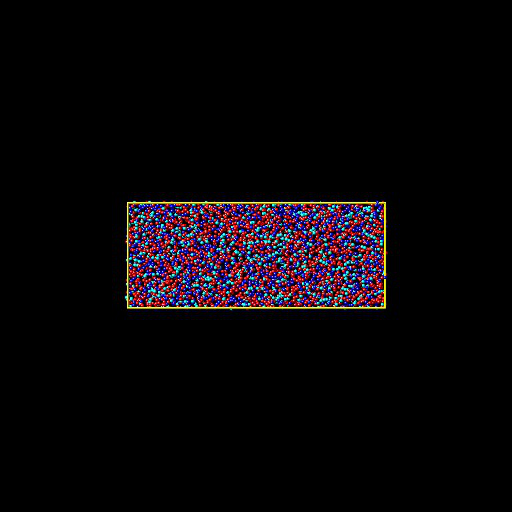

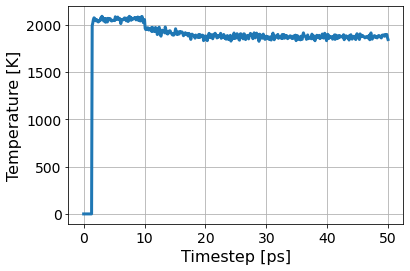

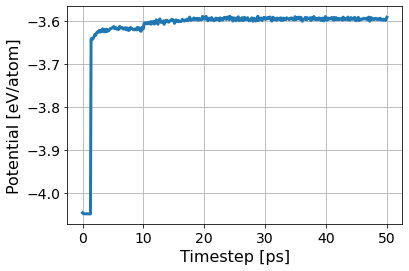

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/02dd46cee4874f7199a32368307ee8f5/inputs.yaml
       RUNS/02dd46cee4874f7199a32368307ee8f5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/02dd46cee4874f7199a32368307ee8f5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:49<00:00, 61.98s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/02dd46cee4874f7199a32368307ee8f5/inputs.yaml
       RUNS/02dd46cee4874f7199a32368307ee8f5
Predicted melting temperature for this potential:  1757.802238308458
95% confidence interval:  2.2884135121533045
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9893663194444444
Simulation Success Flag 0.0
Crystal Structure Info:  [   8.   12.    0.   29.    0. 4559. 4608.]


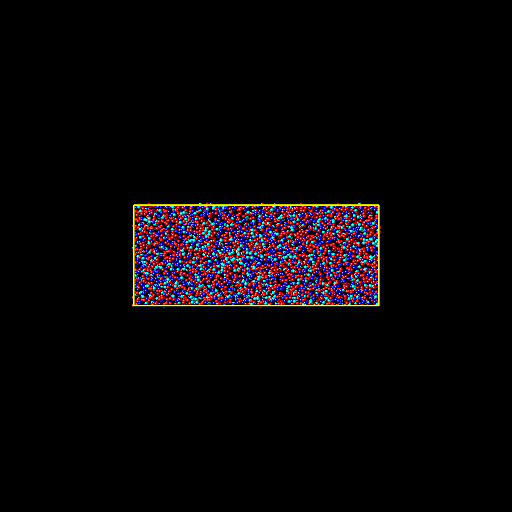

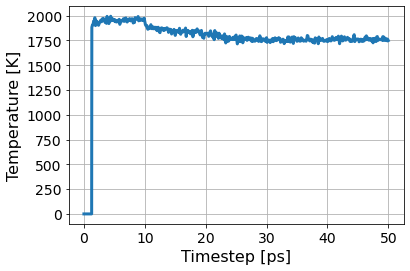

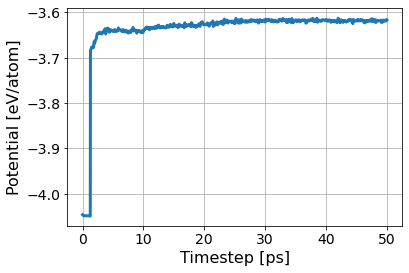

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fb384d3f9bd6495cbd5412fdf7a771c9/inputs.yaml
       RUNS/fb384d3f9bd6495cbd5412fdf7a771c9
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/fb384d3f9bd6495cbd5412fdf7a771c9/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:03<00:00, 60.16s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fb384d3f9bd6495cbd5412fdf7a771c9/inputs.yaml
       RUNS/fb384d3f9bd6495cbd5412fdf7a771c9
Predicted melting temperature for this potential:  1746.8365223880596
95% confidence interval:  2.7916717311861237
Fraction of system solid:  0.12760416666666666
Fraction of system liquid:  0.8563368055555556
Simulation Success Flag 0.0
Crystal Structure Info:  [5.880e+02 4.200e+01 2.000e+01 1.100e+01 1.000e+00 3.946e+03 4.608e+03]


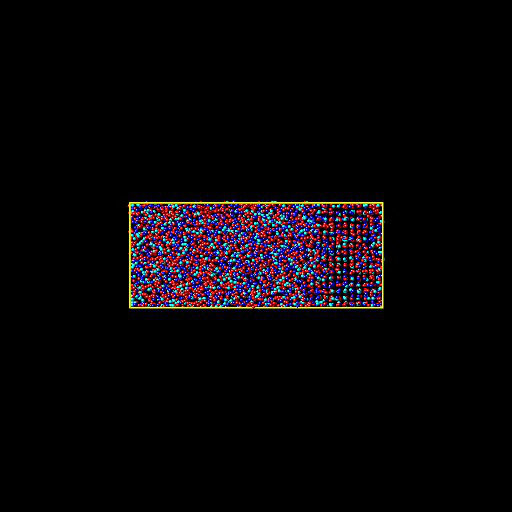

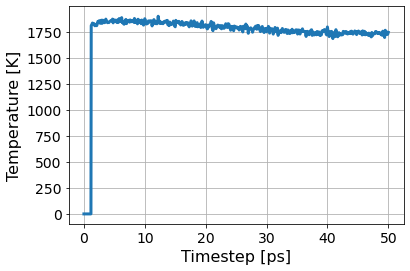

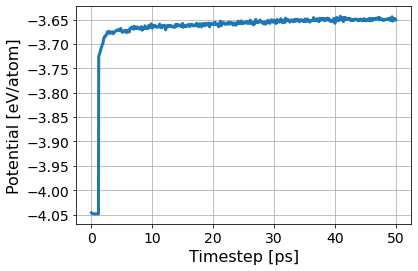

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/71d19a9554c048e0b3aa13887c95b3b9/inputs.yaml
       RUNS/71d19a9554c048e0b3aa13887c95b3b9
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/71d19a9554c048e0b3aa13887c95b3b9/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:26<00:00, 61.07s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/71d19a9554c048e0b3aa13887c95b3b9/inputs.yaml
       RUNS/71d19a9554c048e0b3aa13887c95b3b9
Predicted melting temperature for this potential:  1736.5609318407962
95% confidence interval:  2.5494773198405025
Fraction of system solid:  0.30078125
Fraction of system liquid:  0.6881510416666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1.386e+03 3.600e+01 4.000e+00 1.100e+01 0.000e+00 3.171e+03 4.608e+03]


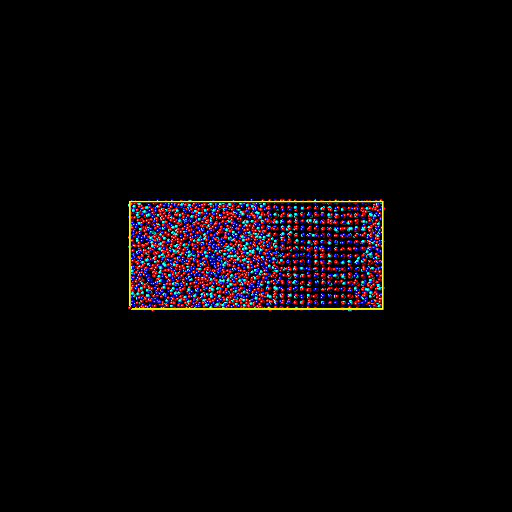

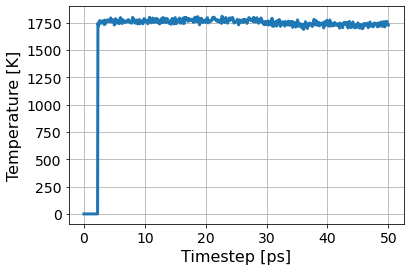

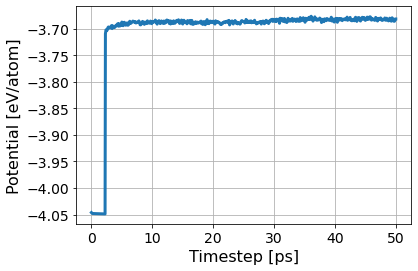

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b28f5707cddd4a43843f8a6929100c07/inputs.yaml
       RUNS/b28f5707cddd4a43843f8a6929100c07
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b28f5707cddd4a43843f8a6929100c07/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:43<00:00, 61.73s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b28f5707cddd4a43843f8a6929100c07/inputs.yaml
       RUNS/b28f5707cddd4a43843f8a6929100c07
Predicted melting temperature for this potential:  1730.1766004975125
95% confidence interval:  2.452064603916551
Fraction of system solid:  0.4759114583333333
Fraction of system liquid:  0.5101996527777778
Simulation Success Flag 1.0
Crystal Structure Info:  [2193.   34.   18.   12.    0. 2351. 4608.]


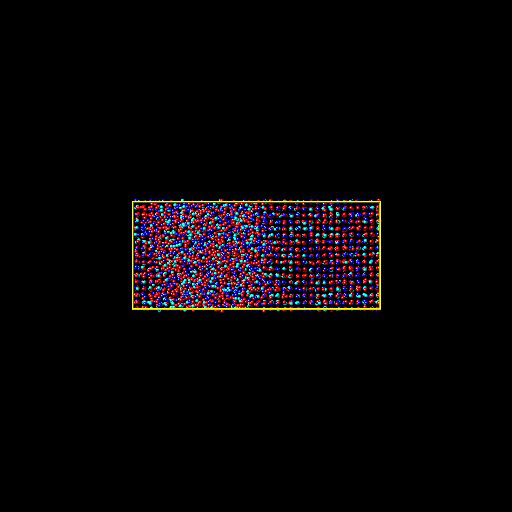

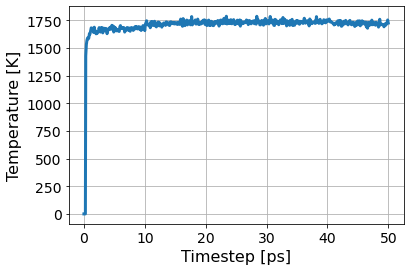

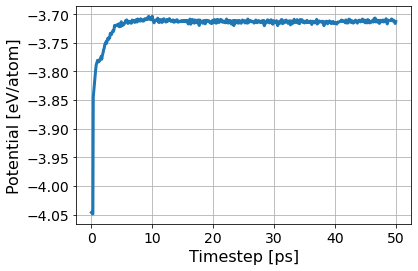

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  1
276
[0.4, 0.1, 0.2, 0.1, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7178a51607d44769bfb5f721a288c60c/inputs.yaml
       RUNS/7178a51607d44769bfb5f721a288c60c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7178a51607d44769bfb5f721a288c60c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [26:52<00:00, 64.49s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7178a51607d44769bfb5f721a288c60c/inputs.yaml
       RUNS/7178a51607d44769bfb5f721a288c60c
Predicted melting temperature for this potential:  1957.9899905472637
95% confidence interval:  2.5164152438807488
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.990234375
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 9.000e+00 3.000e+00 2.600e+01 2.000e+00 4.563e+03 4.608e+03]


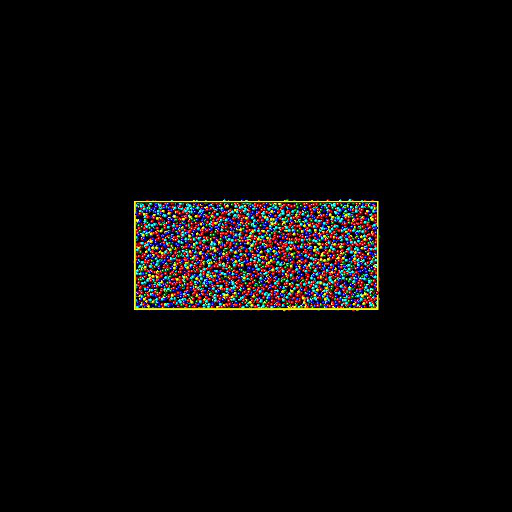

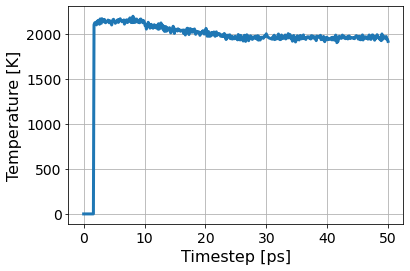

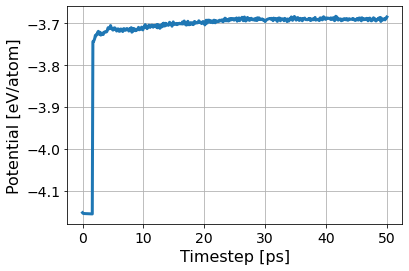

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b403bf0674d04328ad8aba3d49a6d361/inputs.yaml
       RUNS/b403bf0674d04328ad8aba3d49a6d361
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b403bf0674d04328ad8aba3d49a6d361/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [26:59<00:00, 64.76s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b403bf0674d04328ad8aba3d49a6d361/inputs.yaml
       RUNS/b403bf0674d04328ad8aba3d49a6d361
Predicted melting temperature for this potential:  1942.6948547263682
95% confidence interval:  2.5963497796366686
Fraction of system solid:  0.1349826388888889
Fraction of system liquid:  0.8478732638888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.220e+02 5.200e+01 1.200e+01 1.400e+01 1.000e+00 3.907e+03 4.608e+03]


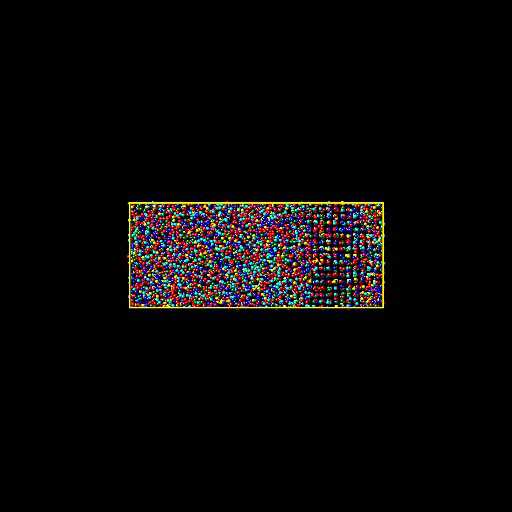

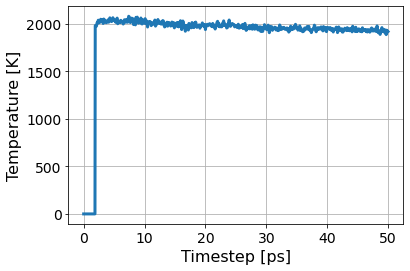

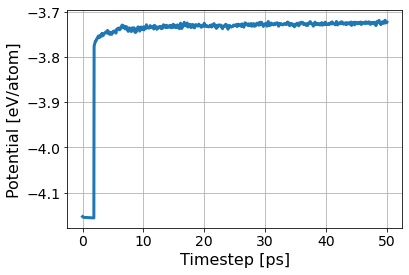

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2017a6c21ad14d0ea9224d2f3f15f07a/inputs.yaml
       RUNS/2017a6c21ad14d0ea9224d2f3f15f07a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2017a6c21ad14d0ea9224d2f3f15f07a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [26:19<00:00, 63.19s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2017a6c21ad14d0ea9224d2f3f15f07a/inputs.yaml
       RUNS/2017a6c21ad14d0ea9224d2f3f15f07a
Predicted melting temperature for this potential:  1932.493114427861
95% confidence interval:  3.1797236288848683
Fraction of system solid:  0.4010416666666667
Fraction of system liquid:  0.5828993055555556
Simulation Success Flag 1.0
Crystal Structure Info:  [1848.   48.   12.   14.    0. 2686. 4608.]


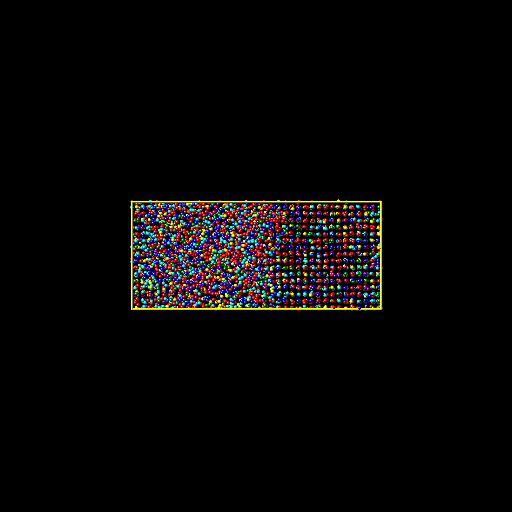

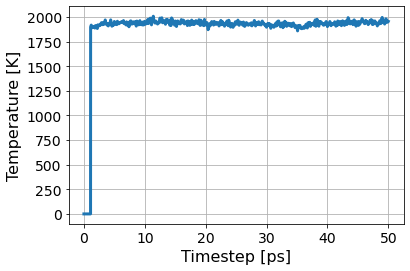

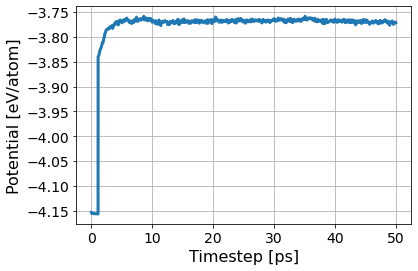

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  2
387
[0.5, 0.2, 0.0, 0.0, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7d75c7d2897c48adab83d7fcc38052a2/inputs.yaml
       RUNS/7d75c7d2897c48adab83d7fcc38052a2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7d75c7d2897c48adab83d7fcc38052a2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [25:26<00:00, 61.07s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7d75c7d2897c48adab83d7fcc38052a2/inputs.yaml
       RUNS/7d75c7d2897c48adab83d7fcc38052a2
Predicted melting temperature for this potential:  2031.802683084577
95% confidence interval:  2.5669737201011826
Fraction of system solid:  0.4264322916666667
Fraction of system liquid:  0.5562065972222222
Simulation Success Flag 1.0
Crystal Structure Info:  [1965.   41.   24.   15.    0. 2563. 4608.]


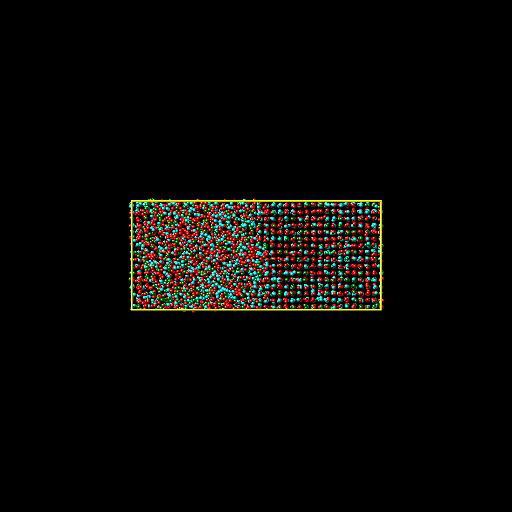

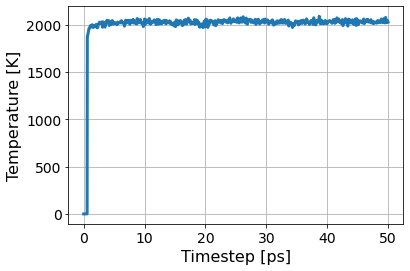

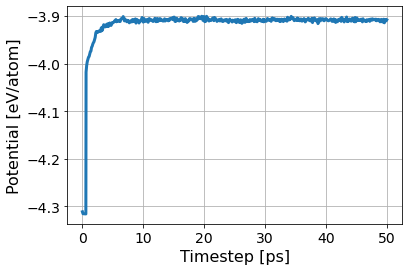

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  3
390
[0.5, 0.2, 0.1, 0.0, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/311ef3f236ba47469b4884027c08f31c/inputs.yaml
       RUNS/311ef3f236ba47469b4884027c08f31c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/311ef3f236ba47469b4884027c08f31c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [26:14<00:00, 62.99s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/311ef3f236ba47469b4884027c08f31c/inputs.yaml
       RUNS/311ef3f236ba47469b4884027c08f31c
Predicted melting temperature for this potential:  1899.3118064676617
95% confidence interval:  4.66197210434983
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.500e+01 2.000e+00 3.100e+01 2.000e+00 4.544e+03 4.608e+03]


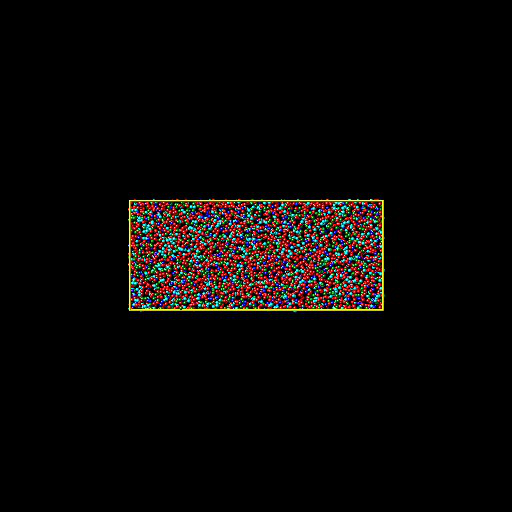

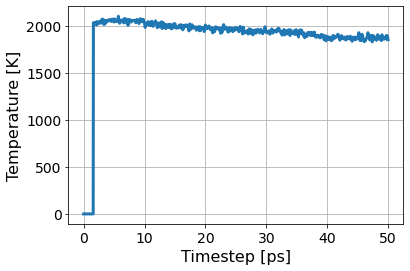

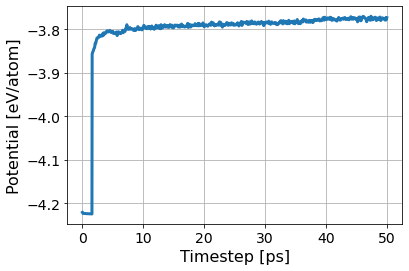

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b8a94562a93c4bc1813a9be603ac16cd/inputs.yaml
       RUNS/b8a94562a93c4bc1813a9be603ac16cd
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b8a94562a93c4bc1813a9be603ac16cd/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [23:31<00:00, 56.48s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b8a94562a93c4bc1813a9be603ac16cd/inputs.yaml
       RUNS/b8a94562a93c4bc1813a9be603ac16cd
Predicted melting temperature for this potential:  1940.6677606965175
95% confidence interval:  2.346347857668938
Fraction of system solid:  0.3734809027777778
Fraction of system liquid:  0.6041666666666666
Simulation Success Flag 1.0
Crystal Structure Info:  [1721.   59.   35.    9.    0. 2784. 4608.]


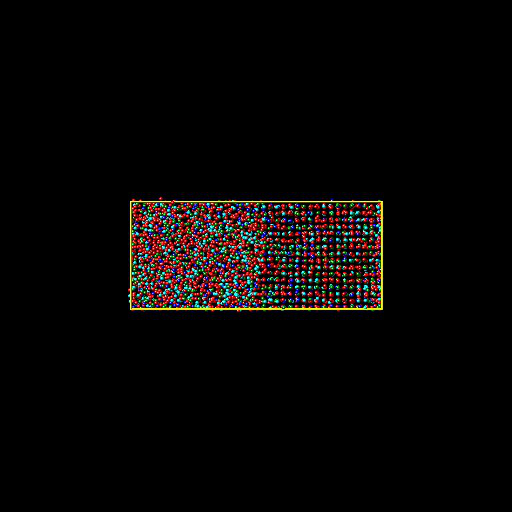

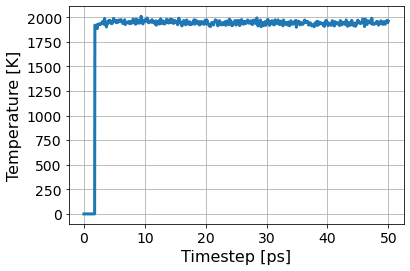

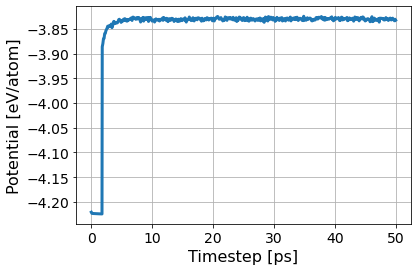

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  4
392
[0.5, 0.2, 0.3, 0.0, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/aec7e65a42ac4217a29b0689c22cd087/inputs.yaml
       RUNS/aec7e65a42ac4217a29b0689c22cd087
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/aec7e65a42ac4217a29b0689c22cd087/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:14<00:00, 43.79s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/aec7e65a42ac4217a29b0689c22cd087/inputs.yaml
       RUNS/aec7e65a42ac4217a29b0689c22cd087
Predicted melting temperature for this potential:  1837.1079427860695
95% confidence interval:  2.505367600464341
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9926215277777778
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.600e+01 1.000e+00 9.000e+00 2.000e+00 4.574e+03 4.608e+03]


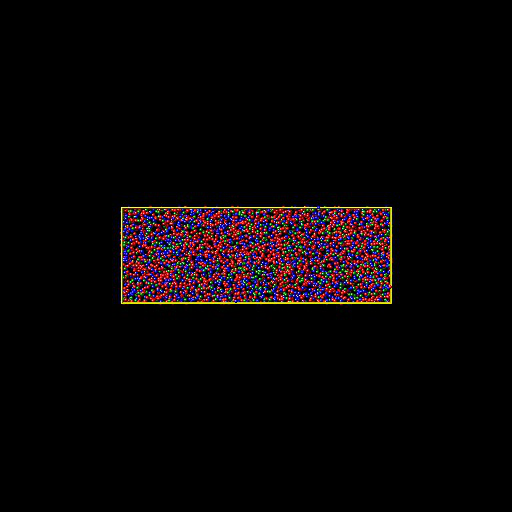

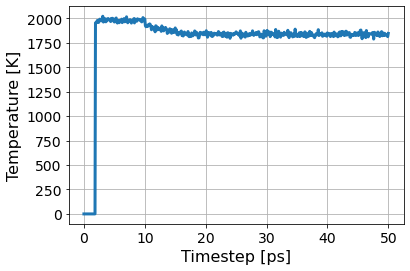

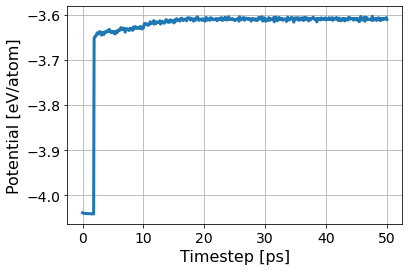

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3a8c5793ad274c8ea7548e1764e3d3db/inputs.yaml
       RUNS/3a8c5793ad274c8ea7548e1764e3d3db
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3a8c5793ad274c8ea7548e1764e3d3db/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:52<00:00, 42.88s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3a8c5793ad274c8ea7548e1764e3d3db/inputs.yaml
       RUNS/3a8c5793ad274c8ea7548e1764e3d3db
Predicted melting temperature for this potential:  1709.8382482587067
95% confidence interval:  2.3790775223373295
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.100e+01 0.000e+00 3.100e+01 1.000e+00 4.551e+03 4.608e+03]


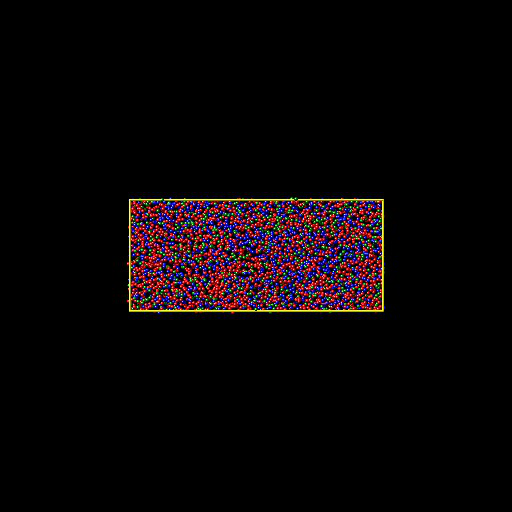

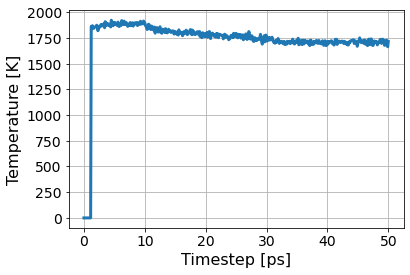

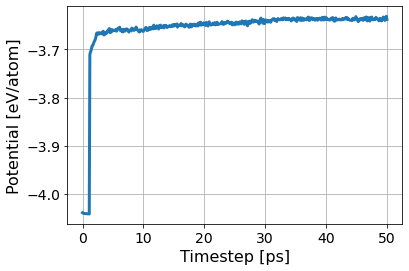

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5d8f8cee8e254738aaf0b6bcfd91d93b/inputs.yaml
       RUNS/5d8f8cee8e254738aaf0b6bcfd91d93b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5d8f8cee8e254738aaf0b6bcfd91d93b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:16<00:00, 43.87s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5d8f8cee8e254738aaf0b6bcfd91d93b/inputs.yaml
       RUNS/5d8f8cee8e254738aaf0b6bcfd91d93b
Predicted melting temperature for this potential:  1733.3012029850747
95% confidence interval:  1.9903168853317137
Fraction of system solid:  0.2502170138888889
Fraction of system liquid:  0.7354600694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [1153.   37.   18.   11.    0. 3389. 4608.]


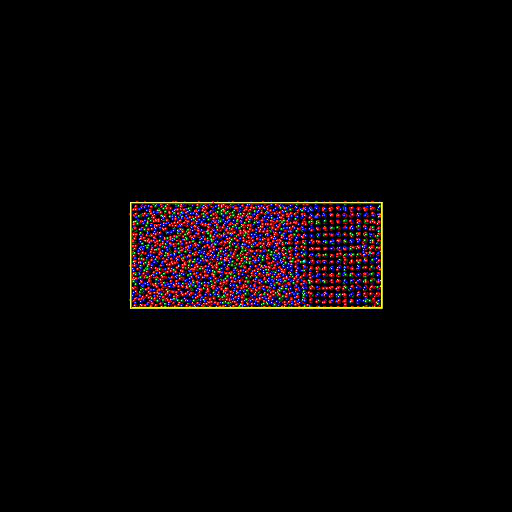

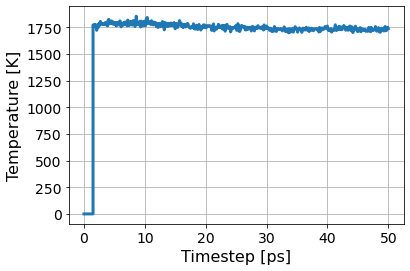

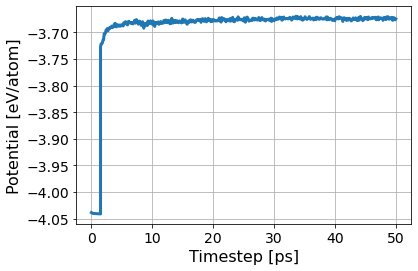

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/692e962898f247769f1aa7114482eb73/inputs.yaml
       RUNS/692e962898f247769f1aa7114482eb73
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/692e962898f247769f1aa7114482eb73/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.05s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/692e962898f247769f1aa7114482eb73/inputs.yaml
       RUNS/692e962898f247769f1aa7114482eb73
Predicted melting temperature for this potential:  1738.044654228856
95% confidence interval:  2.5271509556624565
Fraction of system solid:  0.4470486111111111
Fraction of system liquid:  0.5403645833333334
Simulation Success Flag 1.0
Crystal Structure Info:  [2.060e+03 3.200e+01 1.700e+01 7.000e+00 2.000e+00 2.490e+03 4.608e+03]


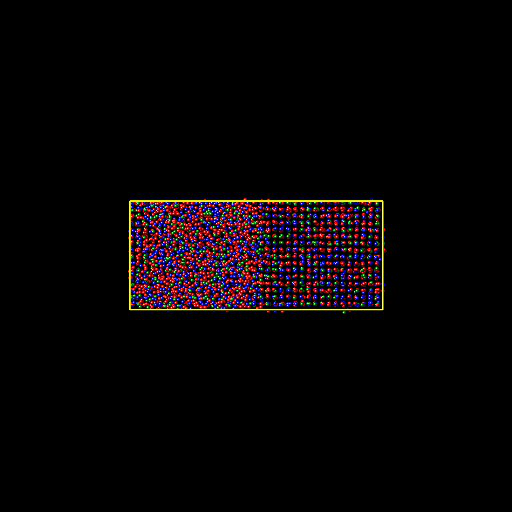

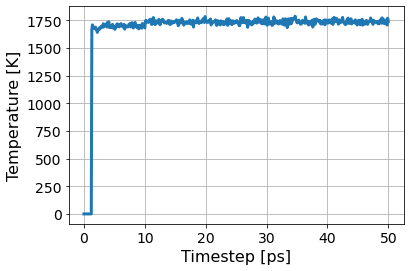

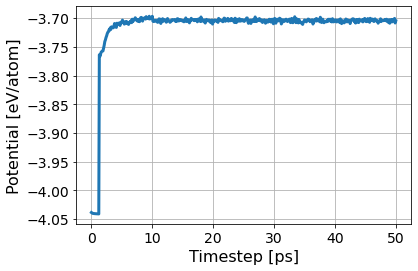

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  5
539
[0.4, 0.4, 0.2, 0.0, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7c90313d76474682a6f5e9884a737787/inputs.yaml
       RUNS/7c90313d76474682a6f5e9884a737787
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7c90313d76474682a6f5e9884a737787/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:18<00:00, 43.92s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7c90313d76474682a6f5e9884a737787/inputs.yaml
       RUNS/7c90313d76474682a6f5e9884a737787
Predicted melting temperature for this potential:  1991.0217825870645
95% confidence interval:  2.689624531787325
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9893663194444444
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.900e+01 1.000e+00 1.400e+01 0.000e+00 4.559e+03 4.608e+03]


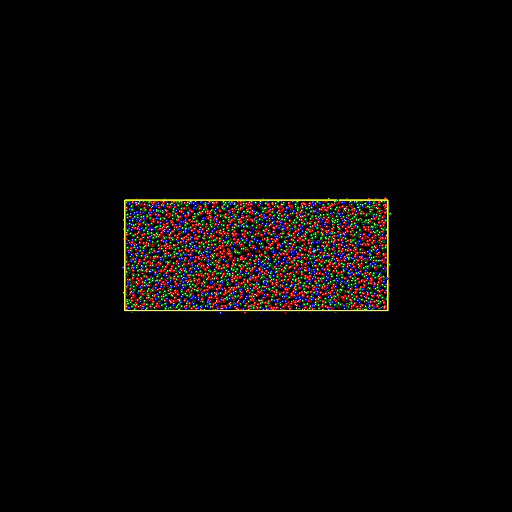

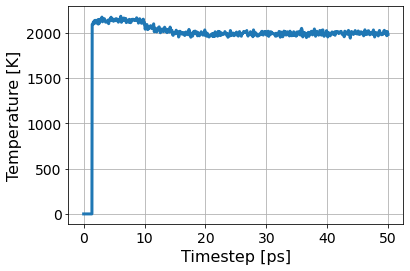

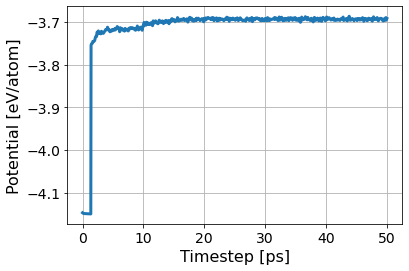

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2bbe1637dc4242c181005ea90715616f/inputs.yaml
       RUNS/2bbe1637dc4242c181005ea90715616f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2bbe1637dc4242c181005ea90715616f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:25<00:00, 44.22s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2bbe1637dc4242c181005ea90715616f/inputs.yaml
       RUNS/2bbe1637dc4242c181005ea90715616f
Predicted melting temperature for this potential:  1858.436776119403
95% confidence interval:  2.5552459556927714
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9889322916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.300e+01 2.000e+00 2.000e+01 0.000e+00 4.557e+03 4.608e+03]


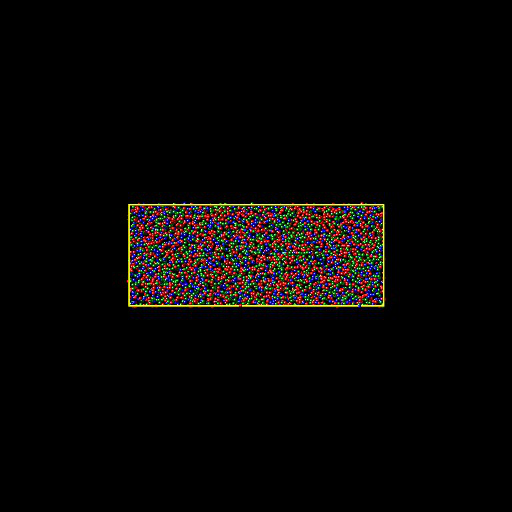

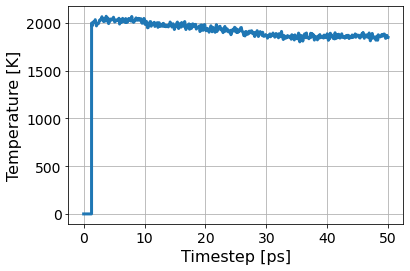

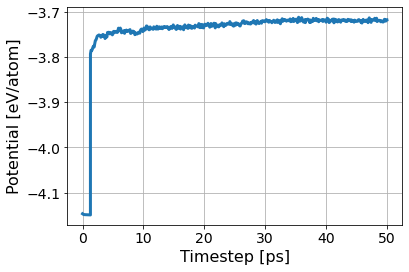

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f26ff9f994144cafa985e56029393a38/inputs.yaml
       RUNS/f26ff9f994144cafa985e56029393a38
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f26ff9f994144cafa985e56029393a38/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:08<00:00, 43.52s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f26ff9f994144cafa985e56029393a38/inputs.yaml
       RUNS/f26ff9f994144cafa985e56029393a38
Predicted melting temperature for this potential:  1854.477177114428
95% confidence interval:  2.677355355661219
Fraction of system solid:  0.2009548611111111
Fraction of system liquid:  0.7829861111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [ 926.   36.   20.   18.    0. 3608. 4608.]


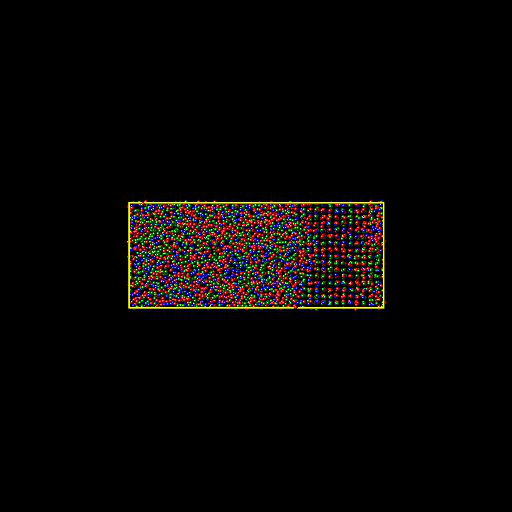

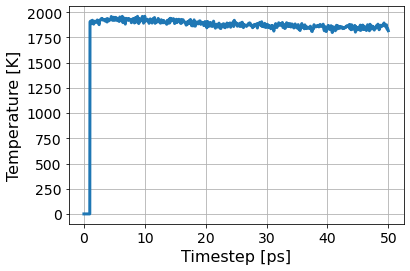

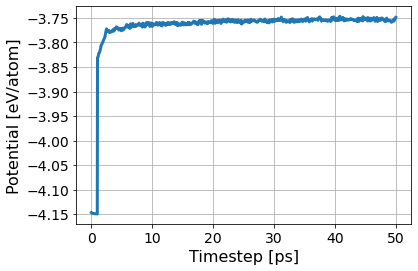

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/add6873b3224447f8572b87d6021f787/inputs.yaml
       RUNS/add6873b3224447f8572b87d6021f787
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/add6873b3224447f8572b87d6021f787/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:27<00:00, 44.30s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/add6873b3224447f8572b87d6021f787/inputs.yaml
       RUNS/add6873b3224447f8572b87d6021f787
Predicted melting temperature for this potential:  1895.2175915422883
95% confidence interval:  2.4110593693286035
Fraction of system solid:  0.4937065972222222
Fraction of system liquid:  0.4867621527777778
Simulation Success Flag 1.0
Crystal Structure Info:  [2275.   58.   24.    8.    0. 2243. 4608.]


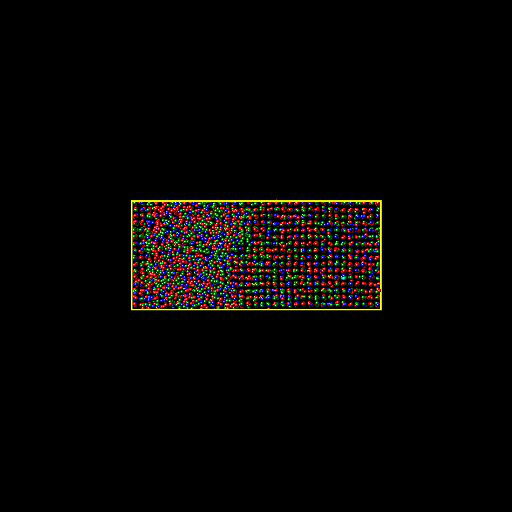

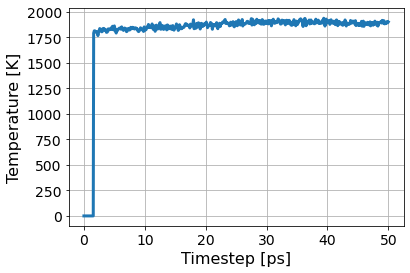

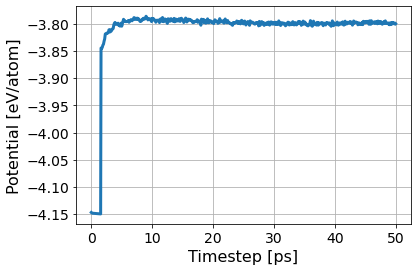

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  6
150
[0.4, 0.0, 0.3, 0.0, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/91a6a2e42ca5418bac0f3f79f716d322/inputs.yaml
       RUNS/91a6a2e42ca5418bac0f3f79f716d322
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/91a6a2e42ca5418bac0f3f79f716d322/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:12<00:00, 43.70s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/91a6a2e42ca5418bac0f3f79f716d322/inputs.yaml
       RUNS/91a6a2e42ca5418bac0f3f79f716d322
Predicted melting temperature for this potential:  1823.4084527363184
95% confidence interval:  2.342605709294923
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9917534722222222
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.800e+01 0.000e+00 1.600e+01 0.000e+00 4.570e+03 4.608e+03]


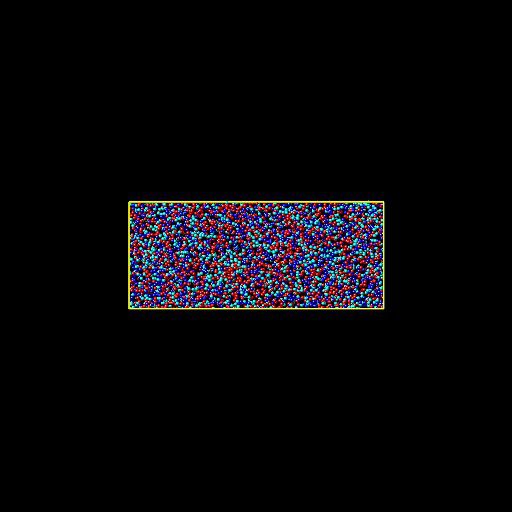

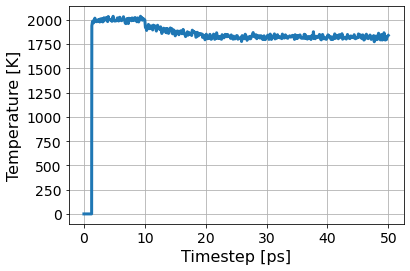

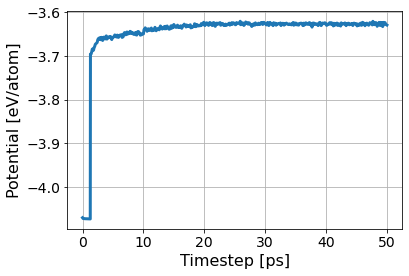

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/59a6a3f82a9b4294acf896389a964da0/inputs.yaml
       RUNS/59a6a3f82a9b4294acf896389a964da0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/59a6a3f82a9b4294acf896389a964da0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:50<00:00, 42.84s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/59a6a3f82a9b4294acf896389a964da0/inputs.yaml
       RUNS/59a6a3f82a9b4294acf896389a964da0
Predicted melting temperature for this potential:  1783.2062174129353
95% confidence interval:  4.12133737512646
Fraction of system solid:  0.03211805555555555
Fraction of system liquid:  0.9520399305555556
Simulation Success Flag 0.0
Crystal Structure Info:  [ 148.   42.   13.   18.    0. 4387. 4608.]


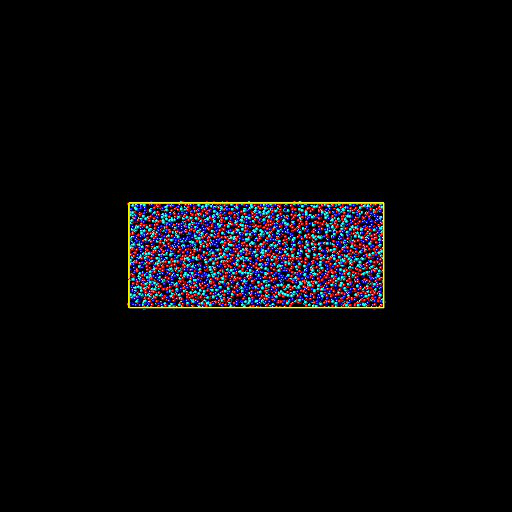

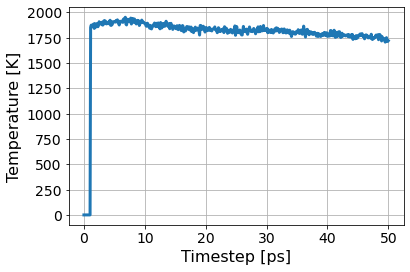

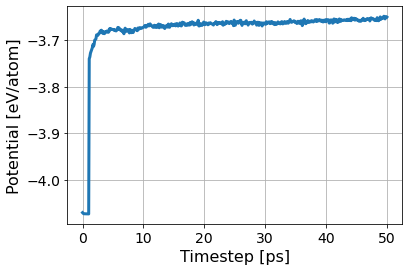

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1b5c9cc32db84136a0b9201209addd6e/inputs.yaml
       RUNS/1b5c9cc32db84136a0b9201209addd6e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1b5c9cc32db84136a0b9201209addd6e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:19<00:00, 43.97s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1b5c9cc32db84136a0b9201209addd6e/inputs.yaml
       RUNS/1b5c9cc32db84136a0b9201209addd6e
Predicted melting temperature for this potential:  1766.2013656716415
95% confidence interval:  2.249713274119032
Fraction of system solid:  0.2903645833333333
Fraction of system liquid:  0.6909722222222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1.338e+03 4.400e+01 2.200e+01 1.900e+01 1.000e+00 3.184e+03 4.608e+03]


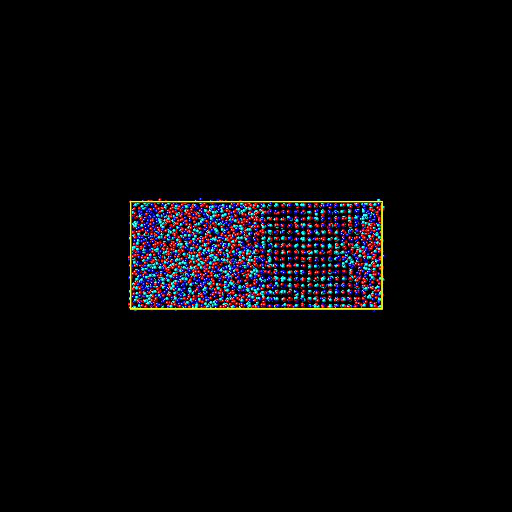

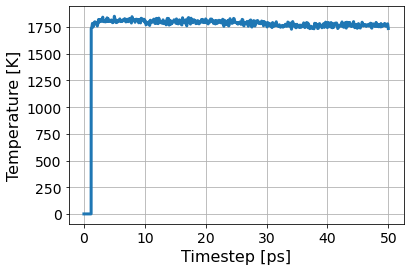

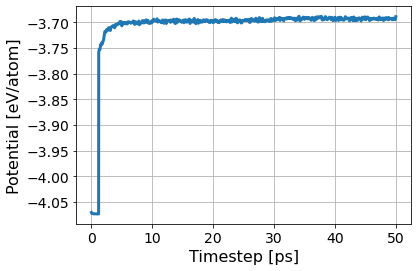

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f7a55a60bf9545c49537fb6564080871/inputs.yaml
       RUNS/f7a55a60bf9545c49537fb6564080871
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f7a55a60bf9545c49537fb6564080871/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:29<00:00, 44.38s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f7a55a60bf9545c49537fb6564080871/inputs.yaml
       RUNS/f7a55a60bf9545c49537fb6564080871
Predicted melting temperature for this potential:  1754.658160199005
95% confidence interval:  2.716829476482666
Fraction of system solid:  0.4713541666666667
Fraction of system liquid:  0.5141059027777778
Simulation Success Flag 1.0
Crystal Structure Info:  [2172.   43.   18.    6.    0. 2369. 4608.]


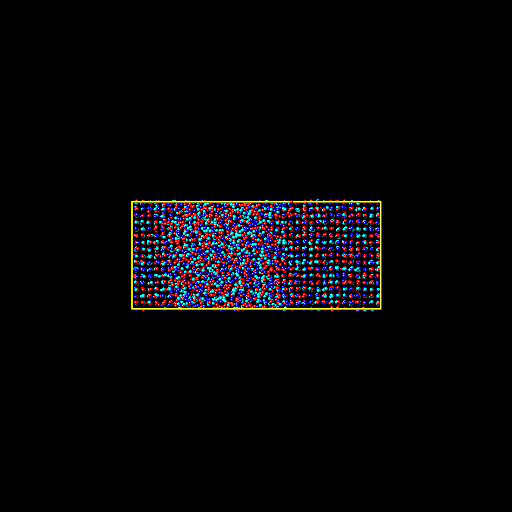

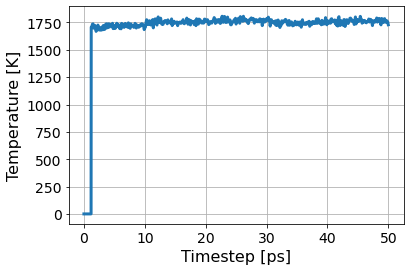

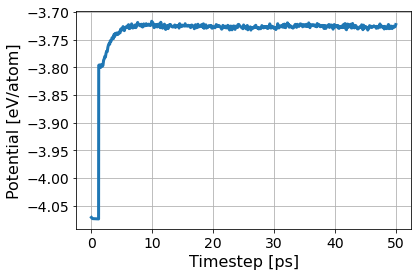

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  7
258
[0.3, 0.1, 0.3, 0.3, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/10ffb0474a2844b8bc9f1c0a594c3b30/inputs.yaml
       RUNS/10ffb0474a2844b8bc9f1c0a594c3b30
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/10ffb0474a2844b8bc9f1c0a594c3b30/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:54<00:00, 45.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/10ffb0474a2844b8bc9f1c0a594c3b30/inputs.yaml
       RUNS/10ffb0474a2844b8bc9f1c0a594c3b30
Predicted melting temperature for this potential:  2087.653446268657
95% confidence interval:  2.8733001216228358
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9880642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 2.000e+01 0.000e+00 2.400e+01 3.000e+00 4.553e+03 4.608e+03]


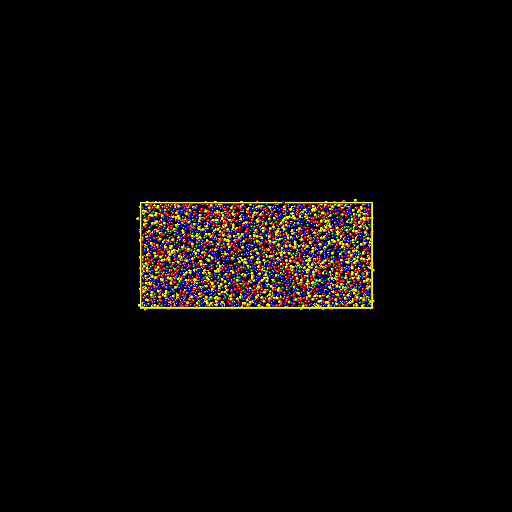

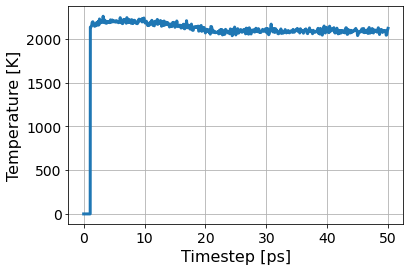

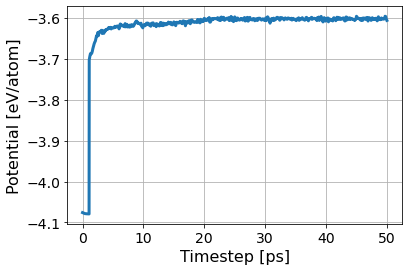

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/08381d44b98b47008f32180cee328a4e/inputs.yaml
       RUNS/08381d44b98b47008f32180cee328a4e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/08381d44b98b47008f32180cee328a4e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:48<00:00, 45.13s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/08381d44b98b47008f32180cee328a4e/inputs.yaml
       RUNS/08381d44b98b47008f32180cee328a4e
Predicted melting temperature for this potential:  1967.2083189054729
95% confidence interval:  3.4702860240497047
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9898003472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 2.300e+01 1.000e+00 2.100e+01 0.000e+00 4.561e+03 4.608e+03]


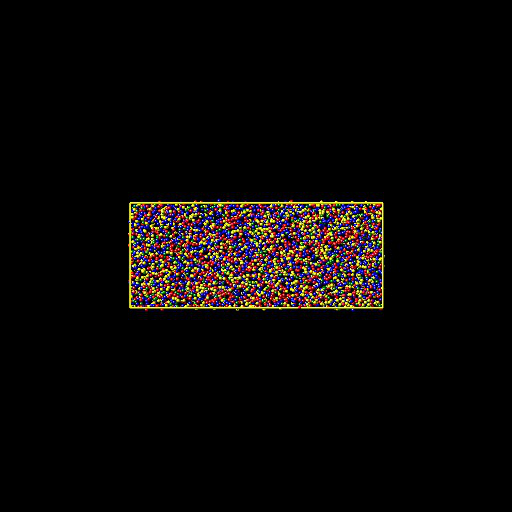

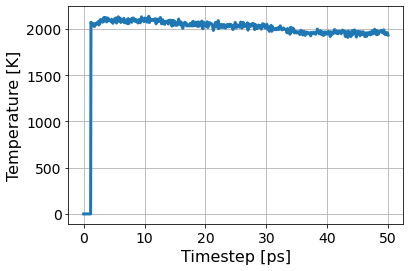

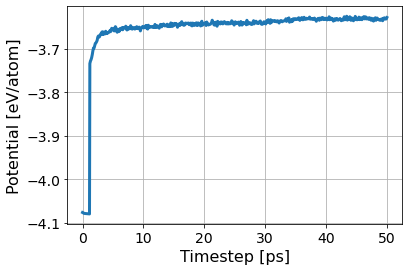

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/dff102bf9e994a34afe20256f28e9d6d/inputs.yaml
       RUNS/dff102bf9e994a34afe20256f28e9d6d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/dff102bf9e994a34afe20256f28e9d6d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:44<00:00, 44.99s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/dff102bf9e994a34afe20256f28e9d6d/inputs.yaml
       RUNS/dff102bf9e994a34afe20256f28e9d6d
Predicted melting temperature for this potential:  1989.2216328358206
95% confidence interval:  2.937585644332646
Fraction of system solid:  0.2599826388888889
Fraction of system liquid:  0.7241753472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1198.   50.   12.   11.    0. 3337. 4608.]


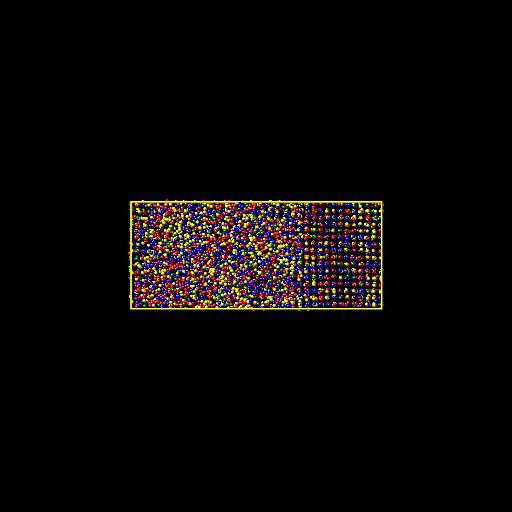

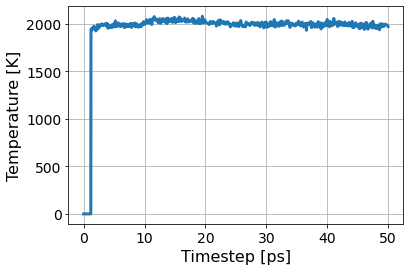

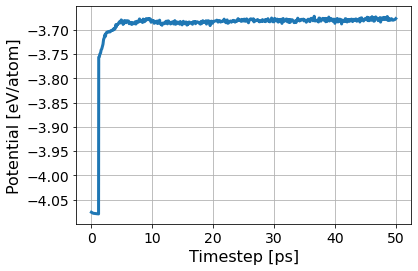

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5ad50827fcc34ec6a945717fa9ee58b8/inputs.yaml
       RUNS/5ad50827fcc34ec6a945717fa9ee58b8
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5ad50827fcc34ec6a945717fa9ee58b8/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:53<00:00, 45.33s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5ad50827fcc34ec6a945717fa9ee58b8/inputs.yaml
       RUNS/5ad50827fcc34ec6a945717fa9ee58b8
Predicted melting temperature for this potential:  1970.845693034826
95% confidence interval:  2.474514615995033
Fraction of system solid:  0.5101996527777778
Fraction of system liquid:  0.4761284722222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2351.   31.   19.   13.    0. 2194. 4608.]


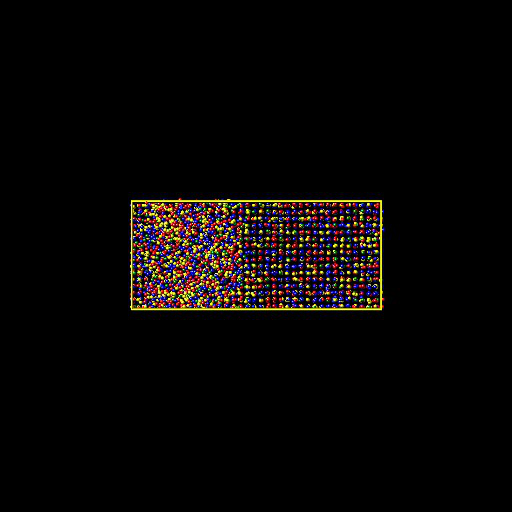

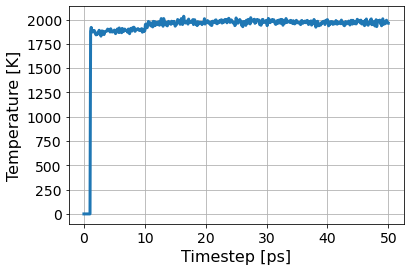

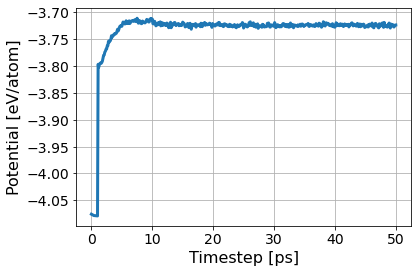

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  8
146
[0.4, 0.0, 0.2, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d37af821b238418aac9bd1a52d5d4d0d/inputs.yaml
       RUNS/d37af821b238418aac9bd1a52d5d4d0d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d37af821b238418aac9bd1a52d5d4d0d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:05<00:00, 43.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d37af821b238418aac9bd1a52d5d4d0d/inputs.yaml
       RUNS/d37af821b238418aac9bd1a52d5d4d0d
Predicted melting temperature for this potential:  1975.1897751243782
95% confidence interval:  2.3353901031073856
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.000e+01 1.000e+00 1.800e+01 1.000e+00 4.562e+03 4.608e+03]


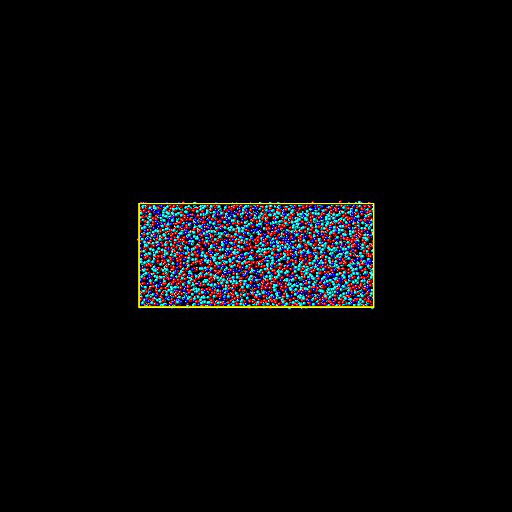

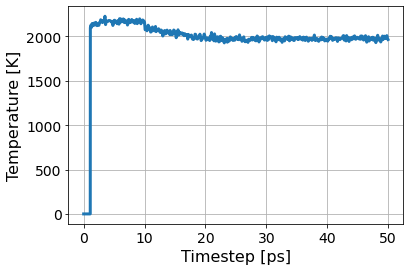

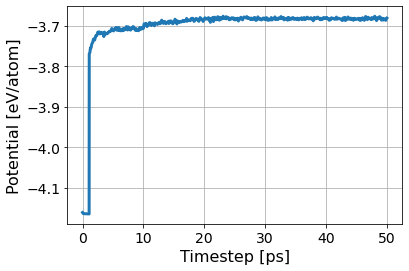

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/243e6c0d1cf8407cadb9d8f85e98be6a/inputs.yaml
       RUNS/243e6c0d1cf8407cadb9d8f85e98be6a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/243e6c0d1cf8407cadb9d8f85e98be6a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:12<00:00, 43.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/243e6c0d1cf8407cadb9d8f85e98be6a/inputs.yaml
       RUNS/243e6c0d1cf8407cadb9d8f85e98be6a
Predicted melting temperature for this potential:  1852.5726248756218
95% confidence interval:  2.58883120165989
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9889322916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.700e+01 1.000e+00 2.000e+01 0.000e+00 4.557e+03 4.608e+03]


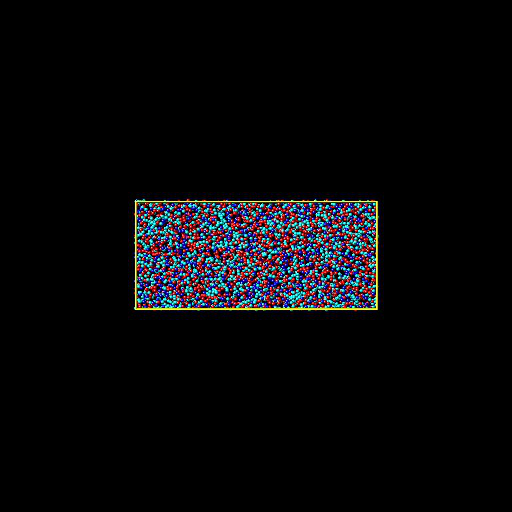

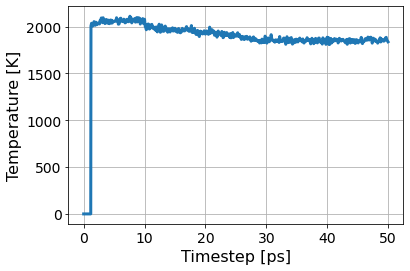

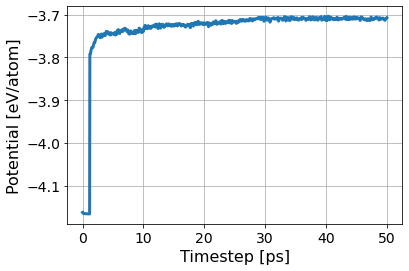

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fd78d59796254910be97763dd52913d5/inputs.yaml
       RUNS/fd78d59796254910be97763dd52913d5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/fd78d59796254910be97763dd52913d5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:37<00:00, 44.72s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fd78d59796254910be97763dd52913d5/inputs.yaml
       RUNS/fd78d59796254910be97763dd52913d5
Predicted melting temperature for this potential:  1880.4939800995028
95% confidence interval:  2.8439866187264293
Fraction of system solid:  0.22374131944444445
Fraction of system liquid:  0.7595486111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1.031e+03 3.900e+01 1.300e+01 2.300e+01 2.000e+00 3.500e+03 4.608e+03]


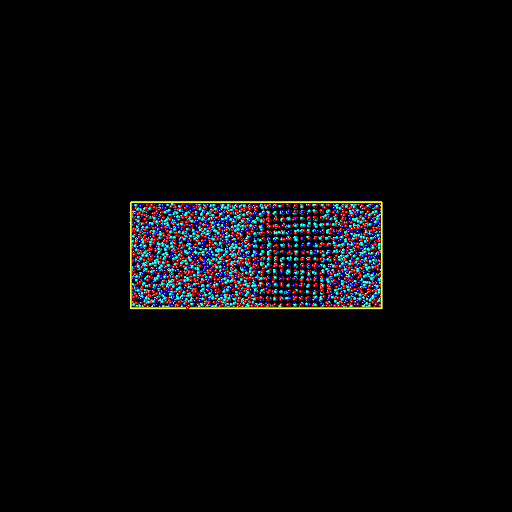

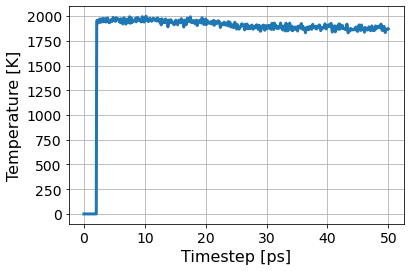

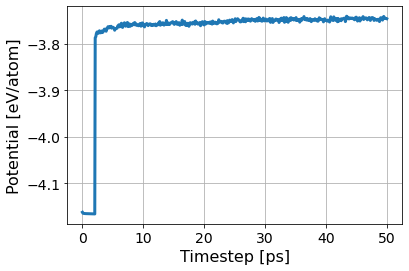

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7ad9e1156f5b464d8ef4d209f913f145/inputs.yaml
       RUNS/7ad9e1156f5b464d8ef4d209f913f145
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7ad9e1156f5b464d8ef4d209f913f145/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:45<00:00, 45.01s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7ad9e1156f5b464d8ef4d209f913f145/inputs.yaml
       RUNS/7ad9e1156f5b464d8ef4d209f913f145
Predicted melting temperature for this potential:  1869.2332457711443
95% confidence interval:  2.814026444512115
Fraction of system solid:  0.4097222222222222
Fraction of system liquid:  0.5733506944444444
Simulation Success Flag 1.0
Crystal Structure Info:  [1888.   58.    9.   11.    0. 2642. 4608.]


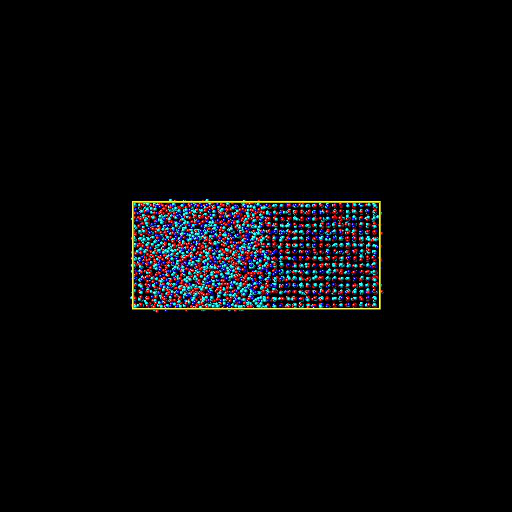

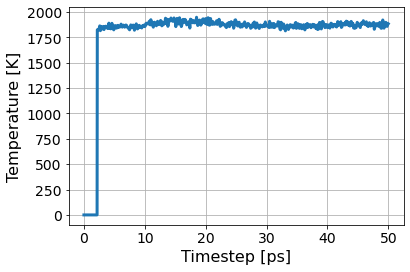

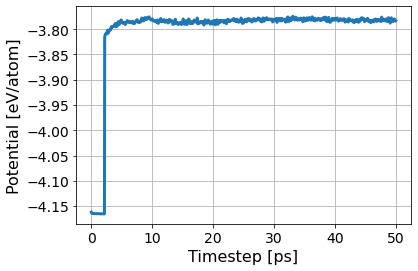

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  9
164
[0.5, 0.0, 0.1, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/80ccbfbcfe094d6f98d9de02506e1c58/inputs.yaml
       RUNS/80ccbfbcfe094d6f98d9de02506e1c58
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/80ccbfbcfe094d6f98d9de02506e1c58/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:49<00:00, 42.80s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/80ccbfbcfe094d6f98d9de02506e1c58/inputs.yaml
       RUNS/80ccbfbcfe094d6f98d9de02506e1c58
Predicted melting temperature for this potential:  1984.3627855721393
95% confidence interval:  2.8871617374701817
Fraction of system solid:  0.11024305555555555
Fraction of system liquid:  0.8656684027777778
Simulation Success Flag 0.0
Crystal Structure Info:  [5.080e+02 6.600e+01 1.900e+01 2.500e+01 1.000e+00 3.989e+03 4.608e+03]


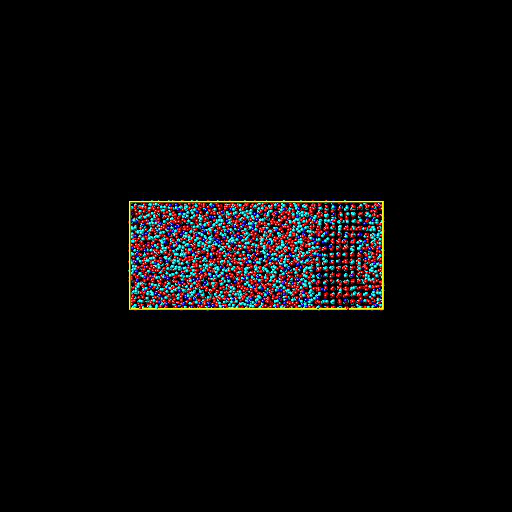

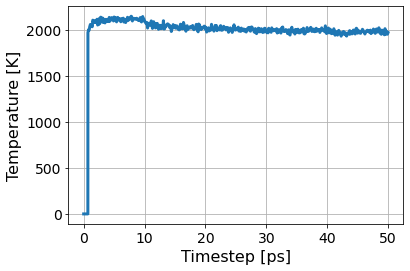

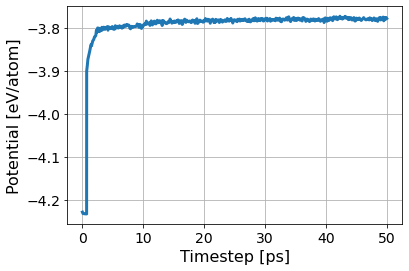

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54d9aa7682d64b8fba5298b192f97ba0/inputs.yaml
       RUNS/54d9aa7682d64b8fba5298b192f97ba0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/54d9aa7682d64b8fba5298b192f97ba0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:53<00:00, 45.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54d9aa7682d64b8fba5298b192f97ba0/inputs.yaml
       RUNS/54d9aa7682d64b8fba5298b192f97ba0
Predicted melting temperature for this potential:  1973.8877631840796
95% confidence interval:  2.75759035579777
Fraction of system solid:  0.3355034722222222
Fraction of system liquid:  0.6477864583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1546.   50.   14.   13.    0. 2985. 4608.]


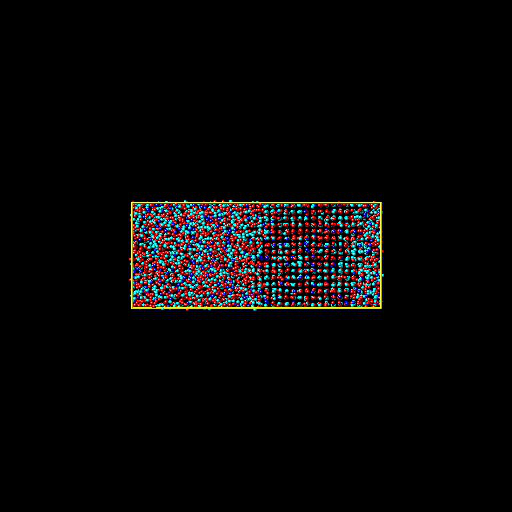

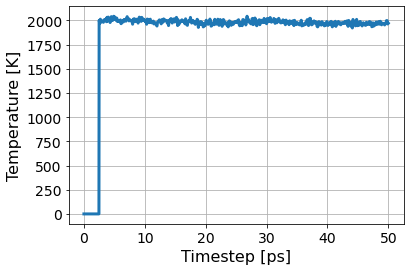

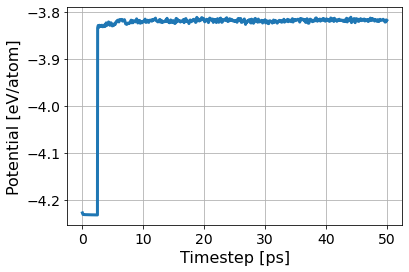

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2c5943712712481e9c6a4dbf57a3ce67/inputs.yaml
       RUNS/2c5943712712481e9c6a4dbf57a3ce67
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2c5943712712481e9c6a4dbf57a3ce67/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:40<00:00, 42.44s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2c5943712712481e9c6a4dbf57a3ce67/inputs.yaml
       RUNS/2c5943712712481e9c6a4dbf57a3ce67
Predicted melting temperature for this potential:  1935.8222975124381
95% confidence interval:  2.6976526676007198
Fraction of system solid:  0.4463975694444444
Fraction of system liquid:  0.5377604166666666
Simulation Success Flag 1.0
Crystal Structure Info:  [2057.   34.   21.   18.    0. 2478. 4608.]


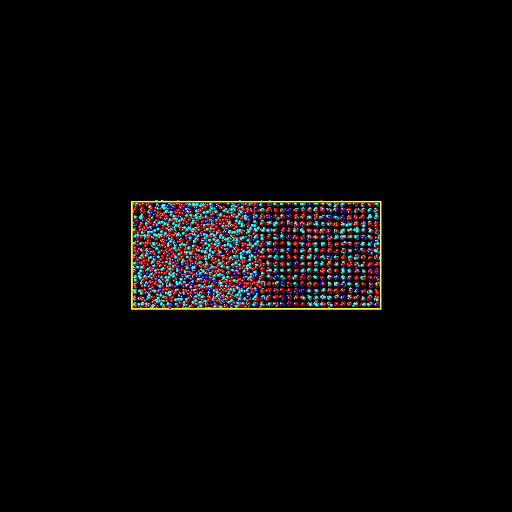

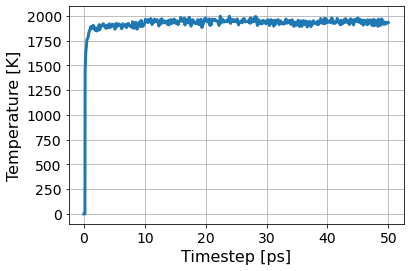

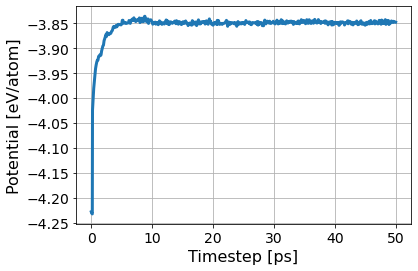

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  10
296
[0.5, 0.1, 0.3, 0.1, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/07a5ea1ad08747c9a0f741c43e9e5808/inputs.yaml
       RUNS/07a5ea1ad08747c9a0f741c43e9e5808
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/07a5ea1ad08747c9a0f741c43e9e5808/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:03<00:00, 43.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/07a5ea1ad08747c9a0f741c43e9e5808/inputs.yaml
       RUNS/07a5ea1ad08747c9a0f741c43e9e5808
Predicted melting temperature for this potential:  1902.2426830845773
95% confidence interval:  2.5543790182851533
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9911024305555556
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 1.700e+01 0.000e+00 1.300e+01 3.000e+00 4.567e+03 4.608e+03]


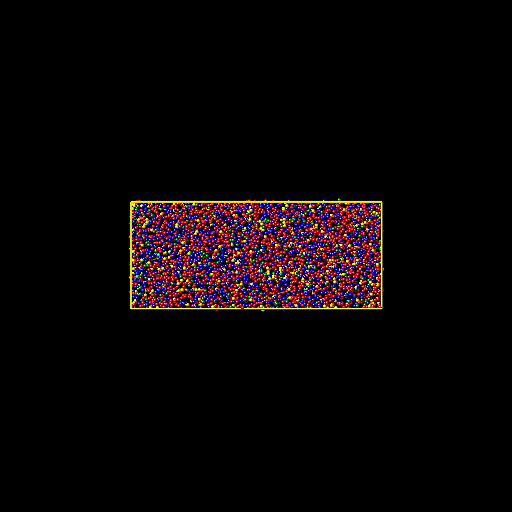

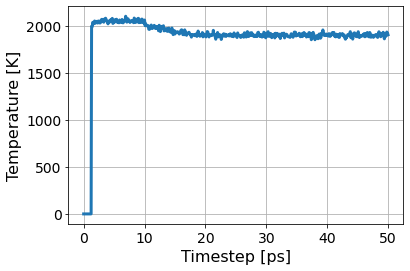

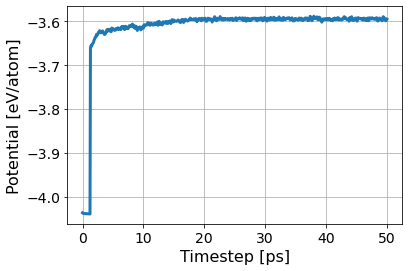

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/318cd47cddf349449547d6f2d29e1cd4/inputs.yaml
       RUNS/318cd47cddf349449547d6f2d29e1cd4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/318cd47cddf349449547d6f2d29e1cd4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:14<00:00, 43.77s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/318cd47cddf349449547d6f2d29e1cd4/inputs.yaml
       RUNS/318cd47cddf349449547d6f2d29e1cd4
Predicted melting temperature for this potential:  1788.2534338308456
95% confidence interval:  2.521692312623472
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.98828125
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.000e+01 1.000e+00 2.700e+01 1.000e+00 4.554e+03 4.608e+03]


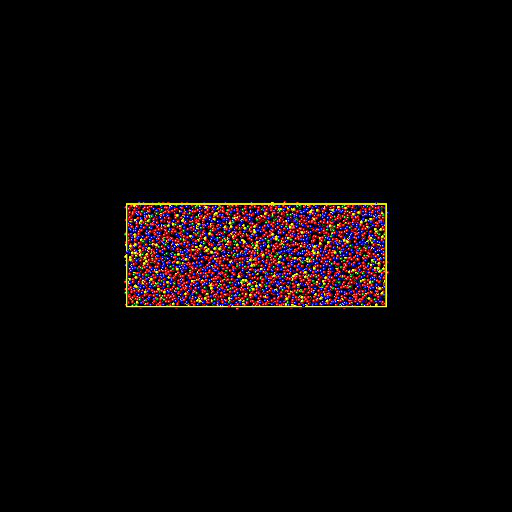

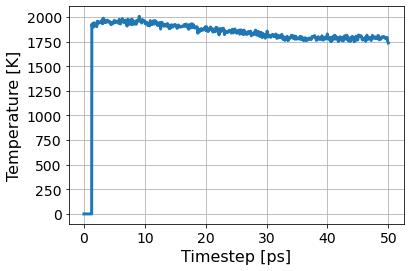

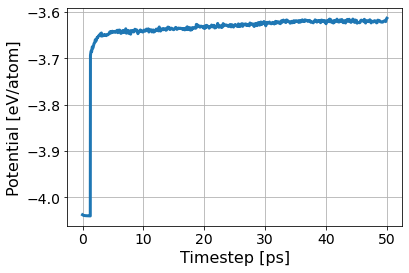

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b327dc79259c4bb387b24383fa282f99/inputs.yaml
       RUNS/b327dc79259c4bb387b24383fa282f99
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b327dc79259c4bb387b24383fa282f99/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:25<00:00, 44.21s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b327dc79259c4bb387b24383fa282f99/inputs.yaml
       RUNS/b327dc79259c4bb387b24383fa282f99
Predicted melting temperature for this potential:  1824.8329273631841
95% confidence interval:  2.6155908689375726
Fraction of system solid:  0.3235677083333333
Fraction of system liquid:  0.6603732638888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1491.   51.   11.   12.    0. 3043. 4608.]


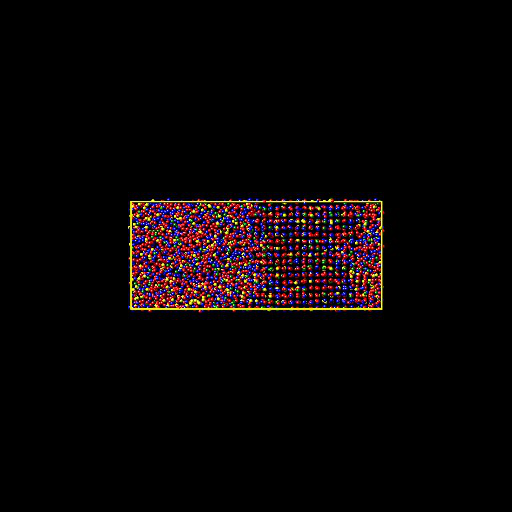

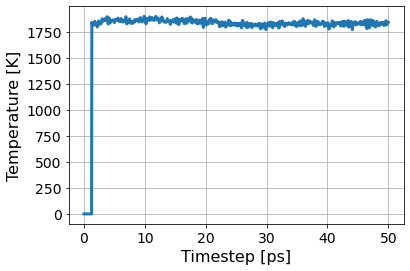

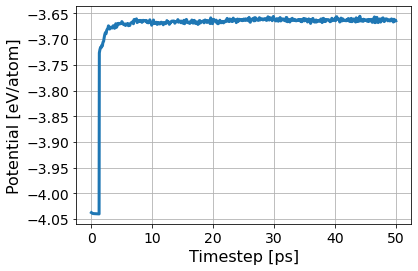

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/60718729f6e44b84bca54f7a6fdb3604/inputs.yaml
       RUNS/60718729f6e44b84bca54f7a6fdb3604
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/60718729f6e44b84bca54f7a6fdb3604/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:40<00:00, 44.80s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/60718729f6e44b84bca54f7a6fdb3604/inputs.yaml
       RUNS/60718729f6e44b84bca54f7a6fdb3604
Predicted melting temperature for this potential:  1799.2058139303485
95% confidence interval:  2.965662580467865
Fraction of system solid:  0.4225260416666667
Fraction of system liquid:  0.5651041666666666
Simulation Success Flag 1.0
Crystal Structure Info:  [1947.   33.   16.    8.    0. 2604. 4608.]


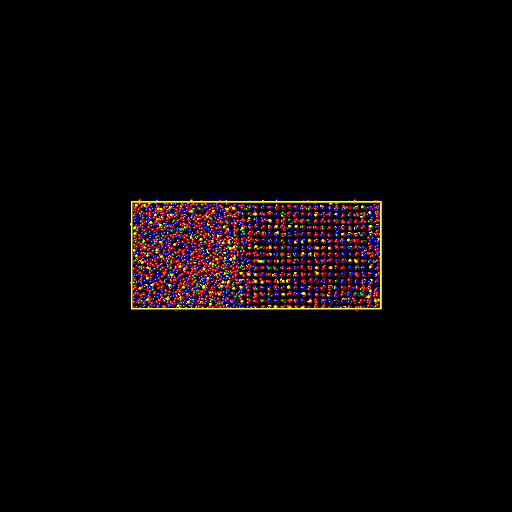

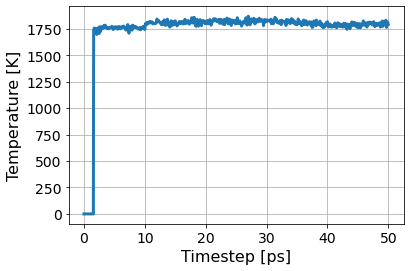

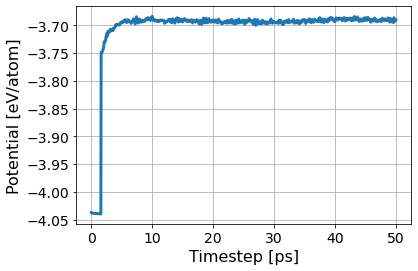

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  11
152
[0.4, 0.0, 0.3, 0.3, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e723090e673c48e38ca3c7191972ce71/inputs.yaml
       RUNS/e723090e673c48e38ca3c7191972ce71
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e723090e673c48e38ca3c7191972ce71/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:35<00:00, 42.24s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e723090e673c48e38ca3c7191972ce71/inputs.yaml
       RUNS/e723090e673c48e38ca3c7191972ce71
Predicted melting temperature for this potential:  2091.2020328358203
95% confidence interval:  3.1196407679543268
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.700e+01 1.000e+00 2.400e+01 0.000e+00 4.562e+03 4.608e+03]


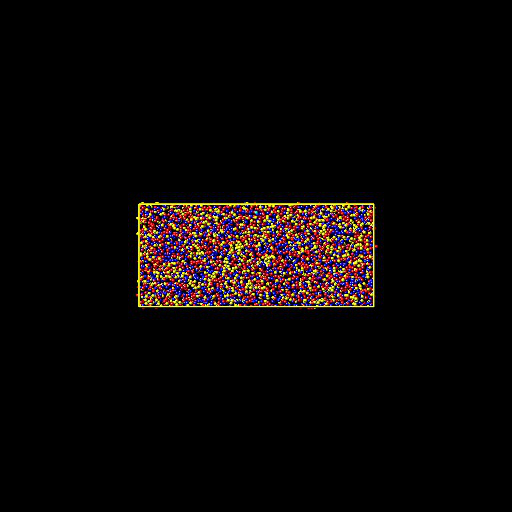

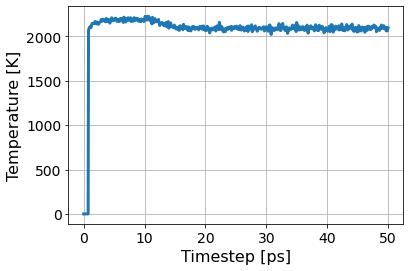

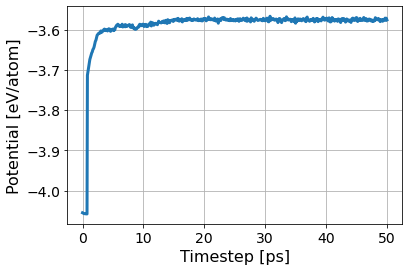

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7bbcbf4209594a47a40af8071ce2903b/inputs.yaml
       RUNS/7bbcbf4209594a47a40af8071ce2903b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7bbcbf4209594a47a40af8071ce2903b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:33<00:00, 42.16s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7bbcbf4209594a47a40af8071ce2903b/inputs.yaml
       RUNS/7bbcbf4209594a47a40af8071ce2903b
Predicted melting temperature for this potential:  1961.4938696517415
95% confidence interval:  2.7454358434372637
Fraction of system solid:  0.001953125
Fraction of system liquid:  0.9865451388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [9.000e+00 2.200e+01 0.000e+00 3.000e+01 1.000e+00 4.546e+03 4.608e+03]


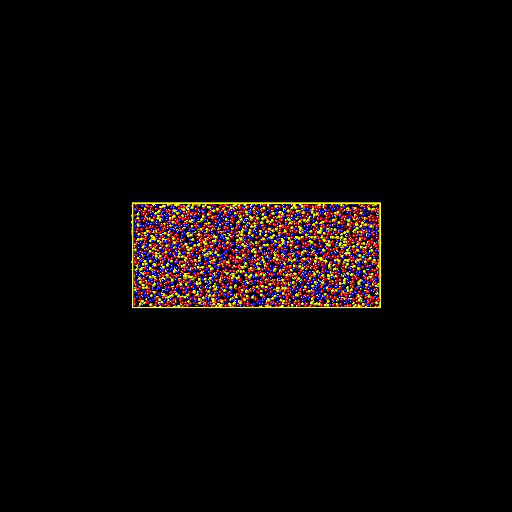

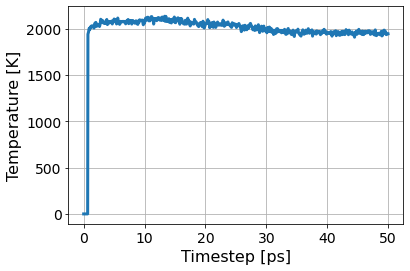

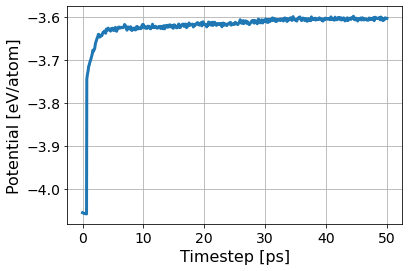

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/568626e4e21941819dcd9d37bd03dfd8/inputs.yaml
       RUNS/568626e4e21941819dcd9d37bd03dfd8
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/568626e4e21941819dcd9d37bd03dfd8/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:47<00:00, 42.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/568626e4e21941819dcd9d37bd03dfd8/inputs.yaml
       RUNS/568626e4e21941819dcd9d37bd03dfd8
Predicted melting temperature for this potential:  1964.4671666666666
95% confidence interval:  2.991408264283191
Fraction of system solid:  0.2621527777777778
Fraction of system liquid:  0.7209201388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1208.   44.   14.   20.    0. 3322. 4608.]


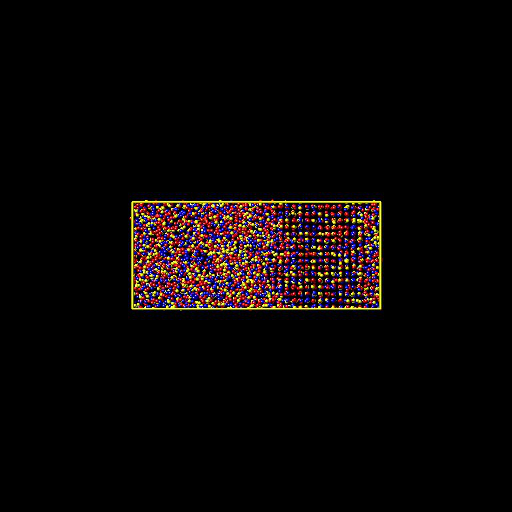

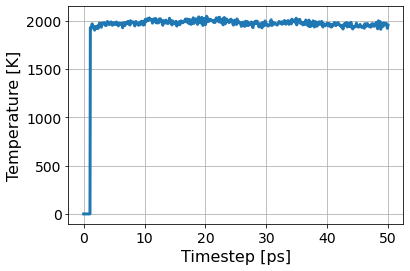

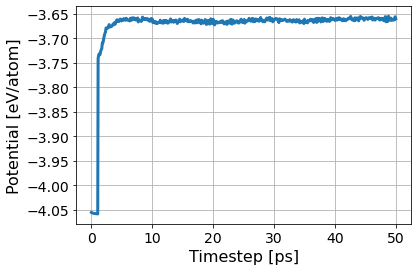

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3da72fe461714ebcaf9d1eca14de2857/inputs.yaml
       RUNS/3da72fe461714ebcaf9d1eca14de2857
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3da72fe461714ebcaf9d1eca14de2857/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:55<00:00, 43.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3da72fe461714ebcaf9d1eca14de2857/inputs.yaml
       RUNS/3da72fe461714ebcaf9d1eca14de2857
Predicted melting temperature for this potential:  1960.7372537313431
95% confidence interval:  2.847526369407512
Fraction of system solid:  0.4383680555555556
Fraction of system liquid:  0.5447048611111112
Simulation Success Flag 1.0
Crystal Structure Info:  [2020.   45.   20.   13.    0. 2510. 4608.]


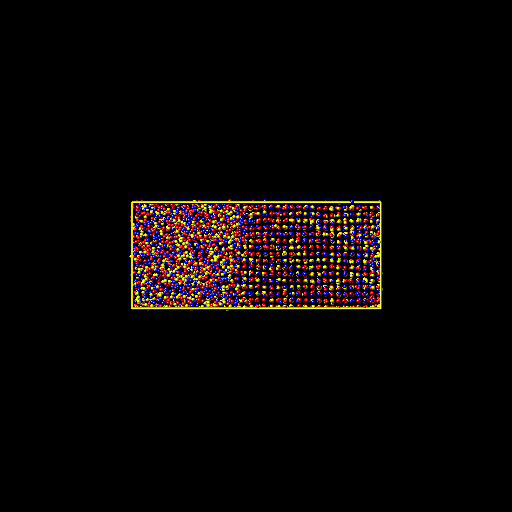

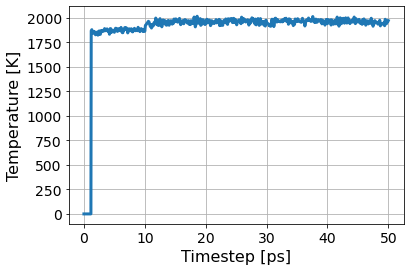

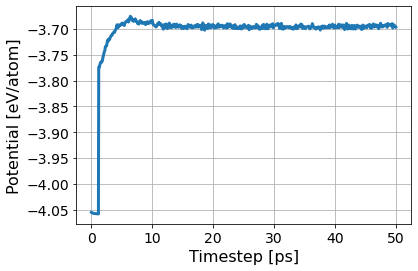

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  12
473
[0.0, 0.4, 0.0, 0.1, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4e1dac6c90524d9f9180ae15acaf1ccc/inputs.yaml
       RUNS/4e1dac6c90524d9f9180ae15acaf1ccc
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4e1dac6c90524d9f9180ae15acaf1ccc/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:35<00:00, 42.24s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4e1dac6c90524d9f9180ae15acaf1ccc/inputs.yaml
       RUNS/4e1dac6c90524d9f9180ae15acaf1ccc
Predicted melting temperature for this potential:  2202.33184278607
95% confidence interval:  4.7384402231903655
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9850260416666666
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.900e+01 3.000e+00 3.100e+01 0.000e+00 4.539e+03 4.608e+03]


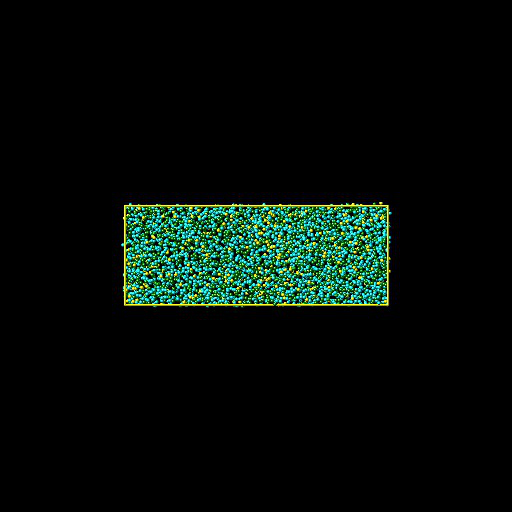

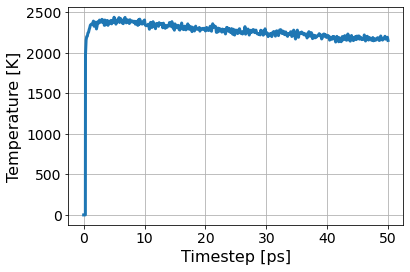

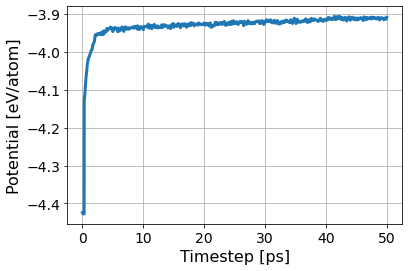

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a2810795fa8f480691a19c8fdba3ce43/inputs.yaml
       RUNS/a2810795fa8f480691a19c8fdba3ce43
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a2810795fa8f480691a19c8fdba3ce43/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:52<00:00, 42.88s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a2810795fa8f480691a19c8fdba3ce43/inputs.yaml
       RUNS/a2810795fa8f480691a19c8fdba3ce43
Predicted melting temperature for this potential:  2257.8731502487562
95% confidence interval:  2.8152845765818677
Fraction of system solid:  0.3630642361111111
Fraction of system liquid:  0.6221788194444444
Simulation Success Flag 1.0
Crystal Structure Info:  [1673.   38.   15.   15.    0. 2867. 4608.]


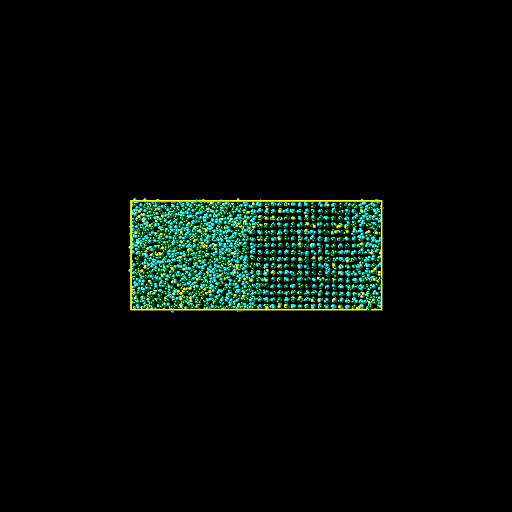

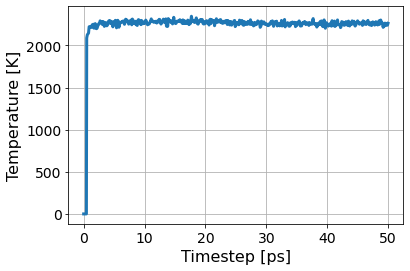

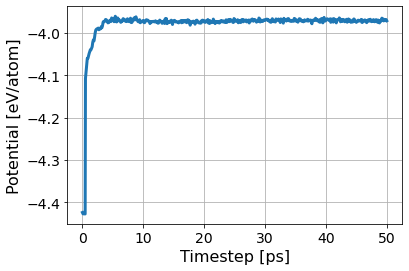

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  13
551
[0.0, 0.5, 0.1, 0.2, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/822a1082220c4ab7a2bdc470fe2be626/inputs.yaml
       RUNS/822a1082220c4ab7a2bdc470fe2be626
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/822a1082220c4ab7a2bdc470fe2be626/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:30<00:00, 44.40s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/822a1082220c4ab7a2bdc470fe2be626/inputs.yaml
       RUNS/822a1082220c4ab7a2bdc470fe2be626
Predicted melting temperature for this potential:  2199.783485572139
95% confidence interval:  2.9933323100224056
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9867621527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 2.500e+01 0.000e+00 2.700e+01 1.000e+00 4.547e+03 4.608e+03]


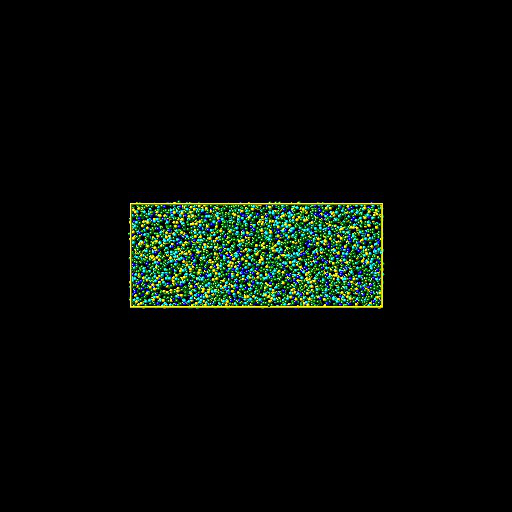

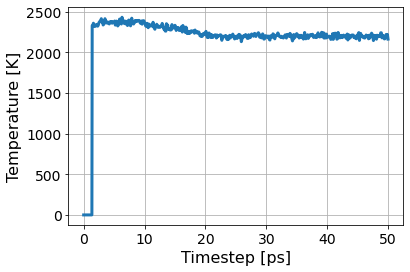

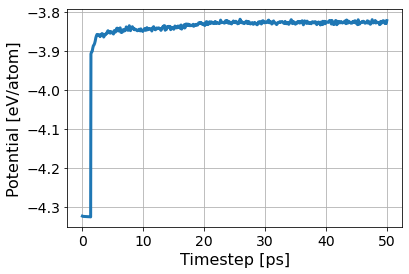

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3a77abfba7534e01b95a307bbdbf235c/inputs.yaml
       RUNS/3a77abfba7534e01b95a307bbdbf235c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3a77abfba7534e01b95a307bbdbf235c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:14<00:00, 43.80s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3a77abfba7534e01b95a307bbdbf235c/inputs.yaml
       RUNS/3a77abfba7534e01b95a307bbdbf235c
Predicted melting temperature for this potential:  2236.679611442786
95% confidence interval:  3.5475397437258036
Fraction of system solid:  0.23936631944444445
Fraction of system liquid:  0.7395833333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1103.   50.   29.   18.    0. 3408. 4608.]


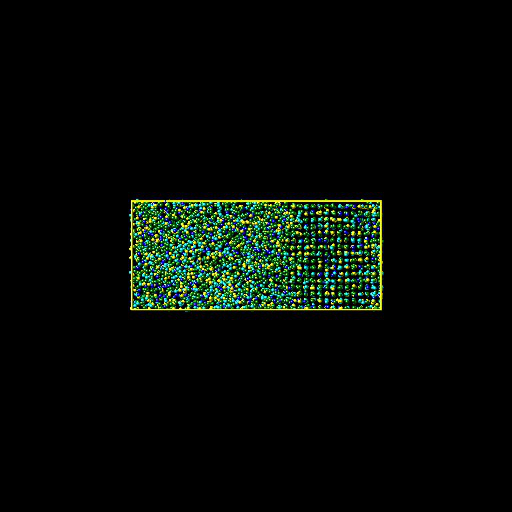

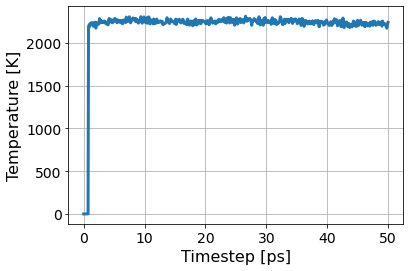

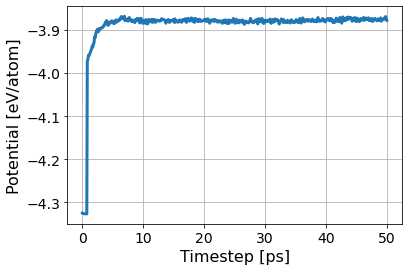

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/68cf1a96e3d44faf83037a7ad5b5d009/inputs.yaml
       RUNS/68cf1a96e3d44faf83037a7ad5b5d009
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/68cf1a96e3d44faf83037a7ad5b5d009/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:38<00:00, 44.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/68cf1a96e3d44faf83037a7ad5b5d009/inputs.yaml
       RUNS/68cf1a96e3d44faf83037a7ad5b5d009
Predicted melting temperature for this potential:  2228.366460696517
95% confidence interval:  3.6987794673643792
Fraction of system solid:  0.4470486111111111
Fraction of system liquid:  0.5349392361111112
Simulation Success Flag 1.0
Crystal Structure Info:  [2.060e+03 4.300e+01 3.300e+01 6.000e+00 1.000e+00 2.465e+03 4.608e+03]


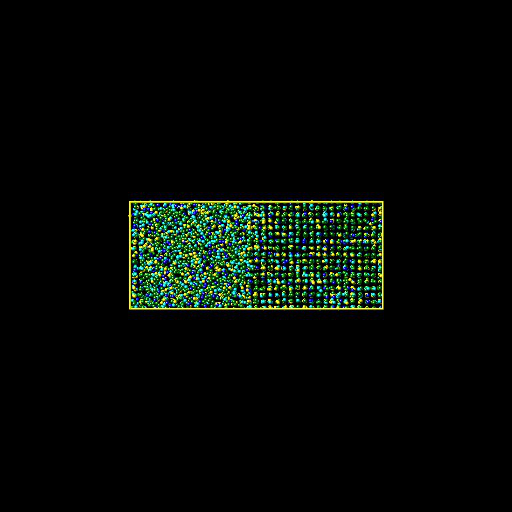

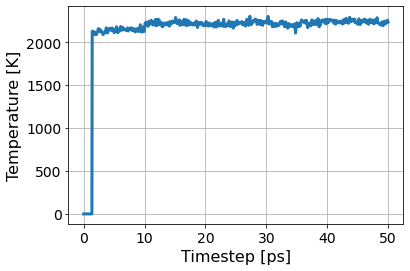

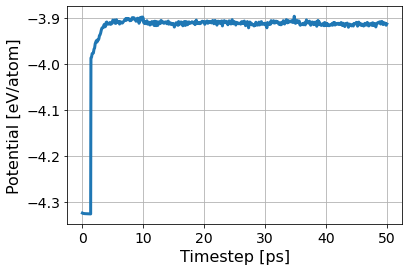

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  14
543
[0.0, 0.5, 0.0, 0.0, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d74777ba787f4bf7a3c4ea0812ddf586/inputs.yaml
       RUNS/d74777ba787f4bf7a3c4ea0812ddf586
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d74777ba787f4bf7a3c4ea0812ddf586/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:00<00:00, 40.83s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d74777ba787f4bf7a3c4ea0812ddf586/inputs.yaml
       RUNS/d74777ba787f4bf7a3c4ea0812ddf586
Predicted melting temperature for this potential:  2187.0133950248755
95% confidence interval:  2.799301990740653
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9865451388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [   8.   22.    0.   32.    0. 4546. 4608.]


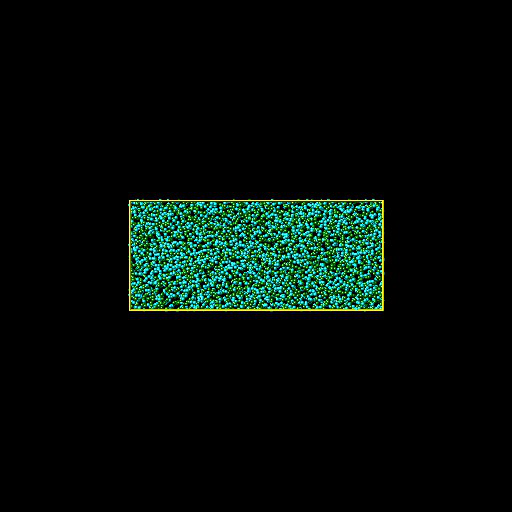

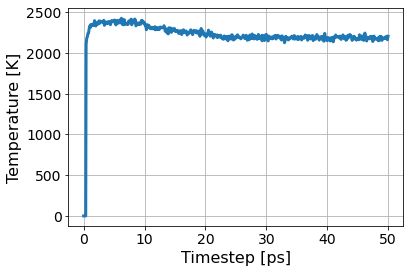

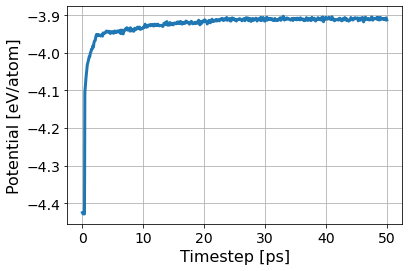

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/685467f9e1d04514adff17ecf6b54782/inputs.yaml
       RUNS/685467f9e1d04514adff17ecf6b54782
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/685467f9e1d04514adff17ecf6b54782/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:14<00:00, 41.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/685467f9e1d04514adff17ecf6b54782/inputs.yaml
       RUNS/685467f9e1d04514adff17ecf6b54782
Predicted melting temperature for this potential:  2175.790665671642
95% confidence interval:  3.5186607651398956
Fraction of system solid:  0.19032118055555555
Fraction of system liquid:  0.7868923611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [ 877.   46.   40.   19.    0. 3626. 4608.]


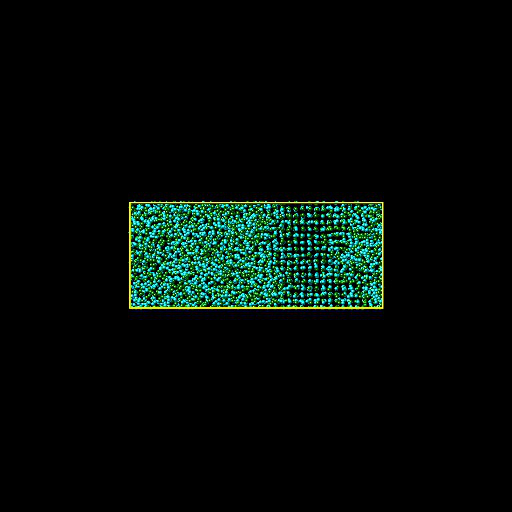

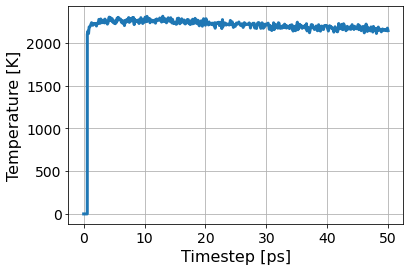

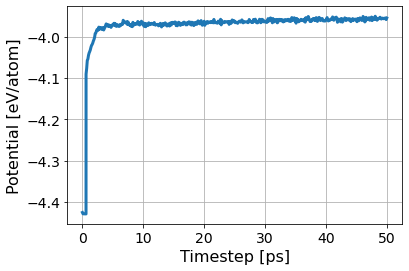

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d967827affb644019db9e85870653e31/inputs.yaml
       RUNS/d967827affb644019db9e85870653e31
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d967827affb644019db9e85870653e31/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:14<00:00, 41.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d967827affb644019db9e85870653e31/inputs.yaml
       RUNS/d967827affb644019db9e85870653e31
Predicted melting temperature for this potential:  2153.0609512437813
95% confidence interval:  3.2067259661825243
Fraction of system solid:  0.4144965277777778
Fraction of system liquid:  0.5590277777777778
Simulation Success Flag 1.0
Crystal Structure Info:  [1.910e+03 7.500e+01 3.300e+01 1.300e+01 1.000e+00 2.576e+03 4.608e+03]


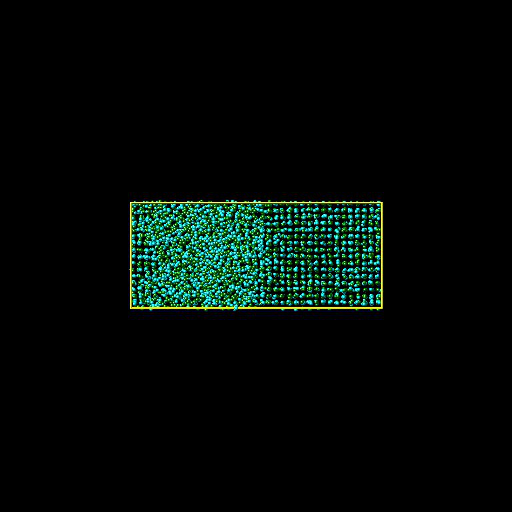

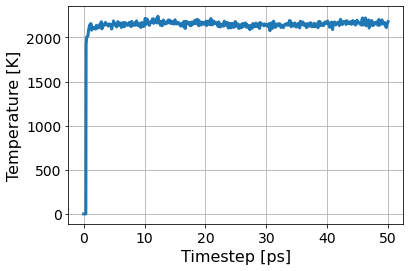

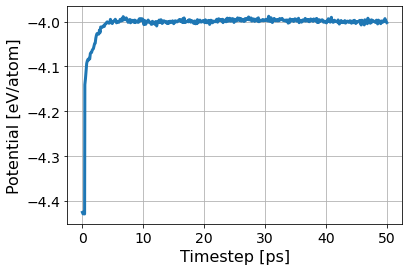

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  15
197
[0.0, 0.1, 0.4, 0.5, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b527e896c414490caa50b3185b55209e/inputs.yaml
       RUNS/b527e896c414490caa50b3185b55209e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b527e896c414490caa50b3185b55209e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:00<00:00, 40.81s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b527e896c414490caa50b3185b55209e/inputs.yaml
       RUNS/b527e896c414490caa50b3185b55209e
Predicted melting temperature for this potential:  2363.049543283582
95% confidence interval:  3.318161806723307
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9913194444444444
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 1.700e+01 0.000e+00 1.400e+01 1.000e+00 4.568e+03 4.608e+03]


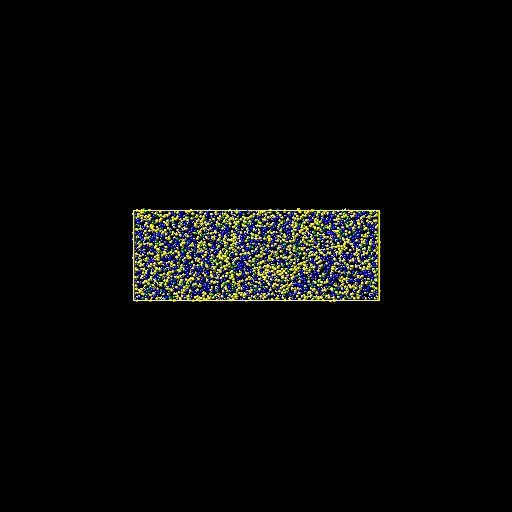

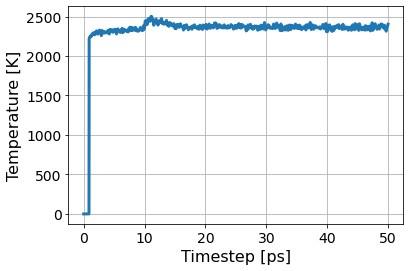

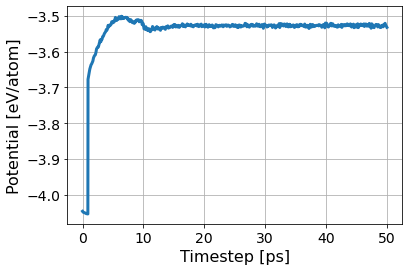

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5ea25408c54f4c738745fd0c40edeab3/inputs.yaml
       RUNS/5ea25408c54f4c738745fd0c40edeab3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5ea25408c54f4c738745fd0c40edeab3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:14<00:00, 41.37s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5ea25408c54f4c738745fd0c40edeab3/inputs.yaml
       RUNS/5ea25408c54f4c738745fd0c40edeab3
Predicted melting temperature for this potential:  2233.44937960199
95% confidence interval:  2.92022502364967
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9898003472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 1.600e+01 1.000e+00 2.200e+01 1.000e+00 4.561e+03 4.608e+03]


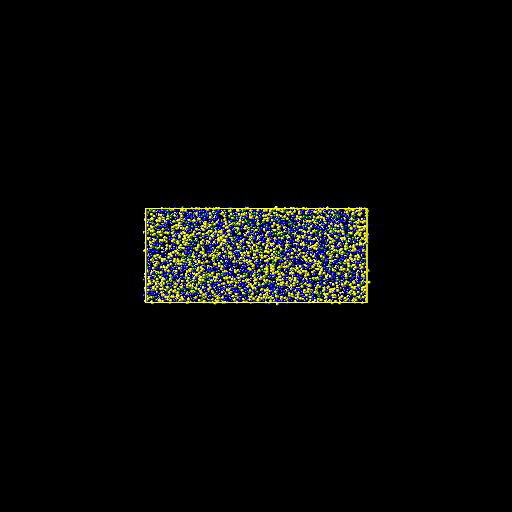

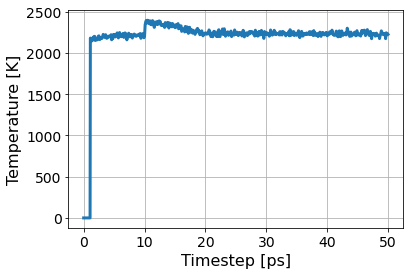

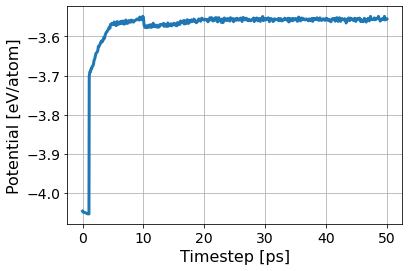

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bdb3a76db952492dbbde2902f1bdc236/inputs.yaml
       RUNS/bdb3a76db952492dbbde2902f1bdc236
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/bdb3a76db952492dbbde2902f1bdc236/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:12<00:00, 41.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bdb3a76db952492dbbde2902f1bdc236/inputs.yaml
       RUNS/bdb3a76db952492dbbde2902f1bdc236
Predicted melting temperature for this potential:  2153.5228024875623
95% confidence interval:  4.445123511241462
Fraction of system solid:  0.027777777777777776
Fraction of system liquid:  0.9552951388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [ 128.   49.   11.   18.    0. 4402. 4608.]


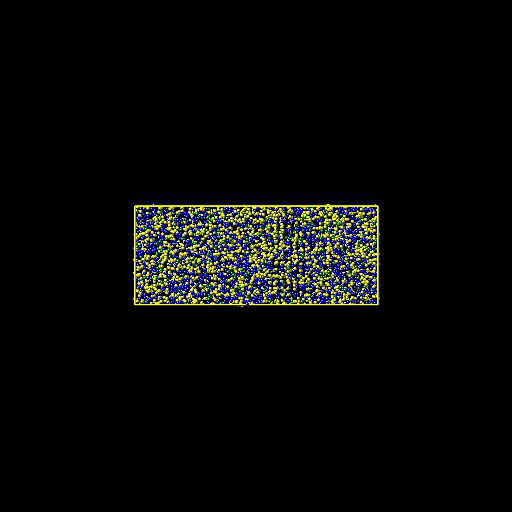

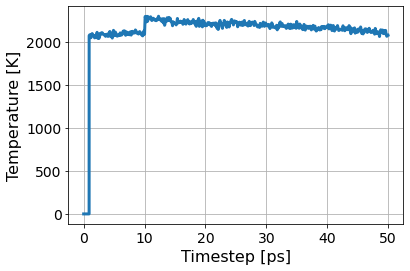

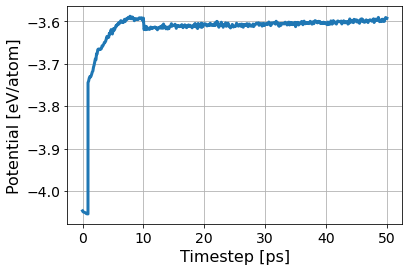

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/63df52d20295401eb6e2db0273a0d2f5/inputs.yaml
       RUNS/63df52d20295401eb6e2db0273a0d2f5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/63df52d20295401eb6e2db0273a0d2f5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:19<00:00, 41.56s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/63df52d20295401eb6e2db0273a0d2f5/inputs.yaml
       RUNS/63df52d20295401eb6e2db0273a0d2f5
Predicted melting temperature for this potential:  2096.88685920398
95% confidence interval:  3.078315589080243
Fraction of system solid:  0.3671875
Fraction of system liquid:  0.6204427083333334
Simulation Success Flag 1.0
Crystal Structure Info:  [1.692e+03 3.600e+01 1.100e+01 9.000e+00 1.000e+00 2.859e+03 4.608e+03]


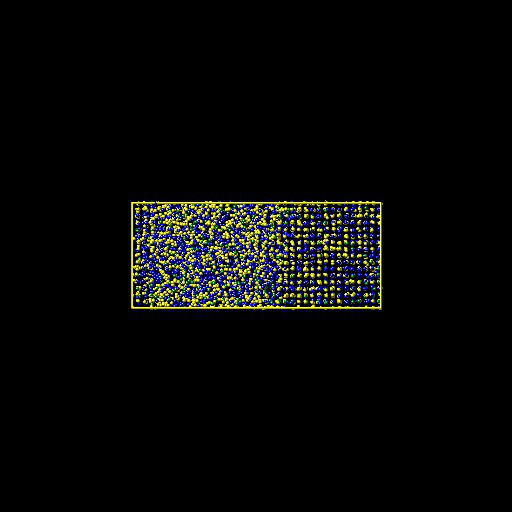

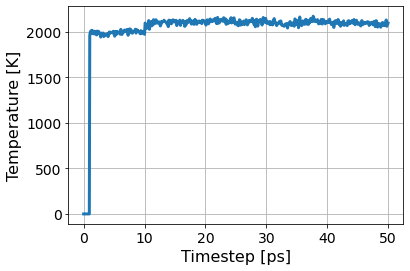

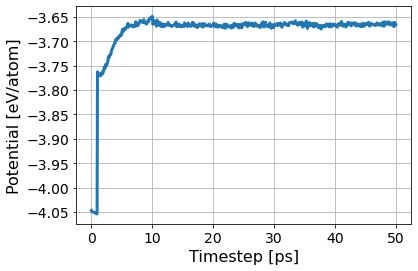

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  16
292
[0.5, 0.1, 0.2, 0.0, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/78863feb5cd6474aa6d052ef29b8296a/inputs.yaml
       RUNS/78863feb5cd6474aa6d052ef29b8296a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/78863feb5cd6474aa6d052ef29b8296a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:14<00:00, 43.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/78863feb5cd6474aa6d052ef29b8296a/inputs.yaml
       RUNS/78863feb5cd6474aa6d052ef29b8296a
Predicted melting temperature for this potential:  1873.2021109452735
95% confidence interval:  2.621639795663295
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9911024305555556
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.900e+01 1.000e+00 1.900e+01 0.000e+00 4.567e+03 4.608e+03]


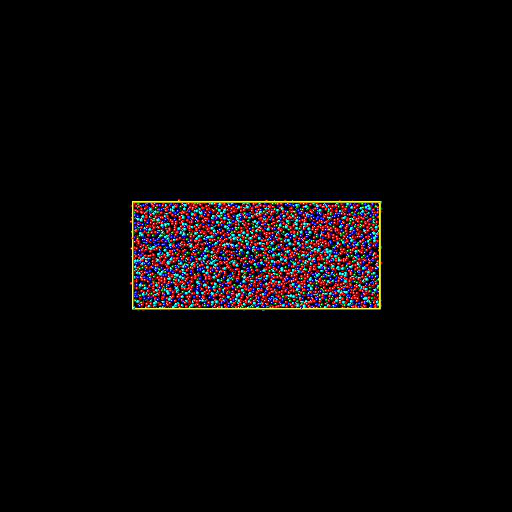

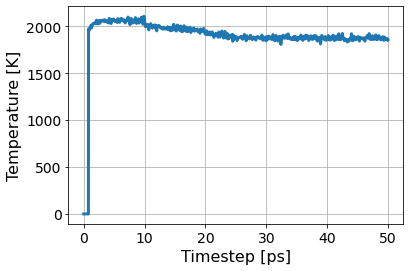

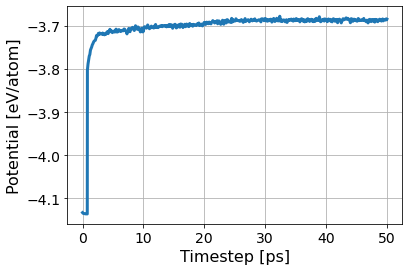

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/462a4a73b83f49bdaf502559b35eaaac/inputs.yaml
       RUNS/462a4a73b83f49bdaf502559b35eaaac
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/462a4a73b83f49bdaf502559b35eaaac/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:56<00:00, 45.47s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/462a4a73b83f49bdaf502559b35eaaac/inputs.yaml
       RUNS/462a4a73b83f49bdaf502559b35eaaac
Predicted melting temperature for this potential:  1814.508412437811
95% confidence interval:  4.367229385296618
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9854600694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 2.400e+01 1.000e+00 3.800e+01 1.000e+00 4.541e+03 4.608e+03]


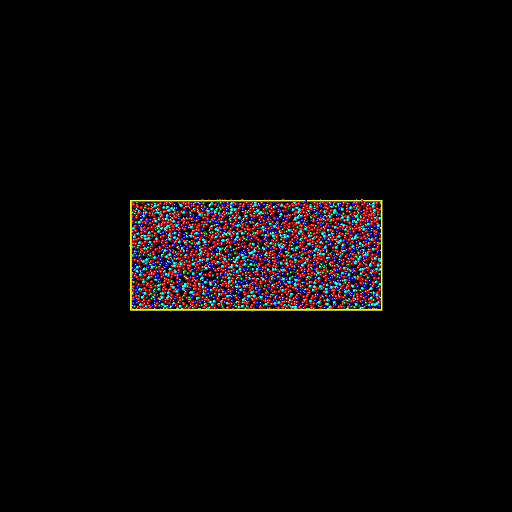

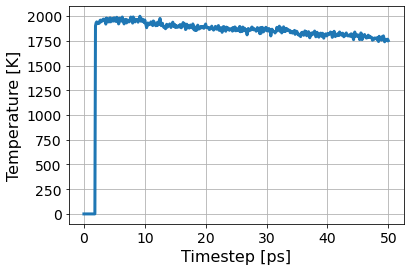

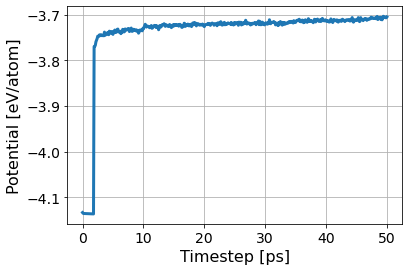

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bf495b53e9184ddf906063b0f29893dc/inputs.yaml
       RUNS/bf495b53e9184ddf906063b0f29893dc
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/bf495b53e9184ddf906063b0f29893dc/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:31<00:00, 44.45s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bf495b53e9184ddf906063b0f29893dc/inputs.yaml
       RUNS/bf495b53e9184ddf906063b0f29893dc
Predicted melting temperature for this potential:  1842.3266293532336
95% confidence interval:  2.7570888528500626
Fraction of system solid:  0.3715277777777778
Fraction of system liquid:  0.6100260416666666
Simulation Success Flag 1.0
Crystal Structure Info:  [1712.   45.   25.   15.    0. 2811. 4608.]


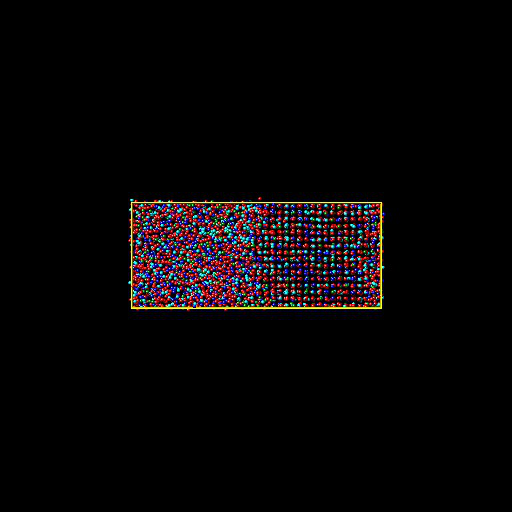

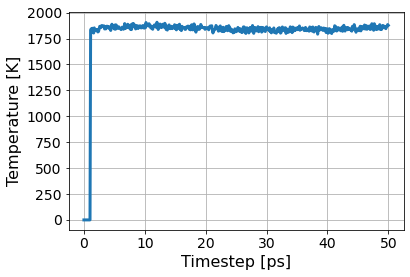

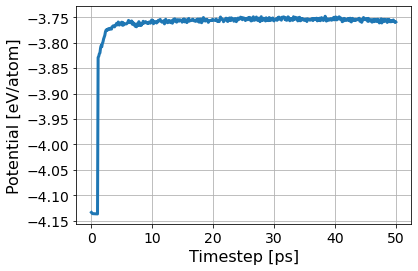

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  17
397
[0.0, 0.3, 0.1, 0.1, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/314fadf4c3234c9299bb261f51be32b9/inputs.yaml
       RUNS/314fadf4c3234c9299bb261f51be32b9
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/314fadf4c3234c9299bb261f51be32b9/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:45<00:00, 45.01s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/314fadf4c3234c9299bb261f51be32b9/inputs.yaml
       RUNS/314fadf4c3234c9299bb261f51be32b9
Predicted melting temperature for this potential:  2175.8768900497516
95% confidence interval:  2.7375240383722987
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 2.200e+01 2.000e+00 2.500e+01 0.000e+00 4.551e+03 4.608e+03]


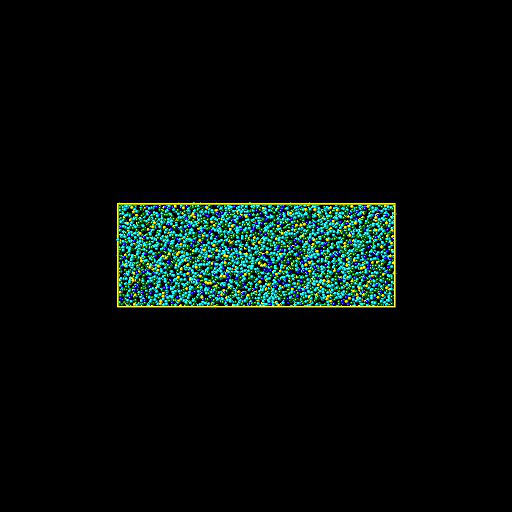

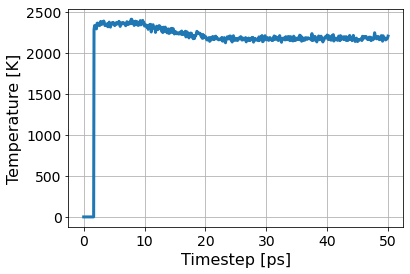

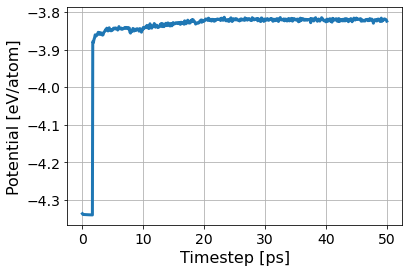

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/feb493e7f0d9464d84762e8605116c99/inputs.yaml
       RUNS/feb493e7f0d9464d84762e8605116c99
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/feb493e7f0d9464d84762e8605116c99/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:35<00:00, 44.64s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/feb493e7f0d9464d84762e8605116c99/inputs.yaml
       RUNS/feb493e7f0d9464d84762e8605116c99
Predicted melting temperature for this potential:  2146.723558208955
95% confidence interval:  3.3948818952512703
Fraction of system solid:  0.12803819444444445
Fraction of system liquid:  0.8528645833333334
Simulation Success Flag 0.0
Crystal Structure Info:  [ 590.   50.   17.   21.    0. 3930. 4608.]


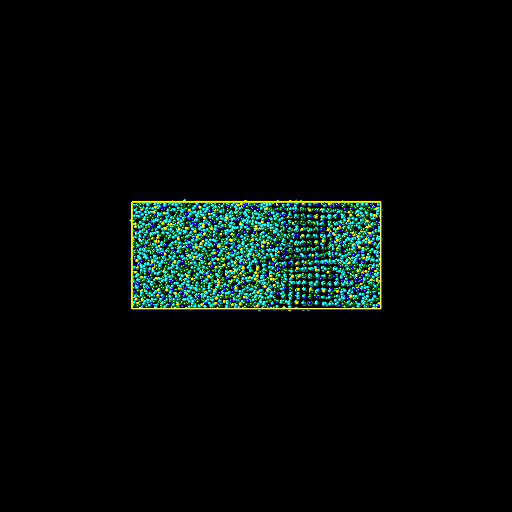

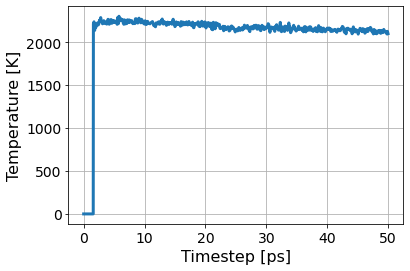

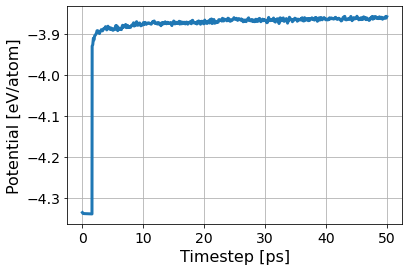

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7e4d596a489c45acb9e302898cd55383/inputs.yaml
       RUNS/7e4d596a489c45acb9e302898cd55383
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7e4d596a489c45acb9e302898cd55383/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:34<00:00, 44.56s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7e4d596a489c45acb9e302898cd55383/inputs.yaml
       RUNS/7e4d596a489c45acb9e302898cd55383
Predicted melting temperature for this potential:  2156.2982626865673
95% confidence interval:  2.667291090858112
Fraction of system solid:  0.4047309027777778
Fraction of system liquid:  0.5792100694444444
Simulation Success Flag 1.0
Crystal Structure Info:  [1.865e+03 3.900e+01 2.500e+01 9.000e+00 1.000e+00 2.669e+03 4.608e+03]


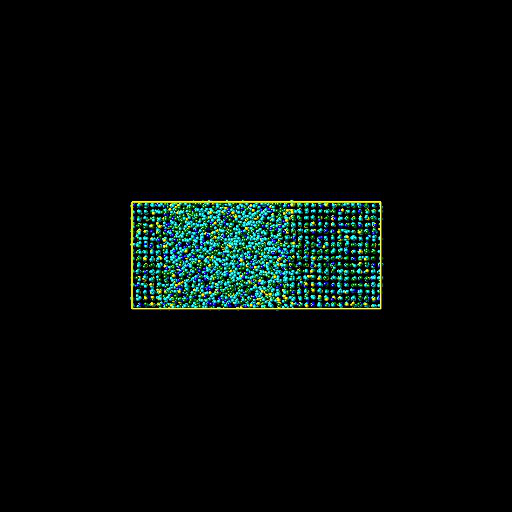

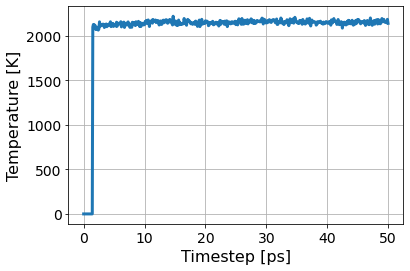

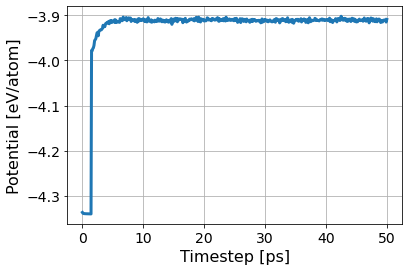

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  18
73
[0.1, 0.0, 0.3, 0.5, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c24f2dbac3d54bac9d5eb76a540e733f/inputs.yaml
       RUNS/c24f2dbac3d54bac9d5eb76a540e733f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c24f2dbac3d54bac9d5eb76a540e733f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:36<00:00, 42.24s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c24f2dbac3d54bac9d5eb76a540e733f/inputs.yaml
       RUNS/c24f2dbac3d54bac9d5eb76a540e733f
Predicted melting temperature for this potential:  2492.9074671641793
95% confidence interval:  3.368573726617272
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9919704861111112
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.500e+01 0.000e+00 1.300e+01 3.000e+00 4.571e+03 4.608e+03]


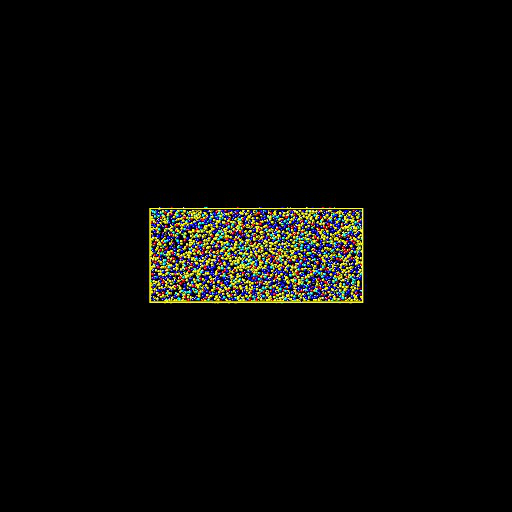

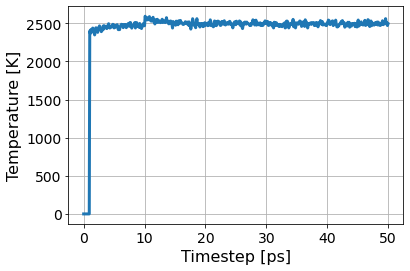

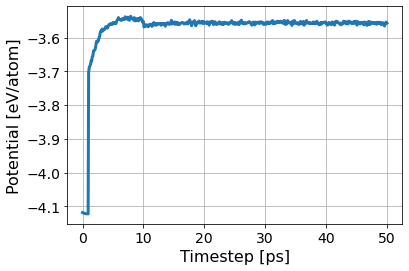

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2f705f4e88004982b5dc4e7ccc76f7de/inputs.yaml
       RUNS/2f705f4e88004982b5dc4e7ccc76f7de
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2f705f4e88004982b5dc4e7ccc76f7de/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:32<00:00, 42.12s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2f705f4e88004982b5dc4e7ccc76f7de/inputs.yaml
       RUNS/2f705f4e88004982b5dc4e7ccc76f7de
Predicted melting temperature for this potential:  2342.728335323383
95% confidence interval:  3.183227178701019
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9926215277777778
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.400e+01 1.000e+00 1.400e+01 3.000e+00 4.574e+03 4.608e+03]


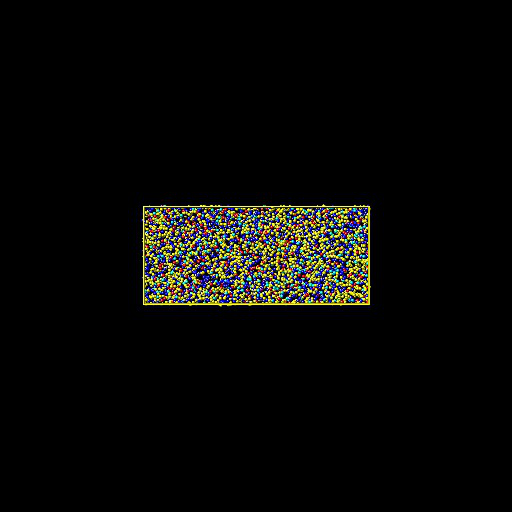

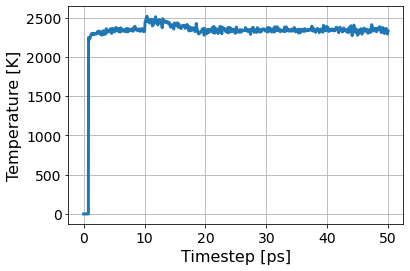

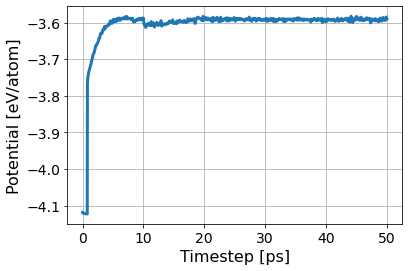

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b12a81eb27af415ab134b18066953cad/inputs.yaml
       RUNS/b12a81eb27af415ab134b18066953cad
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b12a81eb27af415ab134b18066953cad/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:37<00:00, 42.31s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b12a81eb27af415ab134b18066953cad/inputs.yaml
       RUNS/b12a81eb27af415ab134b18066953cad
Predicted melting temperature for this potential:  2219.0318537313433
95% confidence interval:  2.8123790189368845
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9924045138888888
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.500e+01 4.000e+00 8.000e+00 3.000e+00 4.573e+03 4.608e+03]


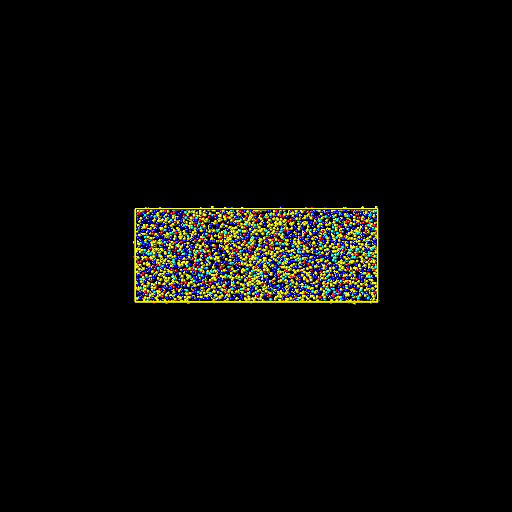

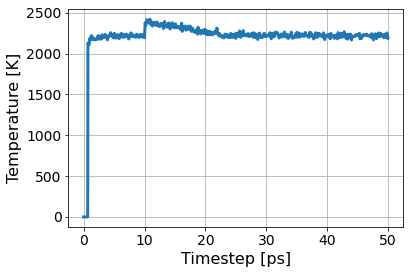

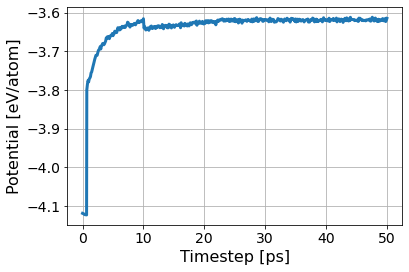

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/998f3642189c44d281a1da116671915c/inputs.yaml
       RUNS/998f3642189c44d281a1da116671915c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/998f3642189c44d281a1da116671915c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:56<00:00, 43.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/998f3642189c44d281a1da116671915c/inputs.yaml
       RUNS/998f3642189c44d281a1da116671915c
Predicted melting temperature for this potential:  2204.508041293532
95% confidence interval:  2.798873870938803
Fraction of system solid:  0.2476128472222222
Fraction of system liquid:  0.7419704861111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1.141e+03 2.500e+01 8.000e+00 1.400e+01 1.000e+00 3.419e+03 4.608e+03]


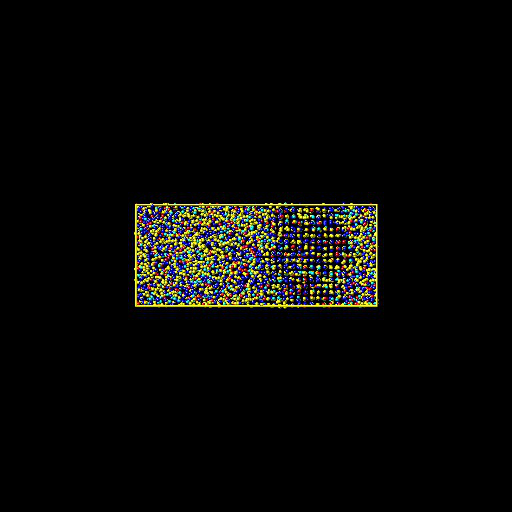

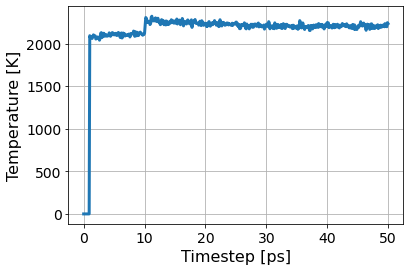

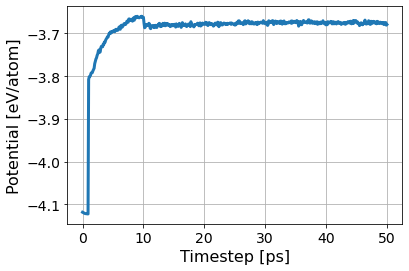

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/482d39fb3b01467f8a63e67961bc9790/inputs.yaml
       RUNS/482d39fb3b01467f8a63e67961bc9790
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/482d39fb3b01467f8a63e67961bc9790/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:02<00:00, 43.28s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/482d39fb3b01467f8a63e67961bc9790/inputs.yaml
       RUNS/482d39fb3b01467f8a63e67961bc9790
Predicted melting temperature for this potential:  2167.2967288557215
95% confidence interval:  3.0888535699960378
Fraction of system solid:  0.5366753472222222
Fraction of system liquid:  0.4470486111111111
Simulation Success Flag 1.0
Crystal Structure Info:  [2473.   51.   11.   13.    0. 2060. 4608.]


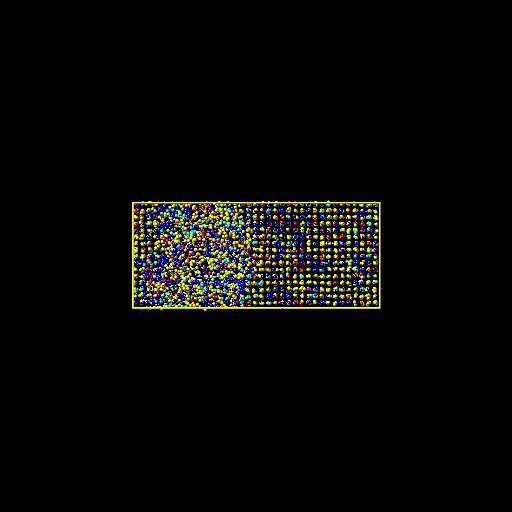

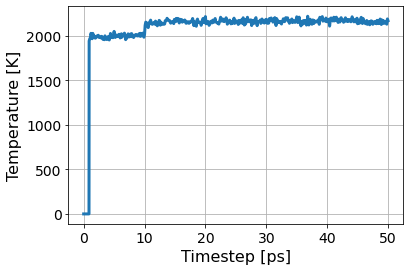

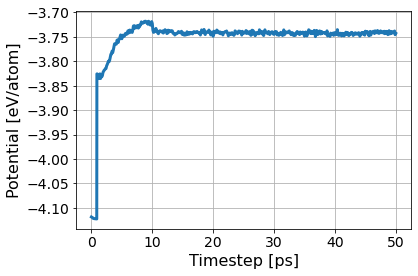

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  19
402
[0.0, 0.3, 0.2, 0.0, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e5cf2e6645ef404b8e828c61d0f5d516/inputs.yaml
       RUNS/e5cf2e6645ef404b8e828c61d0f5d516
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e5cf2e6645ef404b8e828c61d0f5d516/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:38<00:00, 42.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e5cf2e6645ef404b8e828c61d0f5d516/inputs.yaml
       RUNS/e5cf2e6645ef404b8e828c61d0f5d516
Predicted melting temperature for this potential:  2088.472852238806
95% confidence interval:  2.670912065832564
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9908854166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.700e+01 1.000e+00 1.800e+01 1.000e+00 4.566e+03 4.608e+03]


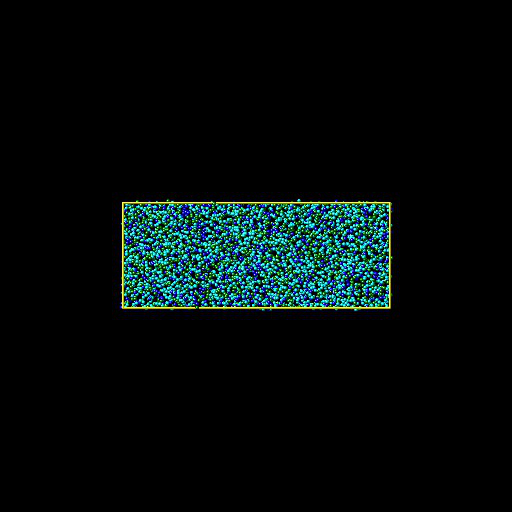

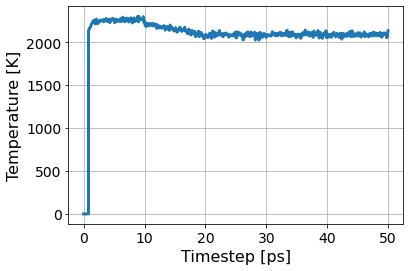

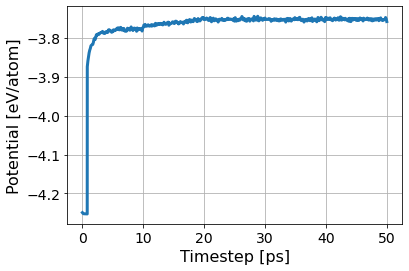

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0f00d141ec1543e994851c698e07379e/inputs.yaml
       RUNS/0f00d141ec1543e994851c698e07379e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0f00d141ec1543e994851c698e07379e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:43<00:00, 42.52s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0f00d141ec1543e994851c698e07379e/inputs.yaml
       RUNS/0f00d141ec1543e994851c698e07379e
Predicted melting temperature for this potential:  1955.335399004975
95% confidence interval:  3.5869458059671975
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 1.800e+01 2.000e+00 3.600e+01 0.000e+00 4.544e+03 4.608e+03]


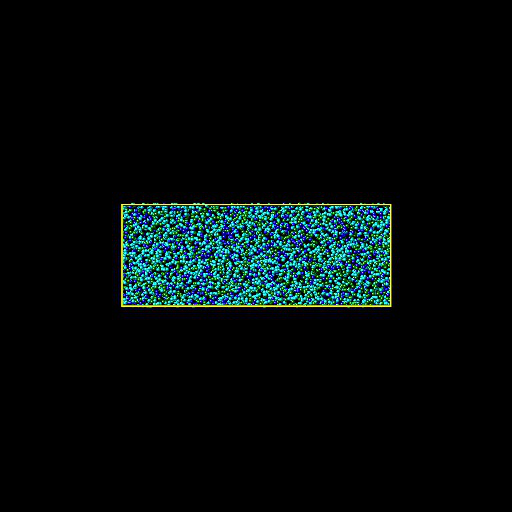

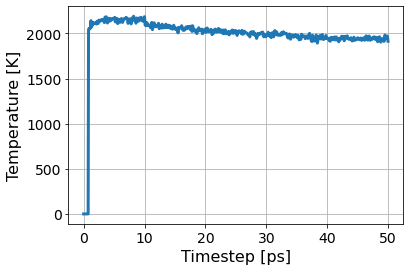

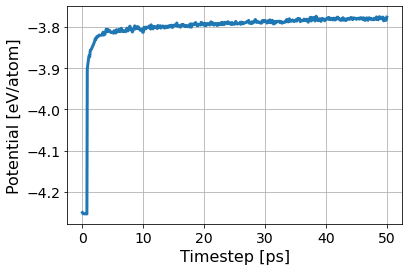

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/29861a3904c64ec59e83d071ef11d4ec/inputs.yaml
       RUNS/29861a3904c64ec59e83d071ef11d4ec
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/29861a3904c64ec59e83d071ef11d4ec/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:39<00:00, 42.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/29861a3904c64ec59e83d071ef11d4ec/inputs.yaml
       RUNS/29861a3904c64ec59e83d071ef11d4ec
Predicted melting temperature for this potential:  1981.9399835820893
95% confidence interval:  3.1018129648911827
Fraction of system solid:  0.2250434027777778
Fraction of system liquid:  0.7554253472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1037.   52.   22.   16.    0. 3481. 4608.]


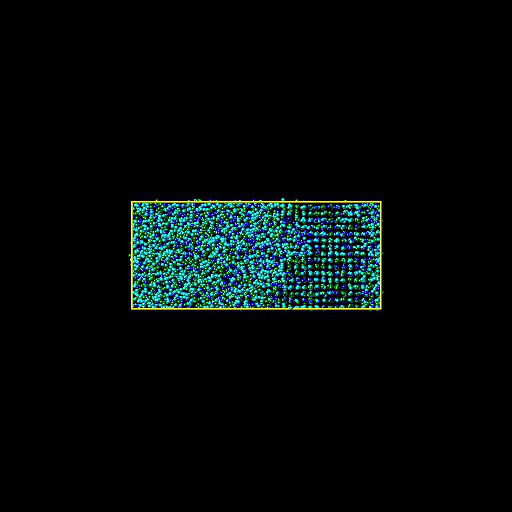

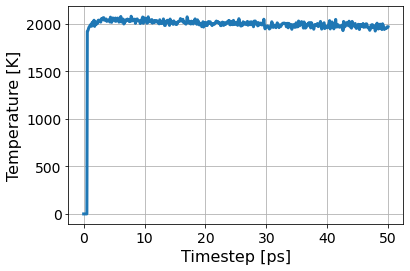

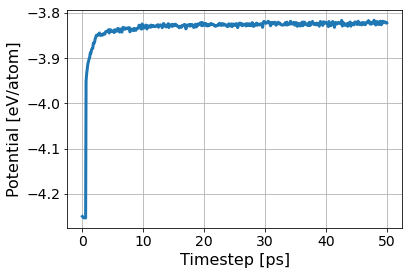

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/38a95d1684194e19963cbc865bd5e937/inputs.yaml
       RUNS/38a95d1684194e19963cbc865bd5e937
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/38a95d1684194e19963cbc865bd5e937/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:57<00:00, 45.49s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/38a95d1684194e19963cbc865bd5e937/inputs.yaml
       RUNS/38a95d1684194e19963cbc865bd5e937
Predicted melting temperature for this potential:  1964.8281766169155
95% confidence interval:  2.817006996766596
Fraction of system solid:  0.4118923611111111
Fraction of system liquid:  0.5731336805555556
Simulation Success Flag 1.0
Crystal Structure Info:  [1898.   43.   17.    9.    0. 2641. 4608.]


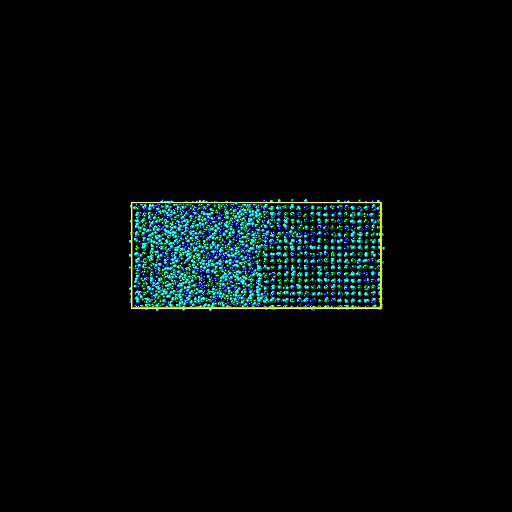

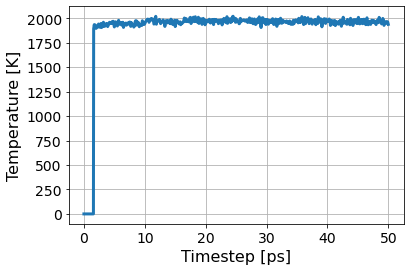

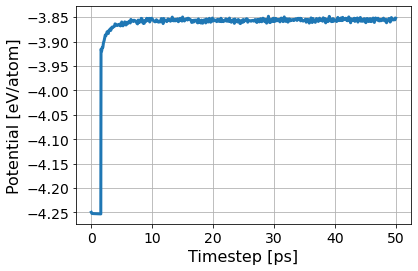

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  20
478
[0.0, 0.4, 0.1, 0.0, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/028584f506ea4a8d8e9110e1f763dd73/inputs.yaml
       RUNS/028584f506ea4a8d8e9110e1f763dd73
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/028584f506ea4a8d8e9110e1f763dd73/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:58<00:00, 43.12s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/028584f506ea4a8d8e9110e1f763dd73/inputs.yaml
       RUNS/028584f506ea4a8d8e9110e1f763dd73
Predicted melting temperature for this potential:  2100.596971144279
95% confidence interval:  2.9485952647340934
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9887152777777778
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.100e+01 1.000e+00 2.500e+01 0.000e+00 4.556e+03 4.608e+03]


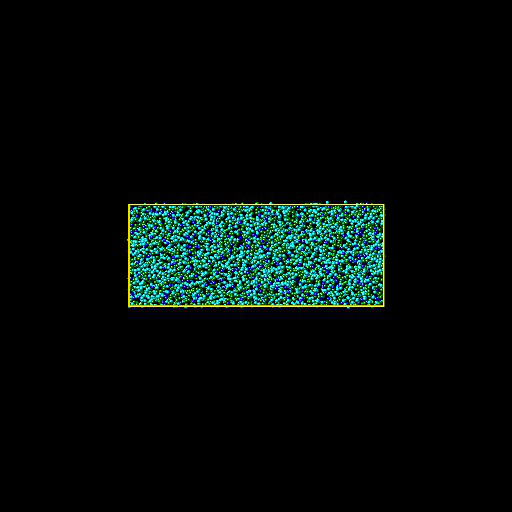

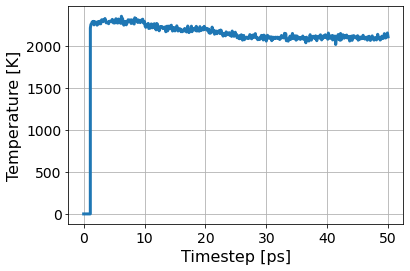

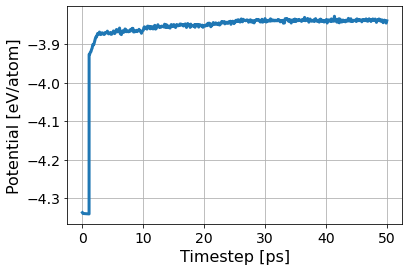

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d696005a9e4c4f26a98efa34de6a3a4c/inputs.yaml
       RUNS/d696005a9e4c4f26a98efa34de6a3a4c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d696005a9e4c4f26a98efa34de6a3a4c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:05<00:00, 43.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d696005a9e4c4f26a98efa34de6a3a4c/inputs.yaml
       RUNS/d696005a9e4c4f26a98efa34de6a3a4c
Predicted melting temperature for this potential:  2080.229261691542
95% confidence interval:  3.3584965296188525
Fraction of system solid:  0.12044270833333333
Fraction of system liquid:  0.8580729166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [ 555.   54.   29.   16.    0. 3954. 4608.]


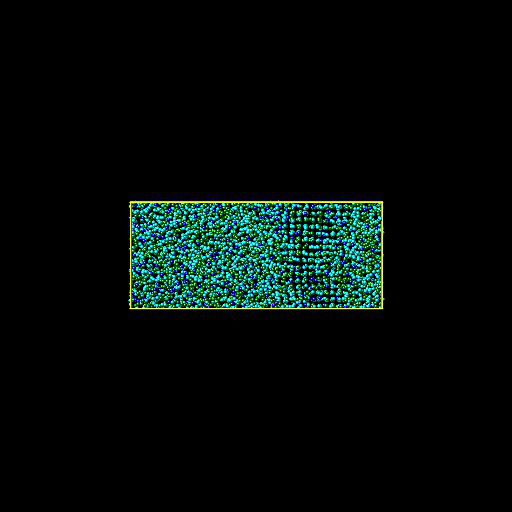

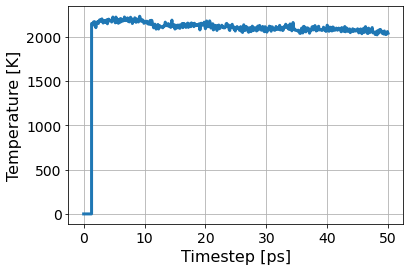

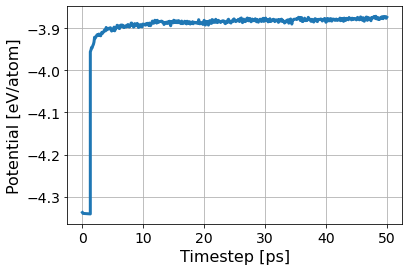

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d59bec68282444eaac9cc8eee46162bc/inputs.yaml
       RUNS/d59bec68282444eaac9cc8eee46162bc
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d59bec68282444eaac9cc8eee46162bc/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:11<00:00, 43.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d59bec68282444eaac9cc8eee46162bc/inputs.yaml
       RUNS/d59bec68282444eaac9cc8eee46162bc
Predicted melting temperature for this potential:  2082.468418905473
95% confidence interval:  3.0568997105271216
Fraction of system solid:  0.3990885416666667
Fraction of system liquid:  0.5844184027777778
Simulation Success Flag 1.0
Crystal Structure Info:  [1839.   50.   15.   11.    0. 2693. 4608.]


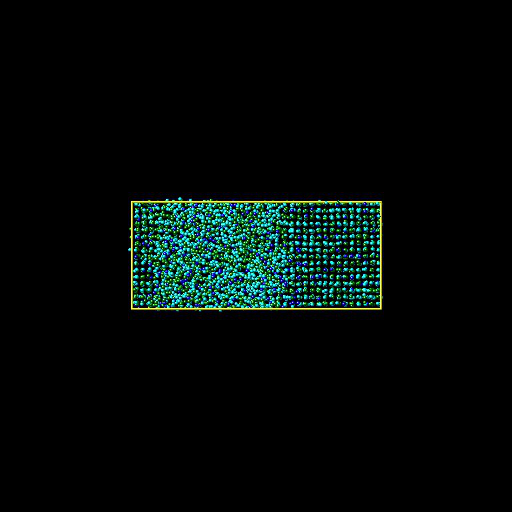

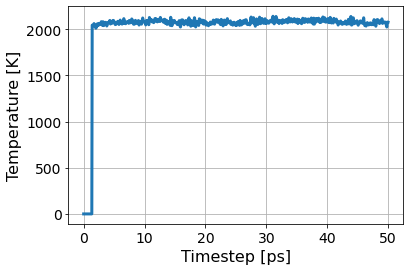

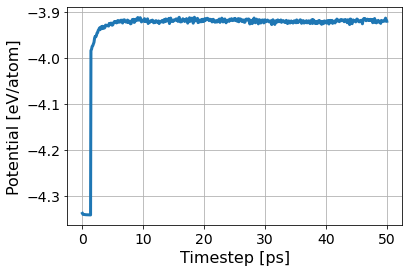

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  21
591
[0.4, 0.5, 0.1, 0.0, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ba9e5c32055d41d79b1f692ec776306d/inputs.yaml
       RUNS/ba9e5c32055d41d79b1f692ec776306d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ba9e5c32055d41d79b1f692ec776306d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:44<00:00, 42.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ba9e5c32055d41d79b1f692ec776306d/inputs.yaml
       RUNS/ba9e5c32055d41d79b1f692ec776306d
Predicted melting temperature for this potential:  2020.3690452736319
95% confidence interval:  2.588504095339869
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9880642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.100e+01 6.000e+00 2.300e+01 1.000e+00 4.553e+03 4.608e+03]


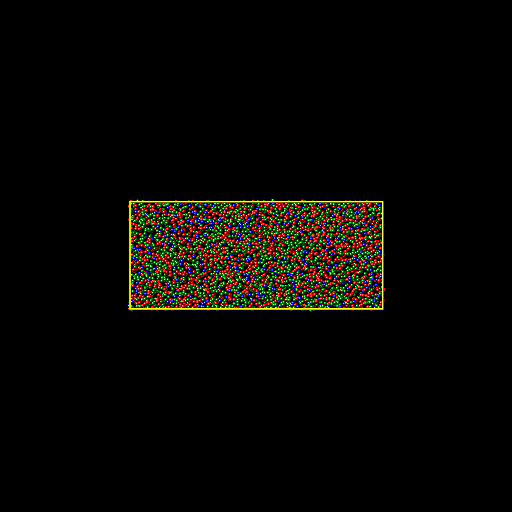

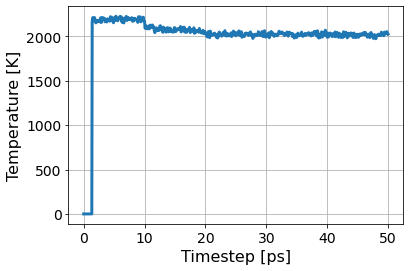

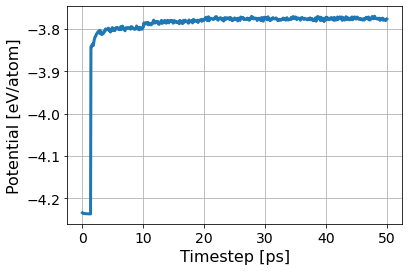

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/04a6ce97391c4ad7857f6dbd8f168117/inputs.yaml
       RUNS/04a6ce97391c4ad7857f6dbd8f168117
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/04a6ce97391c4ad7857f6dbd8f168117/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:56<00:00, 43.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/04a6ce97391c4ad7857f6dbd8f168117/inputs.yaml
       RUNS/04a6ce97391c4ad7857f6dbd8f168117
Predicted melting temperature for this potential:  1913.2476830845771
95% confidence interval:  3.276783528086349
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9845920138888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.900e+01 2.000e+00 3.400e+01 0.000e+00 4.537e+03 4.608e+03]


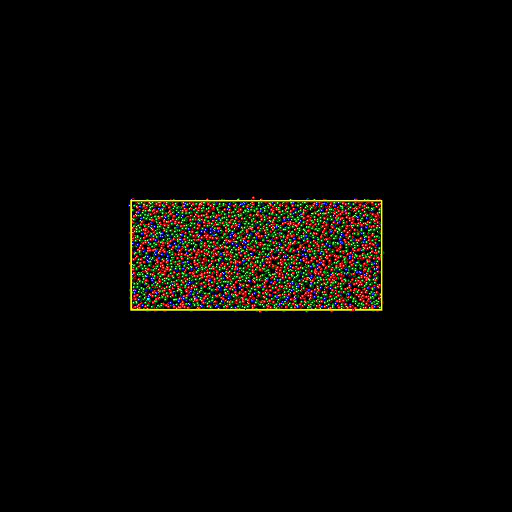

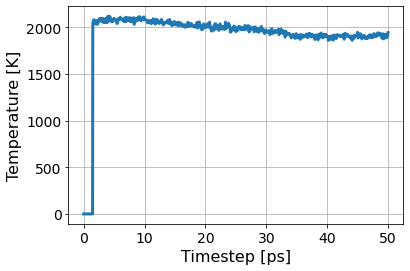

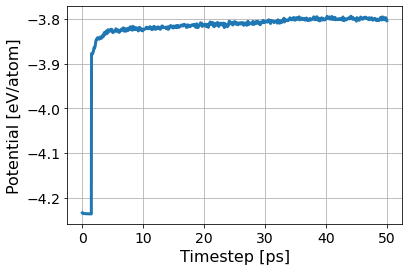

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8775005f5d5549b49ddfbc2e0ca03148/inputs.yaml
       RUNS/8775005f5d5549b49ddfbc2e0ca03148
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8775005f5d5549b49ddfbc2e0ca03148/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:54<00:00, 42.96s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8775005f5d5549b49ddfbc2e0ca03148/inputs.yaml
       RUNS/8775005f5d5549b49ddfbc2e0ca03148
Predicted melting temperature for this potential:  1956.9516736318408
95% confidence interval:  2.660736251129457
Fraction of system solid:  0.3187934027777778
Fraction of system liquid:  0.6579861111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1.469e+03 6.400e+01 3.200e+01 1.000e+01 1.000e+00 3.032e+03 4.608e+03]


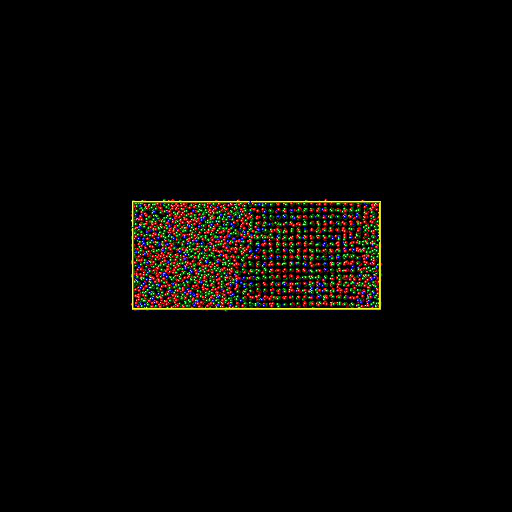

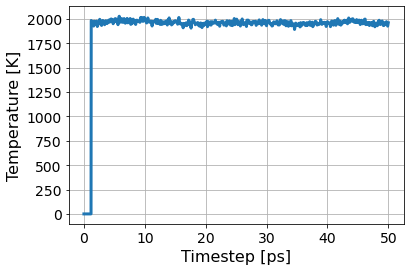

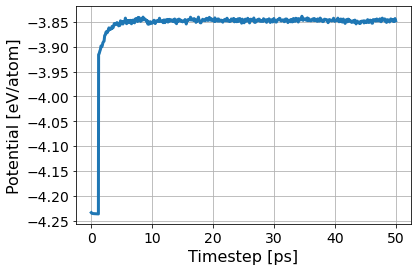

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c3d45da1d40248a9894e5f9b0cb86d78/inputs.yaml
       RUNS/c3d45da1d40248a9894e5f9b0cb86d78
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c3d45da1d40248a9894e5f9b0cb86d78/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:57<00:00, 43.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c3d45da1d40248a9894e5f9b0cb86d78/inputs.yaml
       RUNS/c3d45da1d40248a9894e5f9b0cb86d78
Predicted melting temperature for this potential:  1953.6919860696519
95% confidence interval:  3.0486159175036036
Fraction of system solid:  0.5950520833333334
Fraction of system liquid:  0.3841145833333333
Simulation Success Flag 1.0
Crystal Structure Info:  [2742.   56.   34.    6.    0. 1770. 4608.]


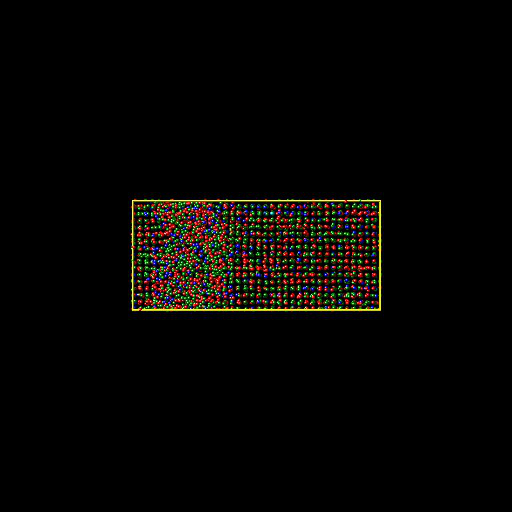

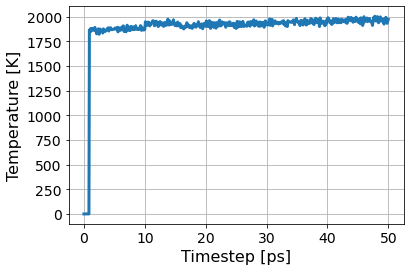

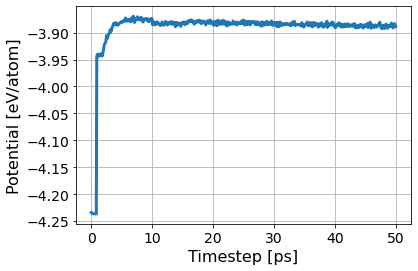

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  22
149
[0.4, 0.0, 0.2, 0.4, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/31063eb499de42f1b0468ceaabd4288f/inputs.yaml
       RUNS/31063eb499de42f1b0468ceaabd4288f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/31063eb499de42f1b0468ceaabd4288f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:32<00:00, 42.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/31063eb499de42f1b0468ceaabd4288f/inputs.yaml
       RUNS/31063eb499de42f1b0468ceaabd4288f
Predicted melting temperature for this potential:  2187.64968159204
95% confidence interval:  3.14810824176637
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9913194444444444
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.800e+01 3.000e+00 1.300e+01 1.000e+00 4.568e+03 4.608e+03]


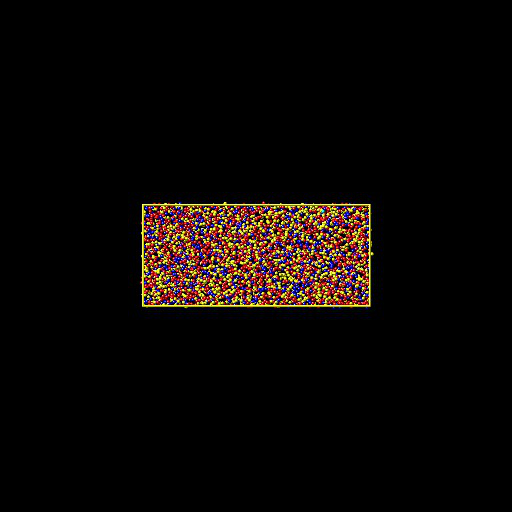

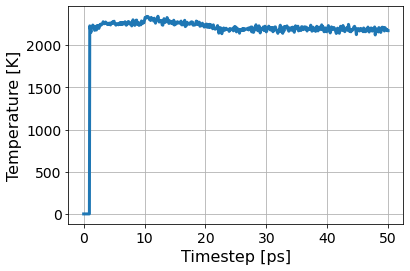

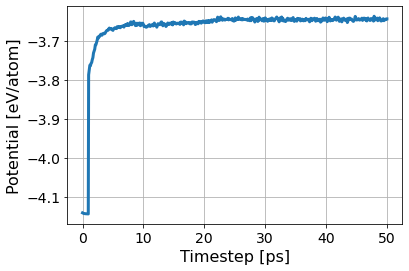

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/831485909e9b4614a865198922c0ce32/inputs.yaml
       RUNS/831485909e9b4614a865198922c0ce32
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/831485909e9b4614a865198922c0ce32/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:40<00:00, 42.44s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/831485909e9b4614a865198922c0ce32/inputs.yaml
       RUNS/831485909e9b4614a865198922c0ce32
Predicted melting temperature for this potential:  2115.617480597015
95% confidence interval:  3.4747117595611936
Fraction of system solid:  0.12955729166666666
Fraction of system liquid:  0.853515625
Simulation Success Flag 0.0
Crystal Structure Info:  [5.970e+02 3.600e+01 2.800e+01 1.200e+01 2.000e+00 3.933e+03 4.608e+03]


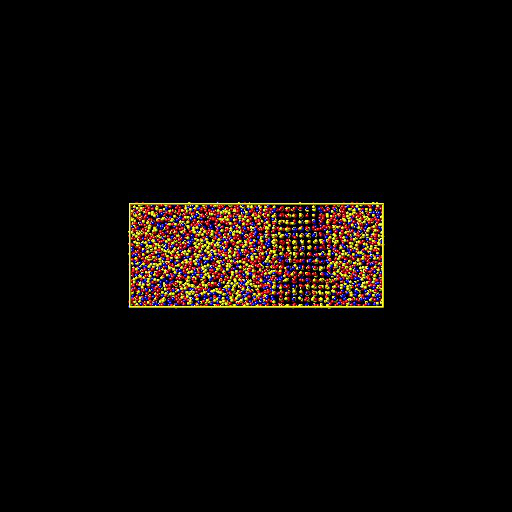

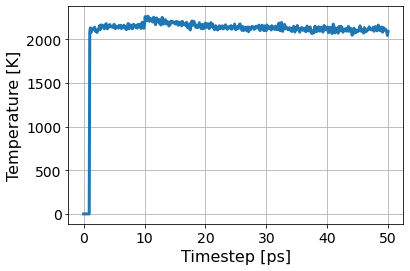

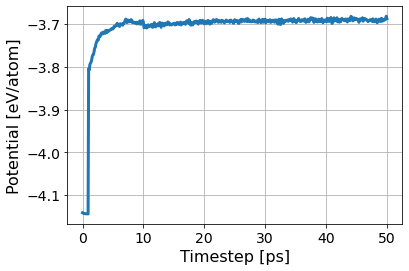

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/36621102ba6a4600b22f170f6dd778dd/inputs.yaml
       RUNS/36621102ba6a4600b22f170f6dd778dd
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/36621102ba6a4600b22f170f6dd778dd/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:11<00:00, 43.64s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/36621102ba6a4600b22f170f6dd778dd/inputs.yaml
       RUNS/36621102ba6a4600b22f170f6dd778dd
Predicted melting temperature for this potential:  2102.0616124378107
95% confidence interval:  2.9122525581852767
Fraction of system solid:  0.4164496527777778
Fraction of system liquid:  0.5638020833333334
Simulation Success Flag 1.0
Crystal Structure Info:  [1.919e+03 4.800e+01 2.400e+01 1.800e+01 1.000e+00 2.598e+03 4.608e+03]


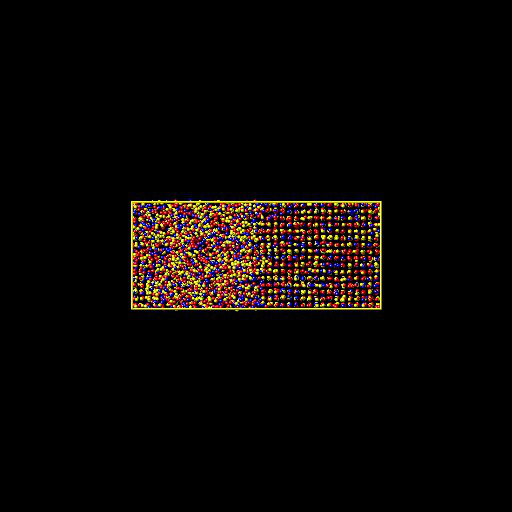

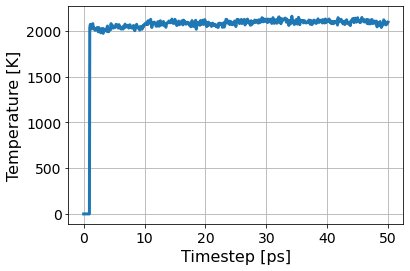

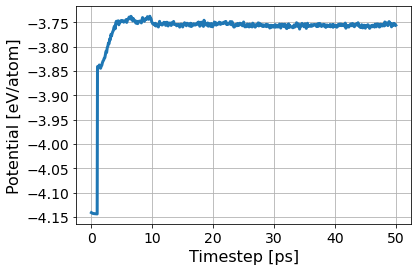

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  23
294
[0.5, 0.1, 0.2, 0.2, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e1427b3df30d43b48ff67e00673f1ae0/inputs.yaml
       RUNS/e1427b3df30d43b48ff67e00673f1ae0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e1427b3df30d43b48ff67e00673f1ae0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:23<00:00, 44.16s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e1427b3df30d43b48ff67e00673f1ae0/inputs.yaml
       RUNS/e1427b3df30d43b48ff67e00673f1ae0
Predicted melting temperature for this potential:  2059.9375388059702
95% confidence interval:  2.7530727083843645
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9915364583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.400e+01 1.000e+00 2.000e+01 0.000e+00 4.569e+03 4.608e+03]


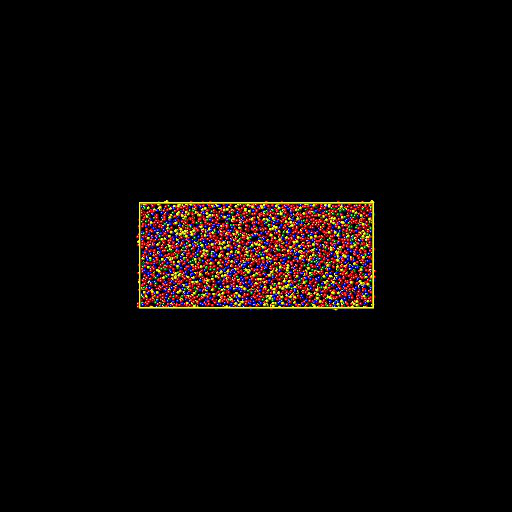

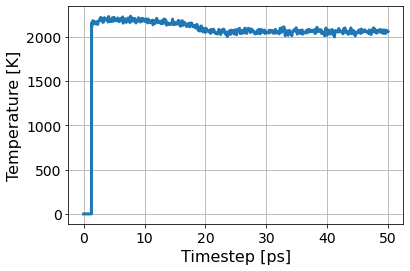

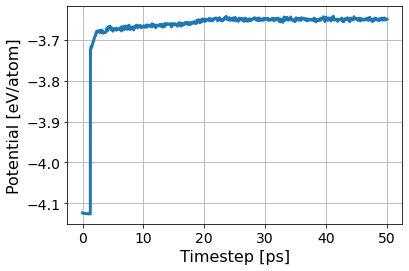

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/324cb908c1a7437a8e23aec6781b080f/inputs.yaml
       RUNS/324cb908c1a7437a8e23aec6781b080f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/324cb908c1a7437a8e23aec6781b080f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:24<00:00, 44.16s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/324cb908c1a7437a8e23aec6781b080f/inputs.yaml
       RUNS/324cb908c1a7437a8e23aec6781b080f
Predicted melting temperature for this potential:  1993.90854079602
95% confidence interval:  3.0488511869127803
Fraction of system solid:  0.08745659722222222
Fraction of system liquid:  0.8932291666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [4.030e+02 6.300e+01 1.500e+01 1.000e+01 1.000e+00 4.116e+03 4.608e+03]


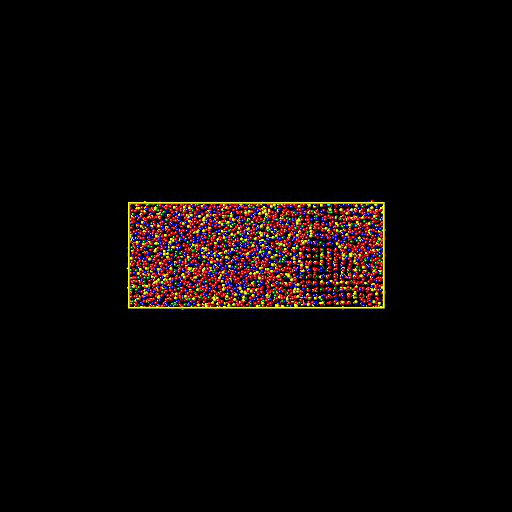

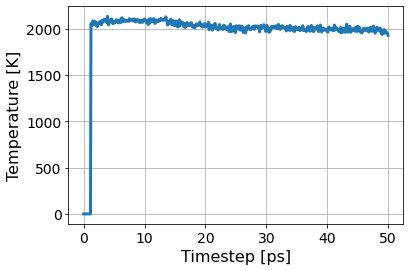

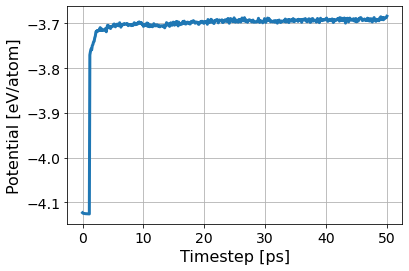

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/20f1bf24affd4b6b911b1de8bc512512/inputs.yaml
       RUNS/20f1bf24affd4b6b911b1de8bc512512
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/20f1bf24affd4b6b911b1de8bc512512/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:29<00:00, 44.36s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/20f1bf24affd4b6b911b1de8bc512512/inputs.yaml
       RUNS/20f1bf24affd4b6b911b1de8bc512512
Predicted melting temperature for this potential:  1946.9466701492538
95% confidence interval:  3.255844422403542
Fraction of system solid:  0.2621527777777778
Fraction of system liquid:  0.7198350694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [1.208e+03 4.600e+01 1.800e+01 1.800e+01 1.000e+00 3.317e+03 4.608e+03]


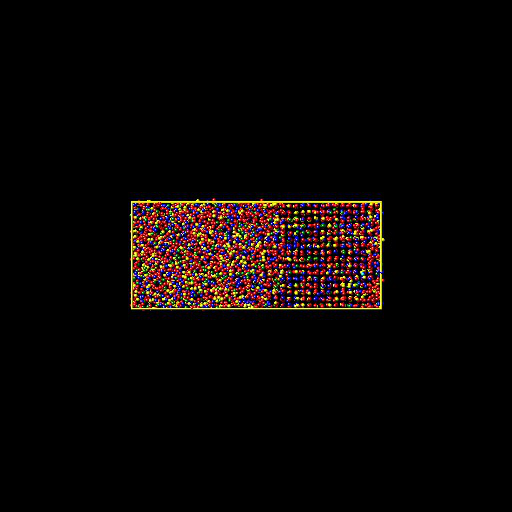

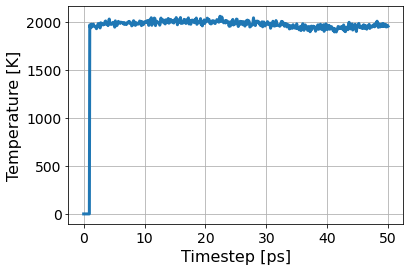

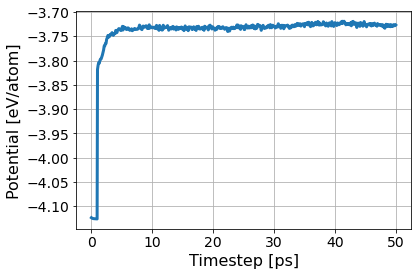

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6a2b1e6051b149c4a6e7e9d5a36140de/inputs.yaml
       RUNS/6a2b1e6051b149c4a6e7e9d5a36140de
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6a2b1e6051b149c4a6e7e9d5a36140de/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:36<00:00, 44.65s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6a2b1e6051b149c4a6e7e9d5a36140de/inputs.yaml
       RUNS/6a2b1e6051b149c4a6e7e9d5a36140de
Predicted melting temperature for this potential:  1952.0579890547265
95% confidence interval:  2.772691168779006
Fraction of system solid:  0.4995659722222222
Fraction of system liquid:  0.4856770833333333
Simulation Success Flag 1.0
Crystal Structure Info:  [2302.   49.   12.    7.    0. 2238. 4608.]


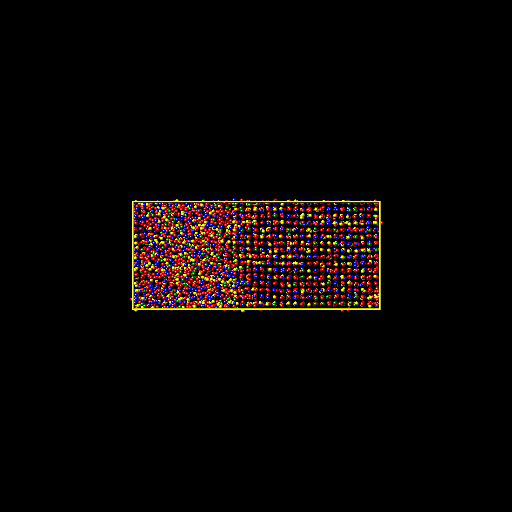

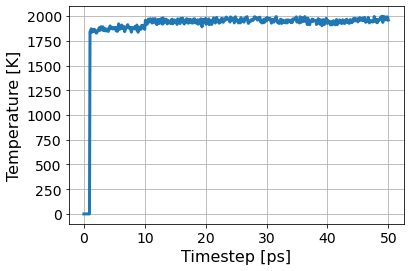

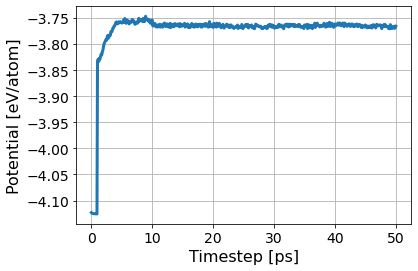

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  24
277
[0.4, 0.1, 0.2, 0.3, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e03d9af90587491ca99895d22d756819/inputs.yaml
       RUNS/e03d9af90587491ca99895d22d756819
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e03d9af90587491ca99895d22d756819/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e03d9af90587491ca99895d22d756819/inputs.yaml
       RUNS/e03d9af90587491ca99895d22d756819
Predicted melting temperature for this potential:  2072.0578278606963
95% confidence interval:  2.7075825184436937
Fraction of system solid:  0.001953125
Fraction of system liquid:  0.9904513888888888
Simulation Success Flag 0.0
Crystal Structure Info:  [9.000e+00 2.300e+01 1.000e+00 1.100e+01 0.000e+00 4.564e+03 4.608e+03]


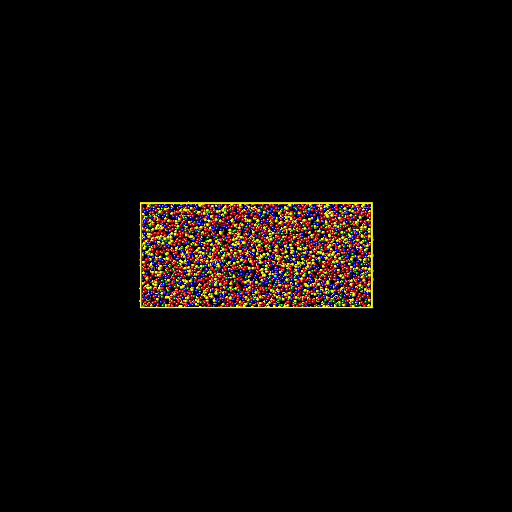

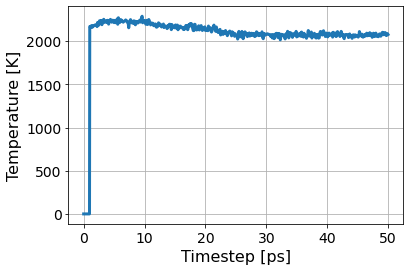

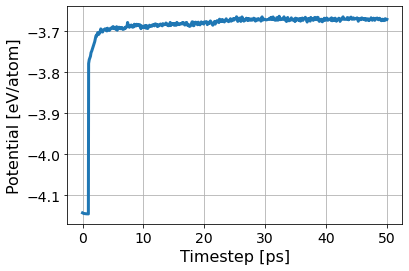

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6002b60699484cf590a9f39b6b87a3ad/inputs.yaml
       RUNS/6002b60699484cf590a9f39b6b87a3ad
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6002b60699484cf590a9f39b6b87a3ad/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:45<00:00, 45.01s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6002b60699484cf590a9f39b6b87a3ad/inputs.yaml
       RUNS/6002b60699484cf590a9f39b6b87a3ad
Predicted melting temperature for this potential:  2058.6607402985073
95% confidence interval:  3.727266802876712
Fraction of system solid:  0.1408420138888889
Fraction of system liquid:  0.8441840277777778
Simulation Success Flag 0.0
Crystal Structure Info:  [ 649.   43.   11.   15.    0. 3890. 4608.]


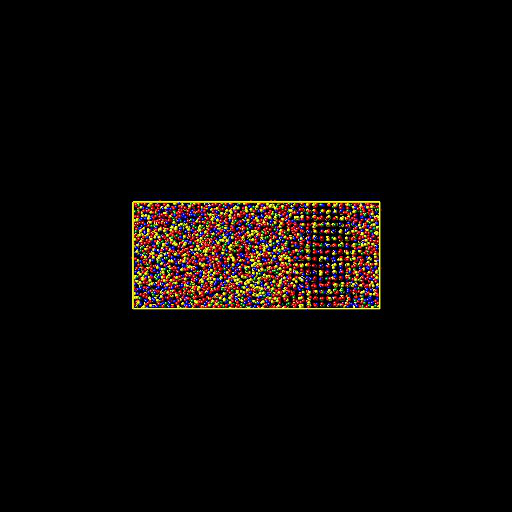

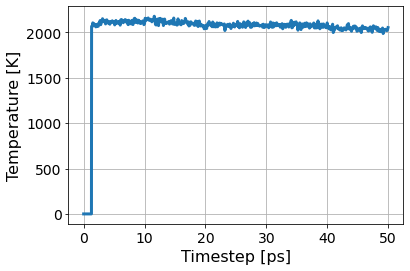

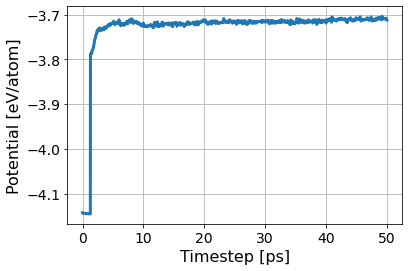

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/748b521090f9446098b5061dd6db2310/inputs.yaml
       RUNS/748b521090f9446098b5061dd6db2310
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/748b521090f9446098b5061dd6db2310/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:45<00:00, 45.01s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/748b521090f9446098b5061dd6db2310/inputs.yaml
       RUNS/748b521090f9446098b5061dd6db2310
Predicted melting temperature for this potential:  2062.845917910448
95% confidence interval:  2.77488590209677
Fraction of system solid:  0.3778211805555556
Fraction of system liquid:  0.6080729166666666
Simulation Success Flag 1.0
Crystal Structure Info:  [1741.   43.   16.    6.    0. 2802. 4608.]


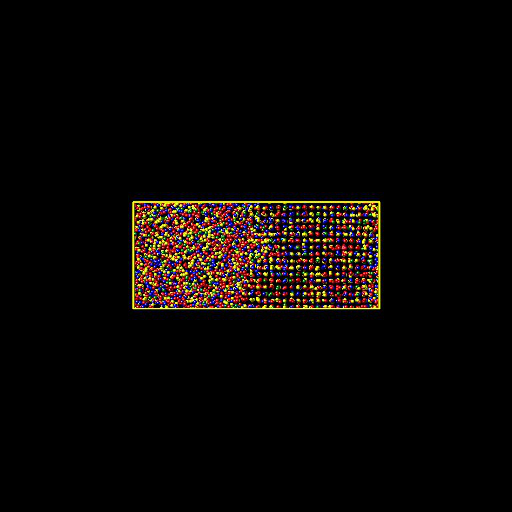

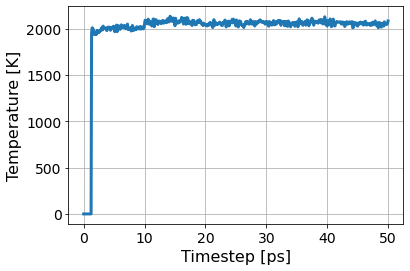

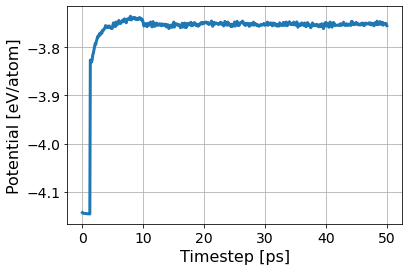

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  25
128
[0.3, 0.0, 0.3, 0.4, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9936149bd2404d8483c7dde398f4a3bc/inputs.yaml
       RUNS/9936149bd2404d8483c7dde398f4a3bc
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9936149bd2404d8483c7dde398f4a3bc/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:37<00:00, 42.28s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9936149bd2404d8483c7dde398f4a3bc/inputs.yaml
       RUNS/9936149bd2404d8483c7dde398f4a3bc
Predicted melting temperature for this potential:  2272.597782587065
95% confidence interval:  3.0125928658892818
Fraction of system solid:  0.0
Fraction of system liquid:  0.9939236111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [0.000e+00 1.300e+01 2.000e+00 1.300e+01 0.000e+00 4.580e+03 4.608e+03]


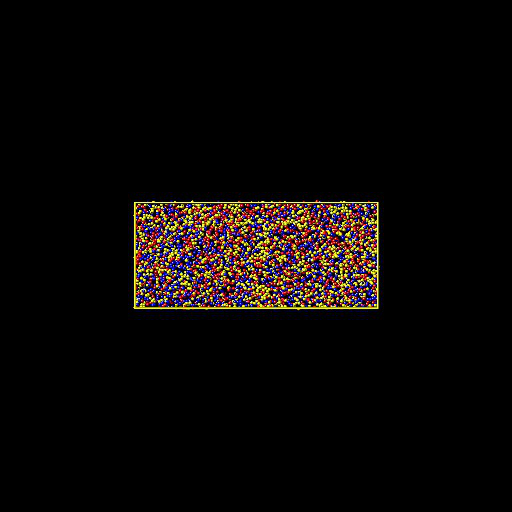

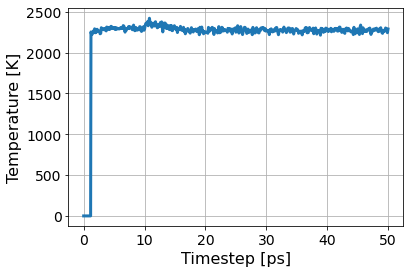

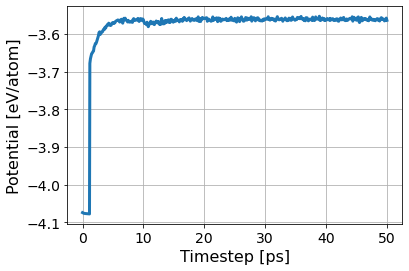

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/771c8cd5fffc4b6289a3e533727eba98/inputs.yaml
       RUNS/771c8cd5fffc4b6289a3e533727eba98
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/771c8cd5fffc4b6289a3e533727eba98/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:48<00:00, 42.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/771c8cd5fffc4b6289a3e533727eba98/inputs.yaml
       RUNS/771c8cd5fffc4b6289a3e533727eba98
Predicted melting temperature for this potential:  2125.067986567164
95% confidence interval:  2.7895289222596893
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9911024305555556
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.700e+01 0.000e+00 2.000e+01 0.000e+00 4.567e+03 4.608e+03]


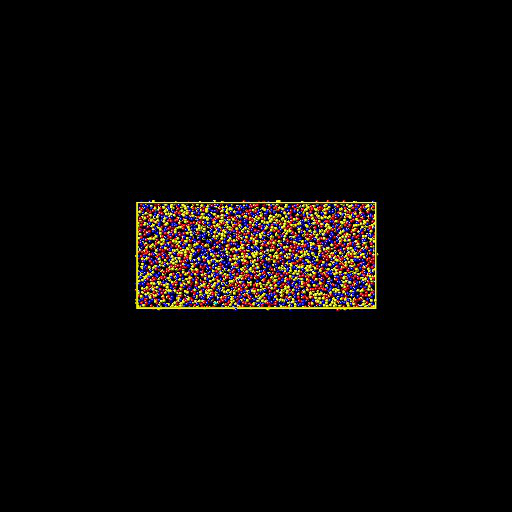

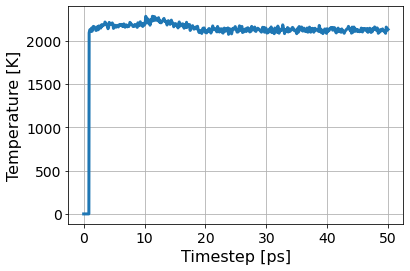

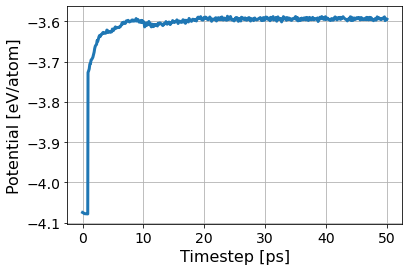

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/51ca54db3a594f7b84ab0797101aa156/inputs.yaml
       RUNS/51ca54db3a594f7b84ab0797101aa156
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/51ca54db3a594f7b84ab0797101aa156/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:04<00:00, 43.36s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/51ca54db3a594f7b84ab0797101aa156/inputs.yaml
       RUNS/51ca54db3a594f7b84ab0797101aa156
Predicted melting temperature for this potential:  2097.3417497512437
95% confidence interval:  3.6359038012920024
Fraction of system solid:  0.22374131944444445
Fraction of system liquid:  0.7610677083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1031.   47.   11.   12.    0. 3507. 4608.]


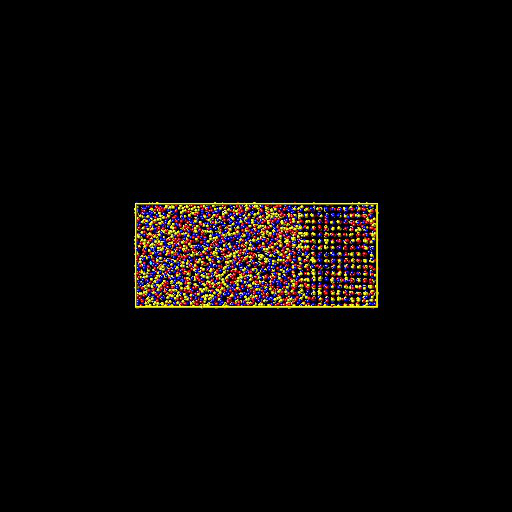

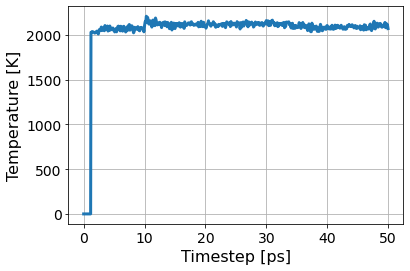

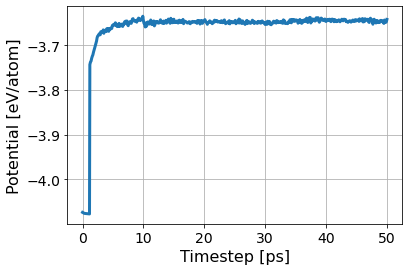

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/002b00ff80964b5182b4665dbac5aab4/inputs.yaml
       RUNS/002b00ff80964b5182b4665dbac5aab4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/002b00ff80964b5182b4665dbac5aab4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:09<00:00, 43.57s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/002b00ff80964b5182b4665dbac5aab4/inputs.yaml
       RUNS/002b00ff80964b5182b4665dbac5aab4
Predicted melting temperature for this potential:  2061.7532835820894
95% confidence interval:  3.084600149824481
Fraction of system solid:  0.4539930555555556
Fraction of system liquid:  0.5327690972222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2092.   37.   13.   11.    0. 2455. 4608.]


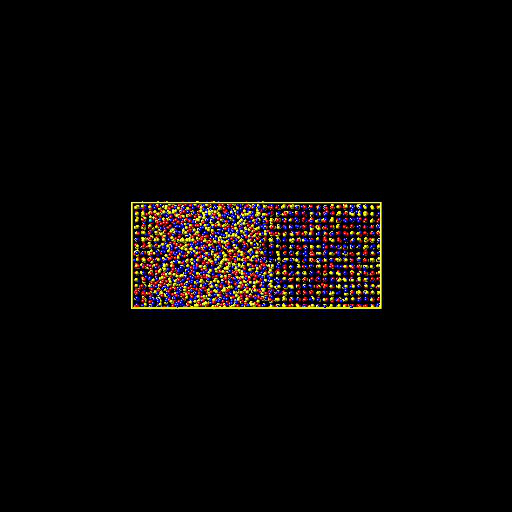

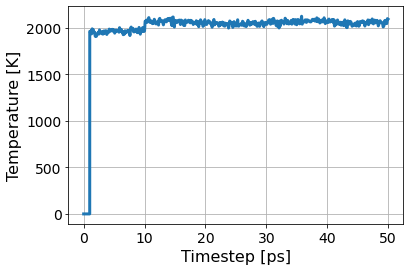

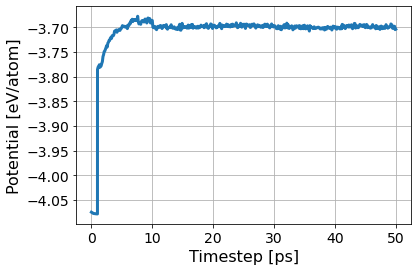

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  26
255
[0.3, 0.1, 0.2, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9c01e9e4f5af47fda87ce2feb2d9f7b6/inputs.yaml
       RUNS/9c01e9e4f5af47fda87ce2feb2d9f7b6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9c01e9e4f5af47fda87ce2feb2d9f7b6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [19:24<00:00, 46.57s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9c01e9e4f5af47fda87ce2feb2d9f7b6/inputs.yaml
       RUNS/9c01e9e4f5af47fda87ce2feb2d9f7b6
Predicted melting temperature for this potential:  1948.8283398009946
95% confidence interval:  2.6387317067068192
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 1.900e+01 1.000e+00 1.900e+01 0.000e+00 4.562e+03 4.608e+03]


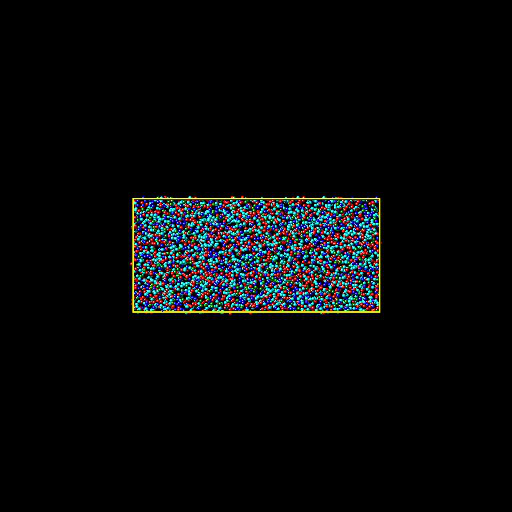

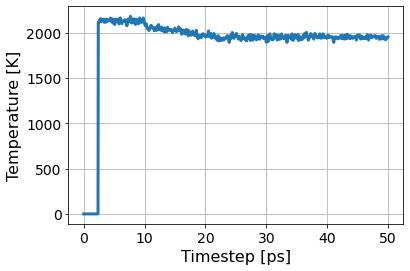

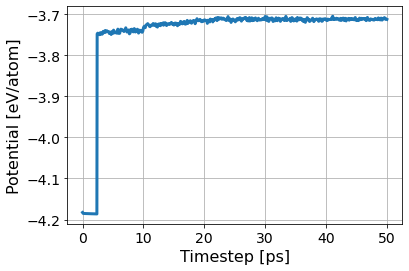

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3d7c83a3cba7425794548331232519b0/inputs.yaml
       RUNS/3d7c83a3cba7425794548331232519b0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3d7c83a3cba7425794548331232519b0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:52<00:00, 45.29s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3d7c83a3cba7425794548331232519b0/inputs.yaml
       RUNS/3d7c83a3cba7425794548331232519b0
Predicted melting temperature for this potential:  1897.0692731343286
95% confidence interval:  4.573837258192602
Fraction of system solid:  0.0028211805555555555
Fraction of system liquid:  0.9822048611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1.300e+01 3.700e+01 8.000e+00 2.200e+01 2.000e+00 4.526e+03 4.608e+03]


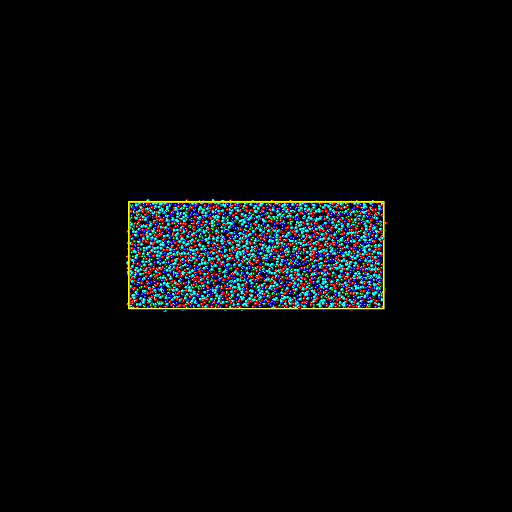

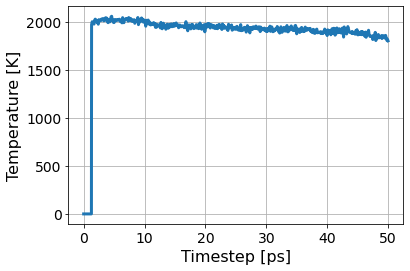

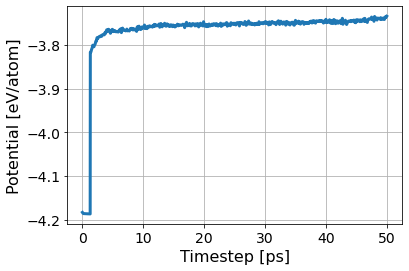

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a7315e71f994433c99751651972c7eb5/inputs.yaml
       RUNS/a7315e71f994433c99751651972c7eb5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a7315e71f994433c99751651972c7eb5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:43<00:00, 44.92s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a7315e71f994433c99751651972c7eb5/inputs.yaml
       RUNS/a7315e71f994433c99751651972c7eb5
Predicted melting temperature for this potential:  1900.3490925373133
95% confidence interval:  2.5949061907571465
Fraction of system solid:  0.3587239583333333
Fraction of system liquid:  0.6276041666666666
Simulation Success Flag 1.0
Crystal Structure Info:  [1653.   44.   11.    8.    0. 2892. 4608.]


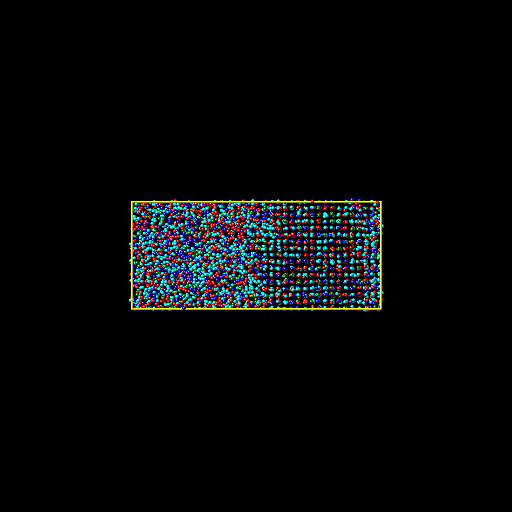

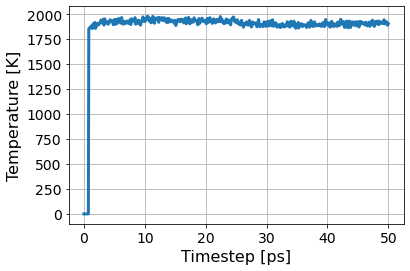

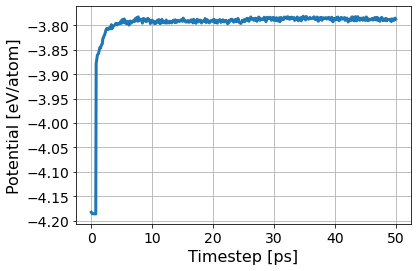

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  27
102
[0.2, 0.0, 0.3, 0.5, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/92d5aad6a02e45dfab312d561803fe94/inputs.yaml
       RUNS/92d5aad6a02e45dfab312d561803fe94
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/92d5aad6a02e45dfab312d561803fe94/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:22<00:00, 41.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/92d5aad6a02e45dfab312d561803fe94/inputs.yaml
       RUNS/92d5aad6a02e45dfab312d561803fe94
Predicted melting temperature for this potential:  2392.027607462687
95% confidence interval:  3.3657236193266935
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9921875
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.500e+01 2.000e+00 1.600e+01 1.000e+00 4.572e+03 4.608e+03]


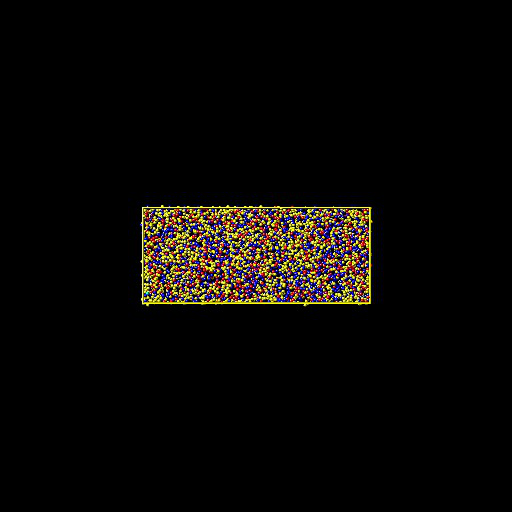

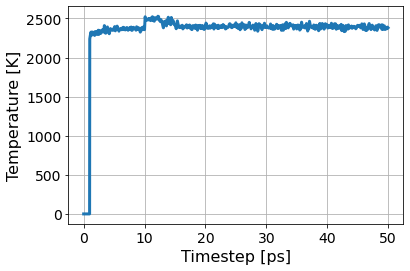

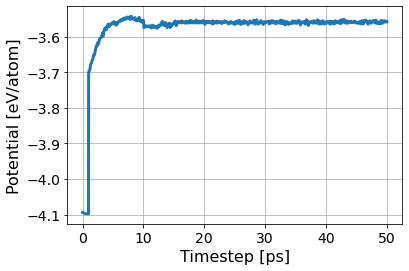

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/43271aa3f3704bfa9d06d7363686284f/inputs.yaml
       RUNS/43271aa3f3704bfa9d06d7363686284f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/43271aa3f3704bfa9d06d7363686284f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:19<00:00, 41.56s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/43271aa3f3704bfa9d06d7363686284f/inputs.yaml
       RUNS/43271aa3f3704bfa9d06d7363686284f
Predicted melting temperature for this potential:  2214.6423194029853
95% confidence interval:  2.9697413022547354
Fraction of system solid:  0.001953125
Fraction of system liquid:  0.9895833333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [9.000e+00 2.300e+01 1.000e+00 1.400e+01 1.000e+00 4.560e+03 4.608e+03]


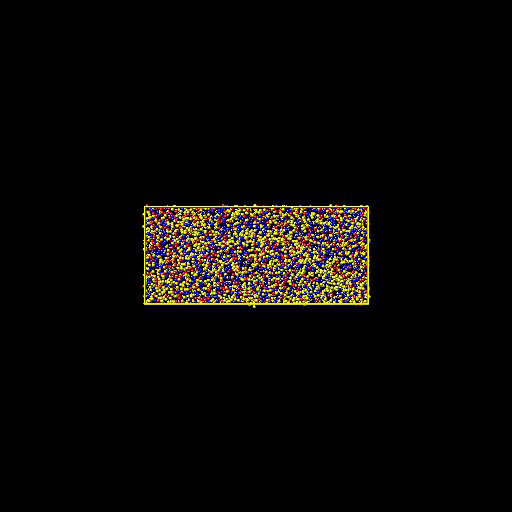

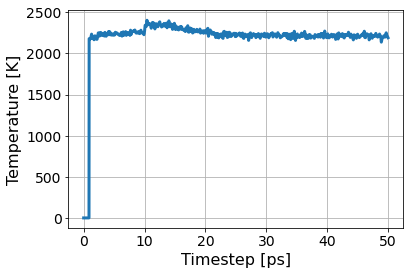

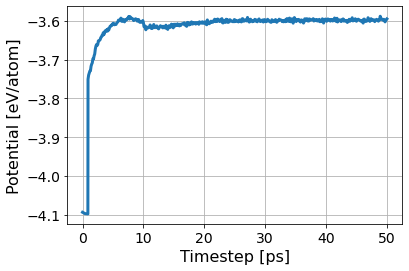

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c6945e96a7b74afd878f4b2891759aec/inputs.yaml
       RUNS/c6945e96a7b74afd878f4b2891759aec
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c6945e96a7b74afd878f4b2891759aec/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:32<00:00, 42.12s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c6945e96a7b74afd878f4b2891759aec/inputs.yaml
       RUNS/c6945e96a7b74afd878f4b2891759aec
Predicted melting temperature for this potential:  2122.1323328358208
95% confidence interval:  2.974106021040197
Fraction of system solid:  0.15690104166666666
Fraction of system liquid:  0.8155381944444444
Simulation Success Flag 0.0
Crystal Structure Info:  [7.230e+02 7.600e+01 4.100e+01 9.000e+00 1.000e+00 3.758e+03 4.608e+03]


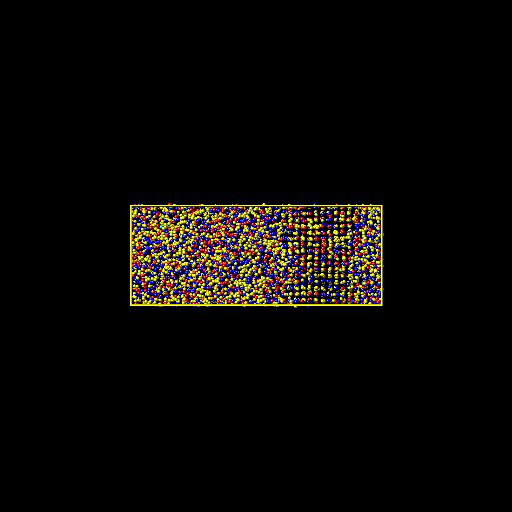

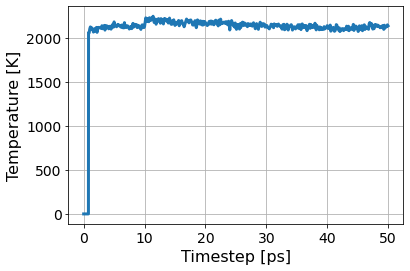

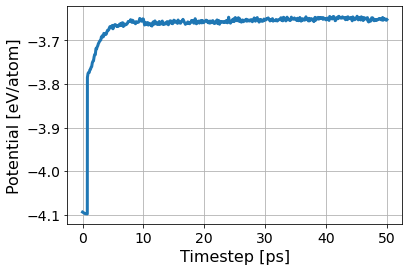

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/83fe5430c8314aa9a0a42076196d3794/inputs.yaml
       RUNS/83fe5430c8314aa9a0a42076196d3794
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/83fe5430c8314aa9a0a42076196d3794/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:23<00:00, 41.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/83fe5430c8314aa9a0a42076196d3794/inputs.yaml
       RUNS/83fe5430c8314aa9a0a42076196d3794
Predicted melting temperature for this potential:  2136.513397512438
95% confidence interval:  3.0962268486999225
Fraction of system solid:  0.3927951388888889
Fraction of system liquid:  0.5902777777777778
Simulation Success Flag 1.0
Crystal Structure Info:  [1.810e+03 4.100e+01 2.800e+01 8.000e+00 1.000e+00 2.720e+03 4.608e+03]


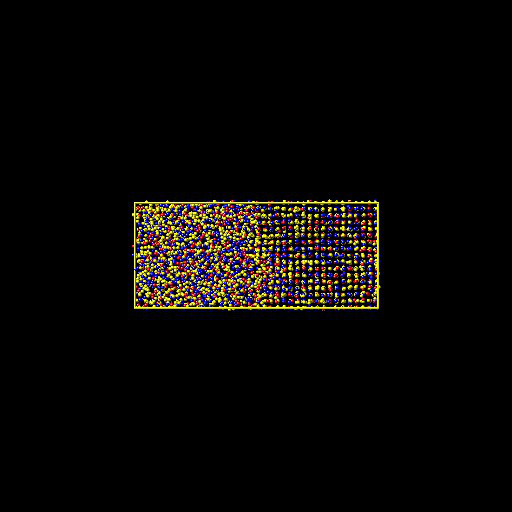

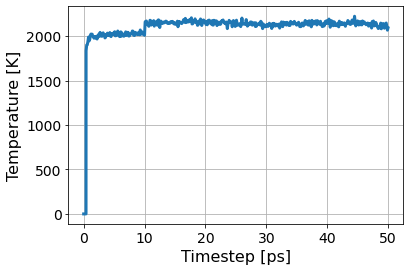

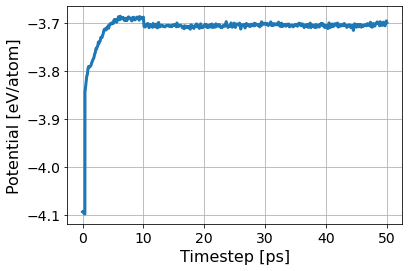

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  28
148
[0.4, 0.0, 0.2, 0.2, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3b2ba973a09145aeab33eef1a75f2da2/inputs.yaml
       RUNS/3b2ba973a09145aeab33eef1a75f2da2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3b2ba973a09145aeab33eef1a75f2da2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:33<00:00, 44.53s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3b2ba973a09145aeab33eef1a75f2da2/inputs.yaml
       RUNS/3b2ba973a09145aeab33eef1a75f2da2
Predicted melting temperature for this potential:  2072.1035233830844
95% confidence interval:  2.8411562280961977
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9904513888888888
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 1.600e+01 0.000e+00 1.900e+01 2.000e+00 4.564e+03 4.608e+03]


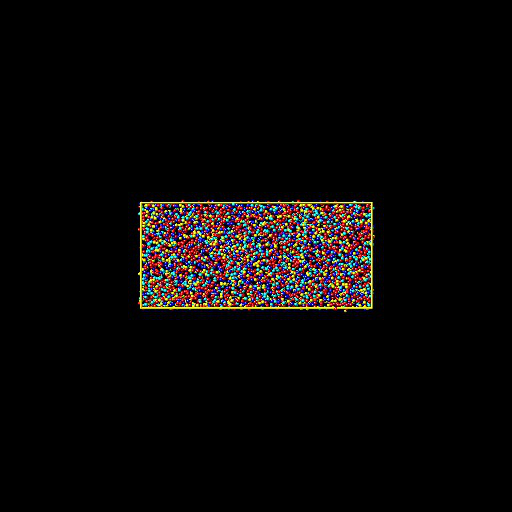

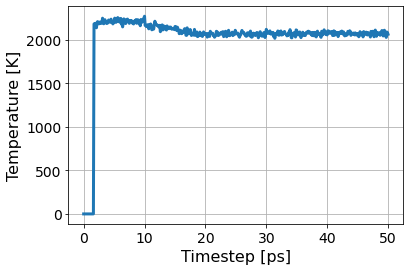

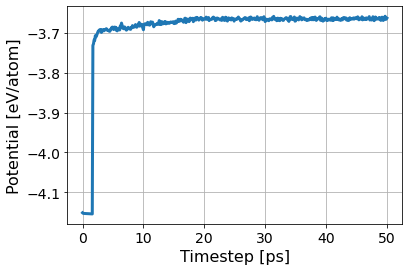

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ae1a3f935b3a4f43b43a222ab46436ec/inputs.yaml
       RUNS/ae1a3f935b3a4f43b43a222ab46436ec
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ae1a3f935b3a4f43b43a222ab46436ec/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:25<00:00, 44.20s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ae1a3f935b3a4f43b43a222ab46436ec/inputs.yaml
       RUNS/ae1a3f935b3a4f43b43a222ab46436ec
Predicted melting temperature for this potential:  1941.5669815920398
95% confidence interval:  2.702689886973129
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.986328125
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 3.300e+01 1.000e+00 2.200e+01 1.000e+00 4.545e+03 4.608e+03]


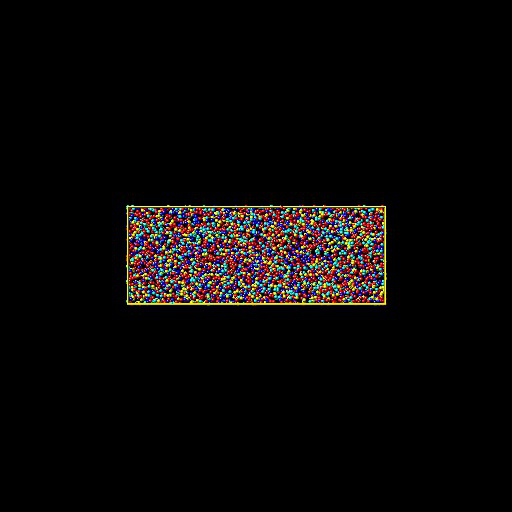

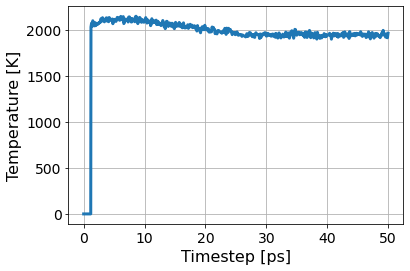

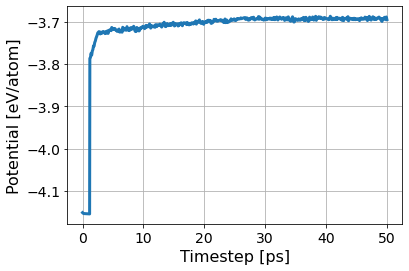

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8326b128ff874112bd244ce6161b7df7/inputs.yaml
       RUNS/8326b128ff874112bd244ce6161b7df7
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8326b128ff874112bd244ce6161b7df7/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:41<00:00, 44.85s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8326b128ff874112bd244ce6161b7df7/inputs.yaml
       RUNS/8326b128ff874112bd244ce6161b7df7
Predicted melting temperature for this potential:  1974.774070149254
95% confidence interval:  2.8939095244354176
Fraction of system solid:  0.310546875
Fraction of system liquid:  0.6710069444444444
Simulation Success Flag 0.0
Crystal Structure Info:  [1431.   49.   22.   14.    0. 3092. 4608.]


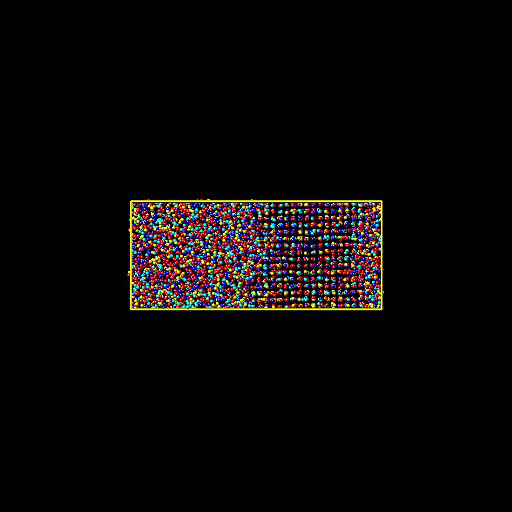

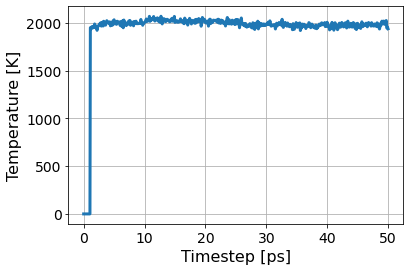

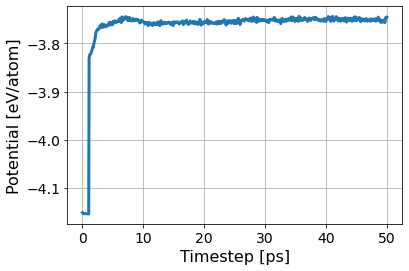

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9ca8650cb8ea4bafb68245d19b28a124/inputs.yaml
       RUNS/9ca8650cb8ea4bafb68245d19b28a124
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9ca8650cb8ea4bafb68245d19b28a124/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [19:14<00:00, 46.17s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9ca8650cb8ea4bafb68245d19b28a124/inputs.yaml
       RUNS/9ca8650cb8ea4bafb68245d19b28a124
Predicted melting temperature for this potential:  1971.728371641791
95% confidence interval:  2.8736525541758087
Fraction of system solid:  0.4963107638888889
Fraction of system liquid:  0.4858940972222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2.287e+03 4.800e+01 2.000e+01 1.300e+01 1.000e+00 2.239e+03 4.608e+03]


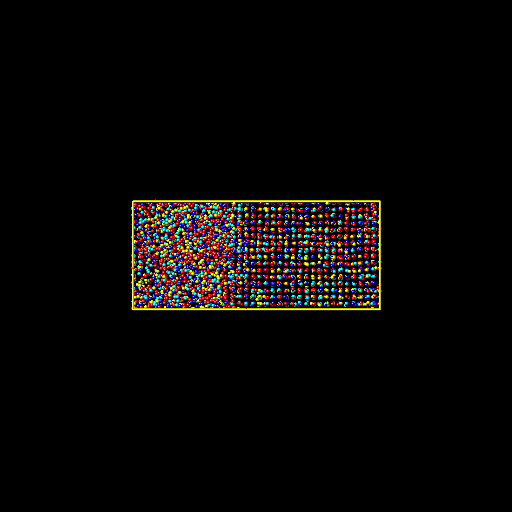

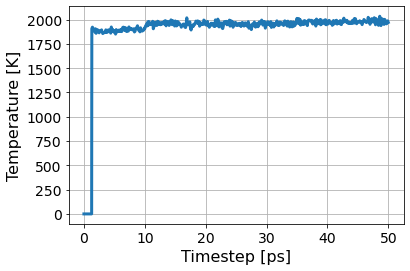

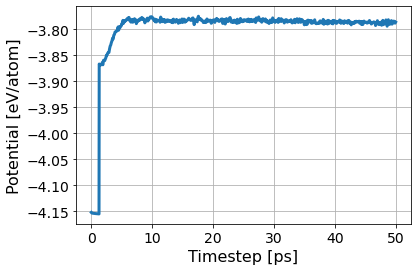

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  29
444
[0.2, 0.3, 0.2, 0.0, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0a0448ab561e4ea5bed8639e7786a876/inputs.yaml
       RUNS/0a0448ab561e4ea5bed8639e7786a876
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0a0448ab561e4ea5bed8639e7786a876/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [19:02<00:00, 45.69s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0a0448ab561e4ea5bed8639e7786a876/inputs.yaml
       RUNS/0a0448ab561e4ea5bed8639e7786a876
Predicted melting temperature for this potential:  1937.850177114428
95% confidence interval:  2.6368626839622147
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 2.100e+01 2.000e+00 3.200e+01 0.000e+00 4.551e+03 4.608e+03]


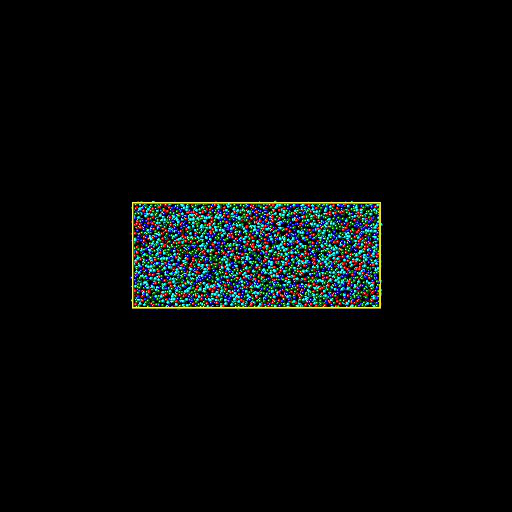

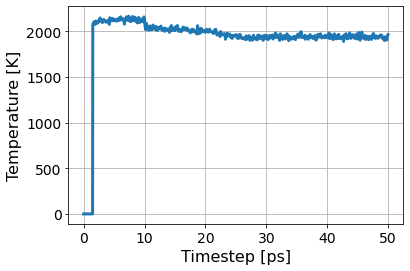

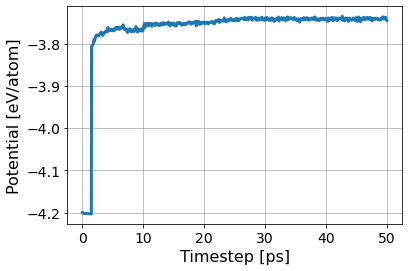

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d6b1918a1997473ab6d82c6017c91814/inputs.yaml
       RUNS/d6b1918a1997473ab6d82c6017c91814
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d6b1918a1997473ab6d82c6017c91814/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:39<00:00, 44.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d6b1918a1997473ab6d82c6017c91814/inputs.yaml
       RUNS/d6b1918a1997473ab6d82c6017c91814
Predicted melting temperature for this potential:  1940.966096517413
95% confidence interval:  3.12117457901286
Fraction of system solid:  0.21484375
Fraction of system liquid:  0.7690972222222222
Simulation Success Flag 0.0
Crystal Structure Info:  [9.900e+02 4.800e+01 1.600e+01 9.000e+00 1.000e+00 3.544e+03 4.608e+03]


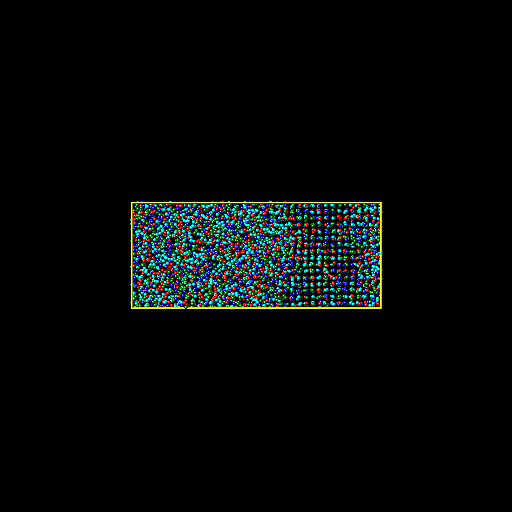

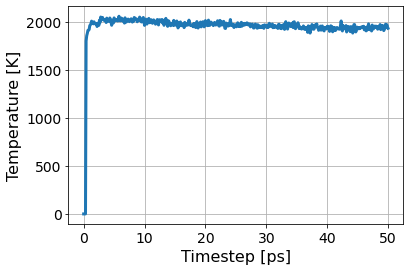

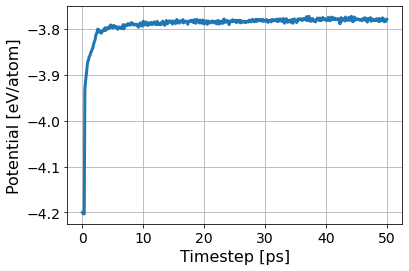

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54ac44110b1c41aaaebbc1986bfe6822/inputs.yaml
       RUNS/54ac44110b1c41aaaebbc1986bfe6822
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/54ac44110b1c41aaaebbc1986bfe6822/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:59<00:00, 45.56s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/54ac44110b1c41aaaebbc1986bfe6822/inputs.yaml
       RUNS/54ac44110b1c41aaaebbc1986bfe6822
Predicted melting temperature for this potential:  1902.2947597014927
95% confidence interval:  2.644780077333279
Fraction of system solid:  0.3932291666666667
Fraction of system liquid:  0.5896267361111112
Simulation Success Flag 1.0
Crystal Structure Info:  [1.812e+03 4.200e+01 2.800e+01 8.000e+00 1.000e+00 2.717e+03 4.608e+03]


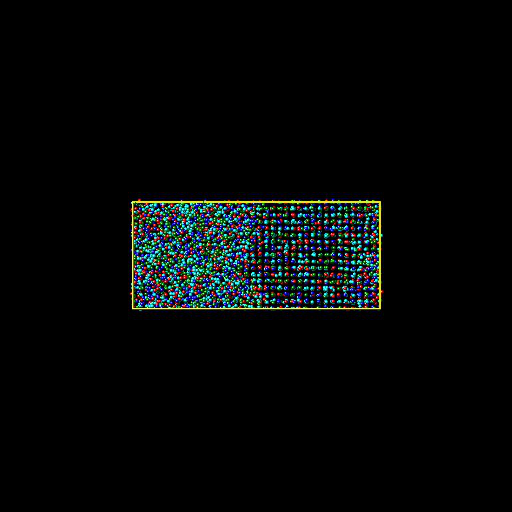

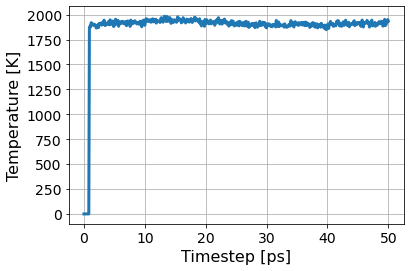

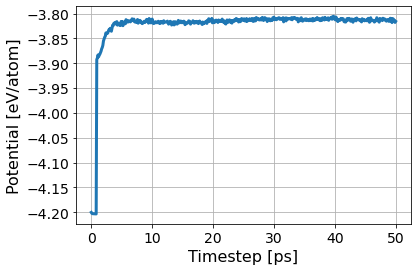

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  30
106
[0.2, 0.0, 0.4, 0.4, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/162a9e44ed204c2a8c18c08725bf90bf/inputs.yaml
       RUNS/162a9e44ed204c2a8c18c08725bf90bf
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/162a9e44ed204c2a8c18c08725bf90bf/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:26<00:00, 41.85s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/162a9e44ed204c2a8c18c08725bf90bf/inputs.yaml
       RUNS/162a9e44ed204c2a8c18c08725bf90bf
Predicted melting temperature for this potential:  2234.3615870646768
95% confidence interval:  2.7326073206939374
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.9945746527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 8.000e+00 2.000e+00 1.300e+01 1.000e+00 4.583e+03 4.608e+03]


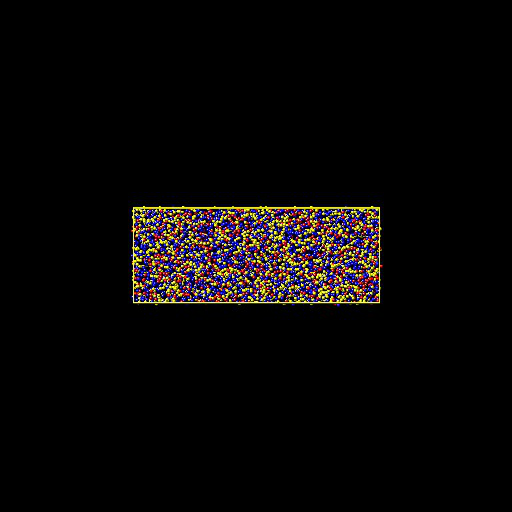

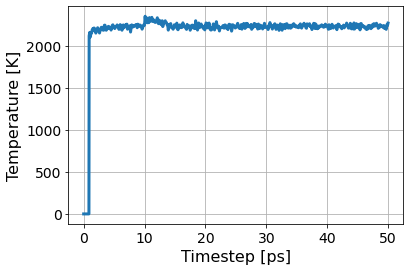

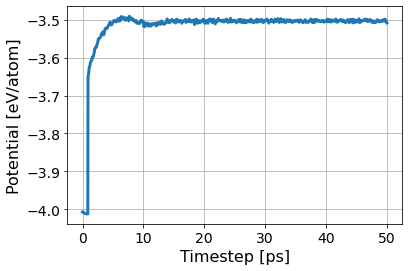

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/79f0e79519ed45208b9c35de36cb89a5/inputs.yaml
       RUNS/79f0e79519ed45208b9c35de36cb89a5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/79f0e79519ed45208b9c35de36cb89a5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:32<00:00, 42.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/79f0e79519ed45208b9c35de36cb89a5/inputs.yaml
       RUNS/79f0e79519ed45208b9c35de36cb89a5
Predicted melting temperature for this potential:  2088.6965094527363
95% confidence interval:  3.02368430288996
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9884982638888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.100e+01 3.000e+00 2.200e+01 1.000e+00 4.555e+03 4.608e+03]


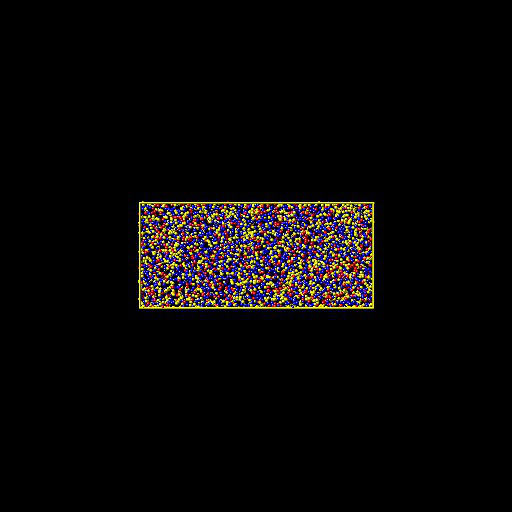

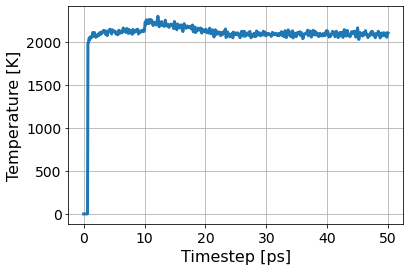

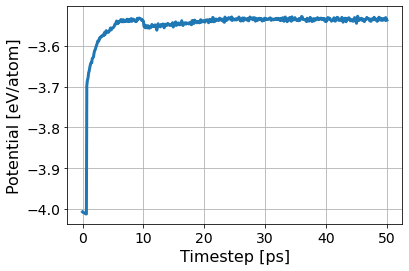

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d9cff2c1f835460f9407a8c9cb79a4ee/inputs.yaml
       RUNS/d9cff2c1f835460f9407a8c9cb79a4ee
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d9cff2c1f835460f9407a8c9cb79a4ee/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:50<00:00, 42.80s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d9cff2c1f835460f9407a8c9cb79a4ee/inputs.yaml
       RUNS/d9cff2c1f835460f9407a8c9cb79a4ee
Predicted melting temperature for this potential:  1985.2035562189053
95% confidence interval:  2.971201179712099
Fraction of system solid:  0.1351996527777778
Fraction of system liquid:  0.8465711805555556
Simulation Success Flag 0.0
Crystal Structure Info:  [6.230e+02 4.300e+01 2.000e+01 1.900e+01 2.000e+00 3.901e+03 4.608e+03]


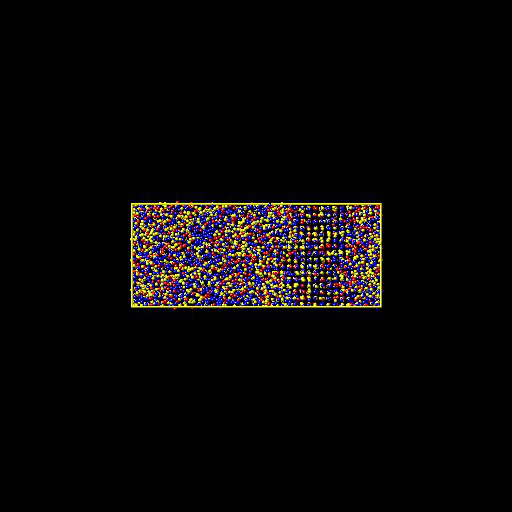

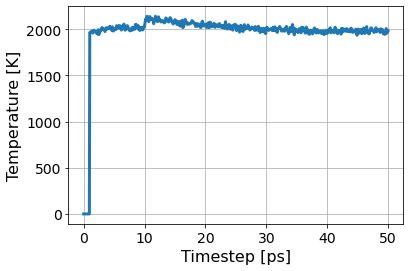

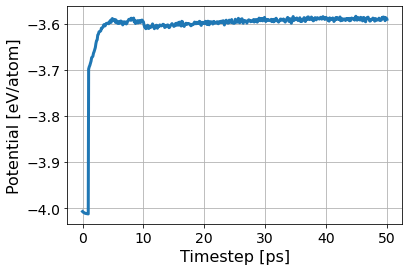

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f8efac5aed104a4cae5c009c639dd568/inputs.yaml
       RUNS/f8efac5aed104a4cae5c009c639dd568
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f8efac5aed104a4cae5c009c639dd568/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:54<00:00, 42.96s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f8efac5aed104a4cae5c009c639dd568/inputs.yaml
       RUNS/f8efac5aed104a4cae5c009c639dd568
Predicted melting temperature for this potential:  1979.9770049751246
95% confidence interval:  2.9045184066009204
Fraction of system solid:  0.3702256944444444
Fraction of system liquid:  0.6161024305555556
Simulation Success Flag 1.0
Crystal Structure Info:  [1706.   44.   14.    5.    0. 2839. 4608.]


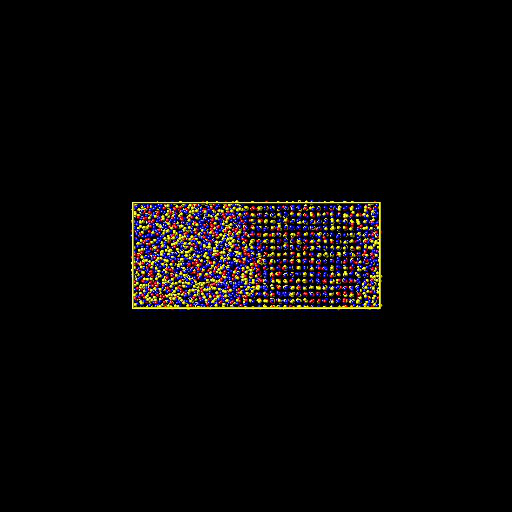

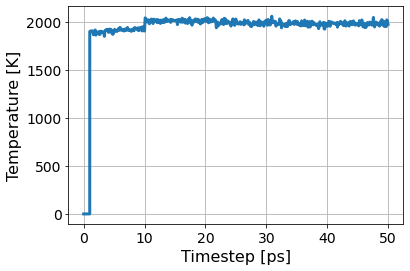

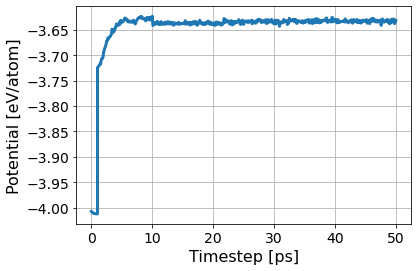

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  31
383
[0.4, 0.2, 0.2, 0.0, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/06aa8c117d914a6199dd6fc8d8a535a2/inputs.yaml
       RUNS/06aa8c117d914a6199dd6fc8d8a535a2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/06aa8c117d914a6199dd6fc8d8a535a2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:44<00:00, 44.97s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/06aa8c117d914a6199dd6fc8d8a535a2/inputs.yaml
       RUNS/06aa8c117d914a6199dd6fc8d8a535a2
Predicted melting temperature for this potential:  1935.7837955223881
95% confidence interval:  2.599963504145198
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9932725694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 9.000e+00 1.000e+00 1.700e+01 1.000e+00 4.577e+03 4.608e+03]


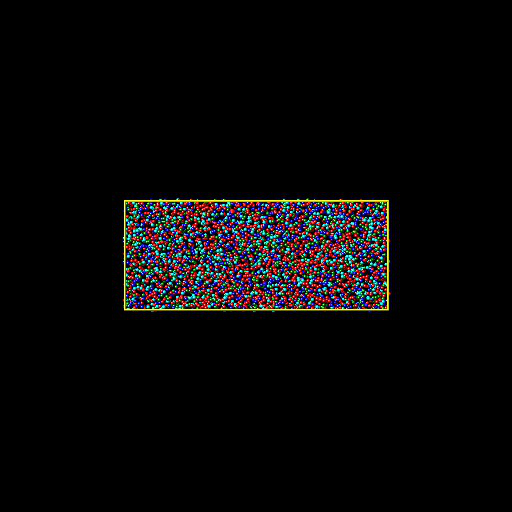

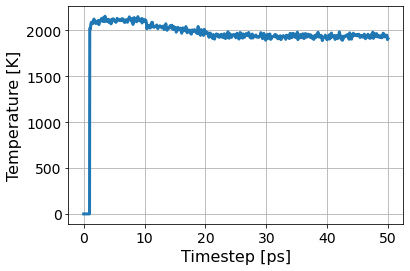

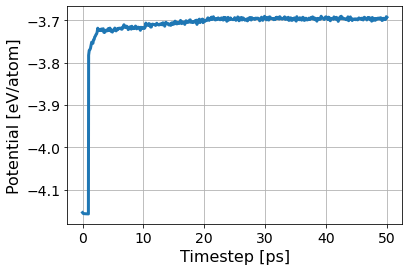

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2d3b19192b824bb5a9f9e7159149d42d/inputs.yaml
       RUNS/2d3b19192b824bb5a9f9e7159149d42d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2d3b19192b824bb5a9f9e7159149d42d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:45<00:00, 45.01s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2d3b19192b824bb5a9f9e7159149d42d/inputs.yaml
       RUNS/2d3b19192b824bb5a9f9e7159149d42d
Predicted melting temperature for this potential:  1835.8782651741294
95% confidence interval:  4.345746869203794
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.986328125
Simulation Success Flag 0.0
Crystal Structure Info:  [   8.   16.    0.   39.    0. 4545. 4608.]


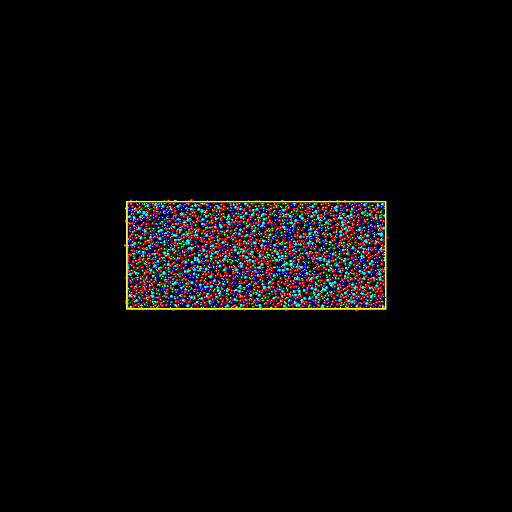

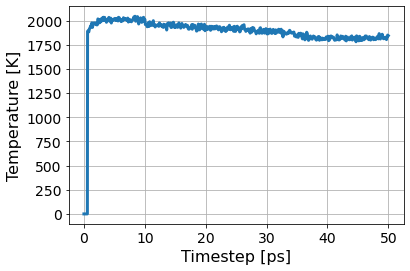

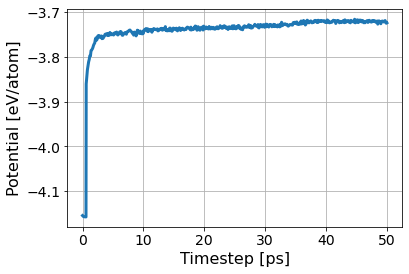

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/37ece633723a45f1aebd3ebc4202f1a7/inputs.yaml
       RUNS/37ece633723a45f1aebd3ebc4202f1a7
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/37ece633723a45f1aebd3ebc4202f1a7/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:56<00:00, 45.45s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/37ece633723a45f1aebd3ebc4202f1a7/inputs.yaml
       RUNS/37ece633723a45f1aebd3ebc4202f1a7
Predicted melting temperature for this potential:  1881.7341736318408
95% confidence interval:  2.5743778544893763
Fraction of system solid:  0.3075086805555556
Fraction of system liquid:  0.6790364583333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1417.   34.   16.   12.    0. 3129. 4608.]


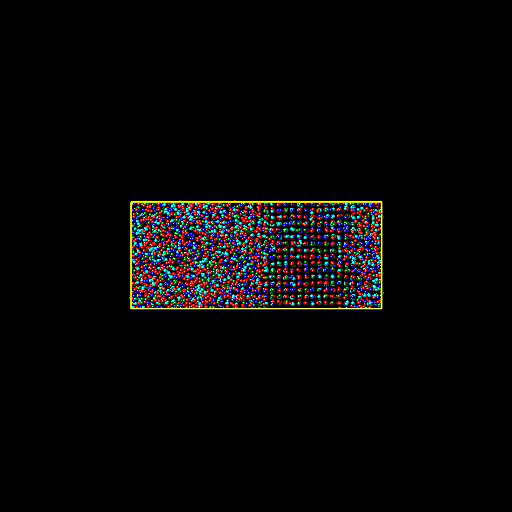

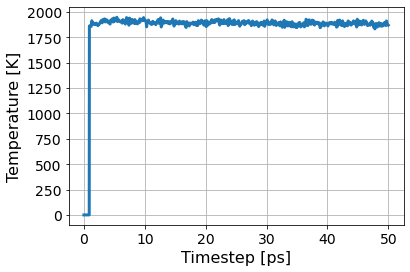

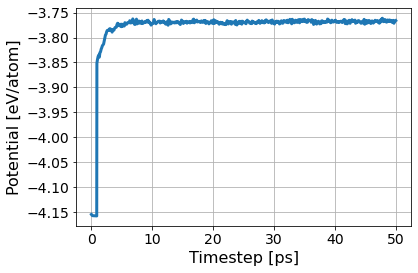

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ae34646d93544d9ab8bc3eb17cd9750e/inputs.yaml
       RUNS/ae34646d93544d9ab8bc3eb17cd9750e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ae34646d93544d9ab8bc3eb17cd9750e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [19:25<00:00, 46.61s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ae34646d93544d9ab8bc3eb17cd9750e/inputs.yaml
       RUNS/ae34646d93544d9ab8bc3eb17cd9750e
Predicted melting temperature for this potential:  1834.448964676617
95% confidence interval:  2.6195864179235535
Fraction of system solid:  0.4368489583333333
Fraction of system liquid:  0.5503472222222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2.013e+03 3.200e+01 1.500e+01 1.100e+01 1.000e+00 2.536e+03 4.608e+03]


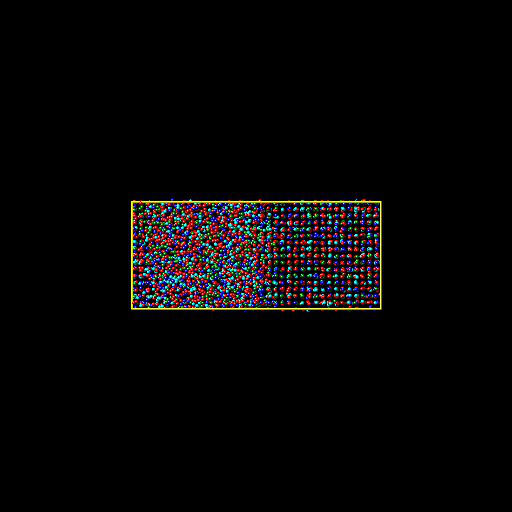

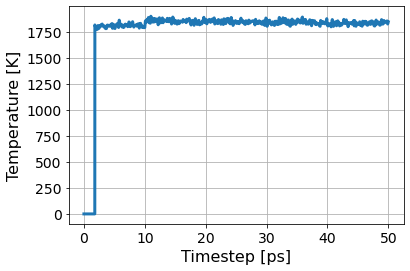

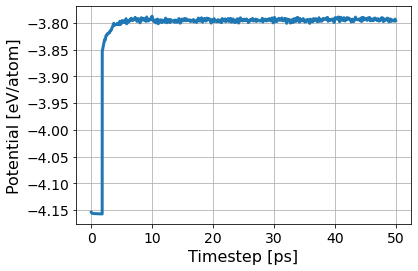

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  32
563
[0.1, 0.5, 0.0, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a427b283753341559f711f2d84baf13d/inputs.yaml
       RUNS/a427b283753341559f711f2d84baf13d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a427b283753341559f711f2d84baf13d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:27<00:00, 44.28s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a427b283753341559f711f2d84baf13d/inputs.yaml
       RUNS/a427b283753341559f711f2d84baf13d
Predicted melting temperature for this potential:  2150.728655721393
95% confidence interval:  2.6944463332314195
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9830729166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [   5.   32.    6.   35.    0. 4530. 4608.]


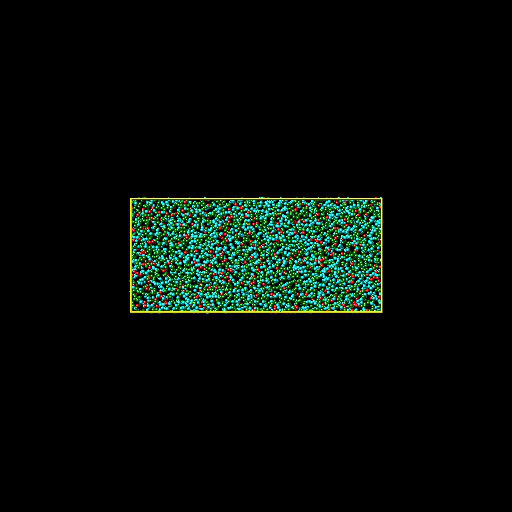

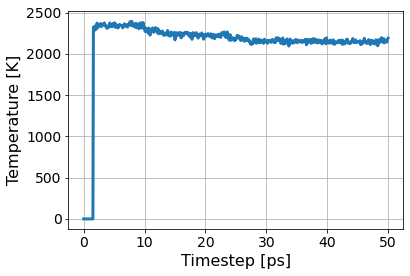

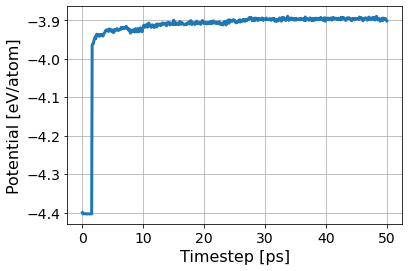

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6d55b3b61fa346a696185793724d2f4b/inputs.yaml
       RUNS/6d55b3b61fa346a696185793724d2f4b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6d55b3b61fa346a696185793724d2f4b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:05<00:00, 43.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6d55b3b61fa346a696185793724d2f4b/inputs.yaml
       RUNS/6d55b3b61fa346a696185793724d2f4b
Predicted melting temperature for this potential:  2134.0309323383085
95% confidence interval:  3.0674738968121478
Fraction of system solid:  0.2009548611111111
Fraction of system liquid:  0.7782118055555556
Simulation Success Flag 0.0
Crystal Structure Info:  [ 926.   55.   26.   15.    0. 3586. 4608.]


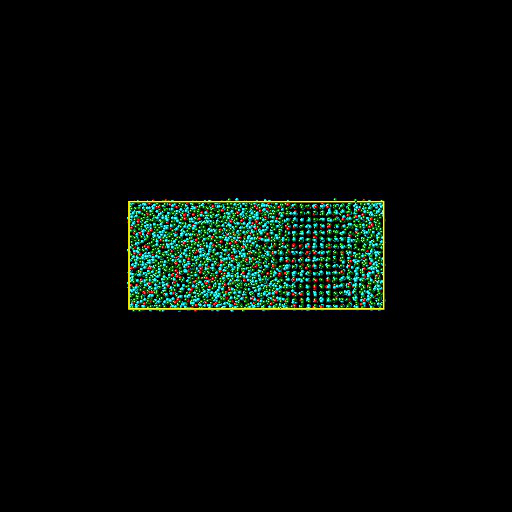

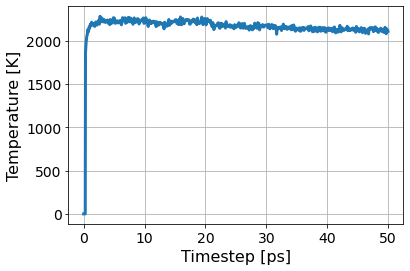

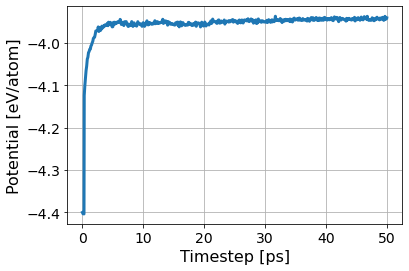

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/09da5d9d34d54616b3185b69052fcf16/inputs.yaml
       RUNS/09da5d9d34d54616b3185b69052fcf16
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/09da5d9d34d54616b3185b69052fcf16/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:24<00:00, 44.16s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/09da5d9d34d54616b3185b69052fcf16/inputs.yaml
       RUNS/09da5d9d34d54616b3185b69052fcf16
Predicted melting temperature for this potential:  2145.7136890547263
95% confidence interval:  2.7805961441455795
Fraction of system solid:  0.4383680555555556
Fraction of system liquid:  0.5390625
Simulation Success Flag 1.0
Crystal Structure Info:  [2.020e+03 6.700e+01 2.300e+01 1.300e+01 1.000e+00 2.484e+03 4.608e+03]


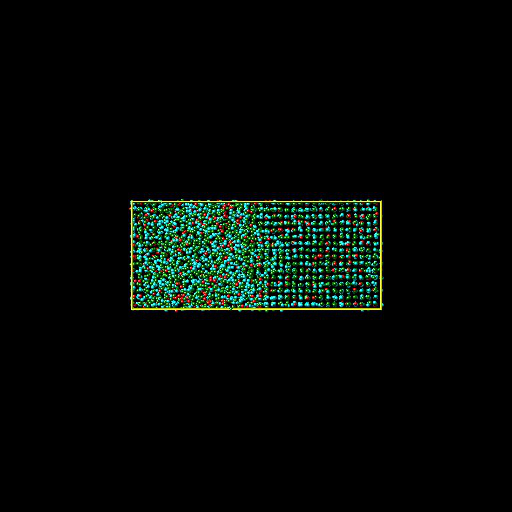

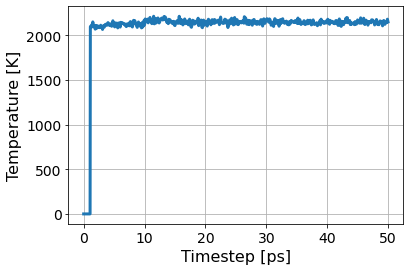

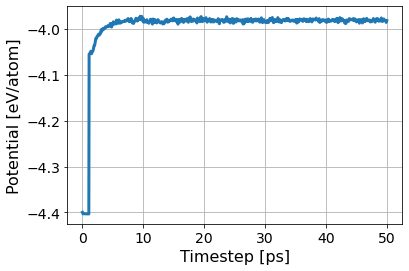

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  33
174
[0.5, 0.0, 0.3, 0.2, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2f092de6dba44abd99fa54e3ab819e66/inputs.yaml
       RUNS/2f092de6dba44abd99fa54e3ab819e66
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2f092de6dba44abd99fa54e3ab819e66/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:05<00:00, 43.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2f092de6dba44abd99fa54e3ab819e66/inputs.yaml
       RUNS/2f092de6dba44abd99fa54e3ab819e66
Predicted melting temperature for this potential:  1926.6217114427864
95% confidence interval:  2.57837333804514
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9869791666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.200e+01 3.000e+00 2.600e+01 3.000e+00 4.548e+03 4.608e+03]


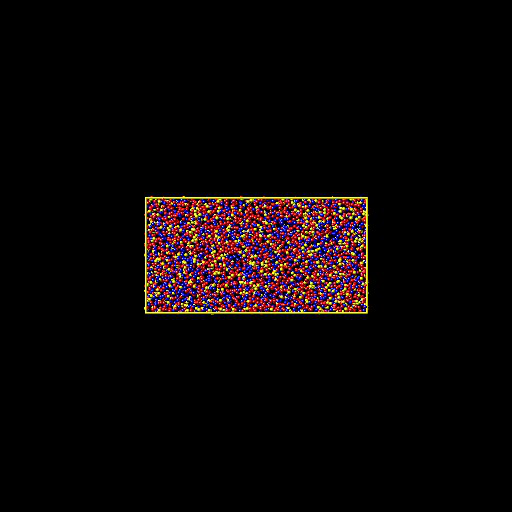

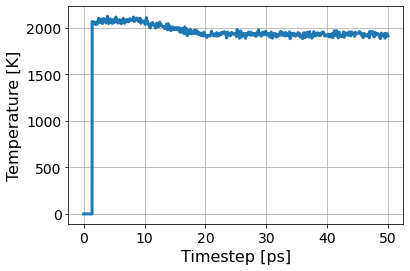

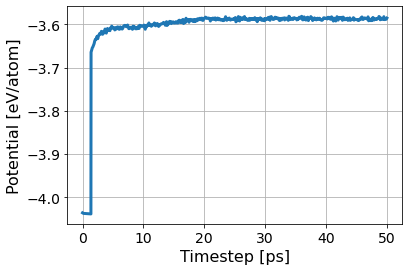

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3f0190af31fd4694b4eee8c0ed74b9f9/inputs.yaml
       RUNS/3f0190af31fd4694b4eee8c0ed74b9f9
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3f0190af31fd4694b4eee8c0ed74b9f9/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:51<00:00, 42.88s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3f0190af31fd4694b4eee8c0ed74b9f9/inputs.yaml
       RUNS/3f0190af31fd4694b4eee8c0ed74b9f9
Predicted melting temperature for this potential:  1848.103574129353
95% confidence interval:  4.6990503302042965
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9880642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.100e+01 0.000e+00 2.800e+01 1.000e+00 4.553e+03 4.608e+03]


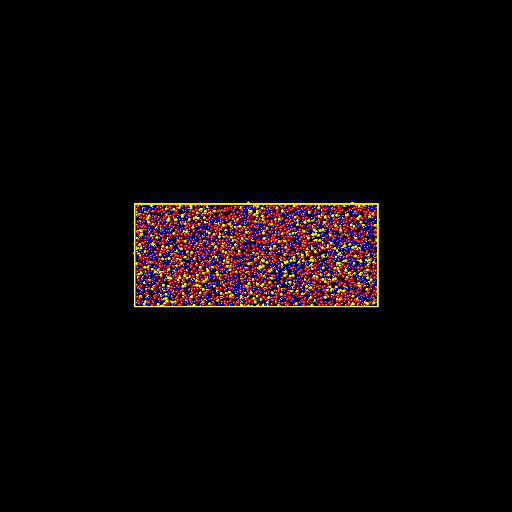

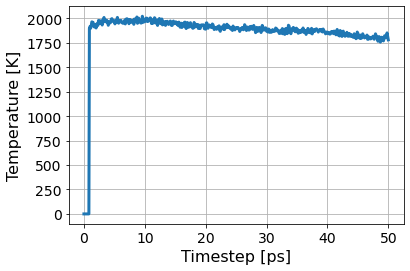

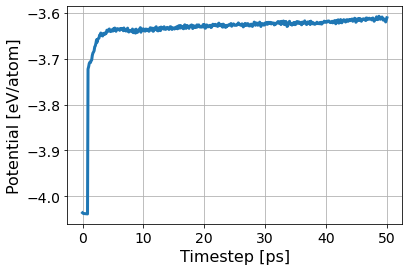

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/14e6f2fe10124848a96674021d8529b0/inputs.yaml
       RUNS/14e6f2fe10124848a96674021d8529b0
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/14e6f2fe10124848a96674021d8529b0/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.05s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/14e6f2fe10124848a96674021d8529b0/inputs.yaml
       RUNS/14e6f2fe10124848a96674021d8529b0
Predicted melting temperature for this potential:  1877.8284169154228
95% confidence interval:  2.4935336003558537
Fraction of system solid:  0.3029513888888889
Fraction of system liquid:  0.6818576388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1396.   42.   14.   14.    0. 3142. 4608.]


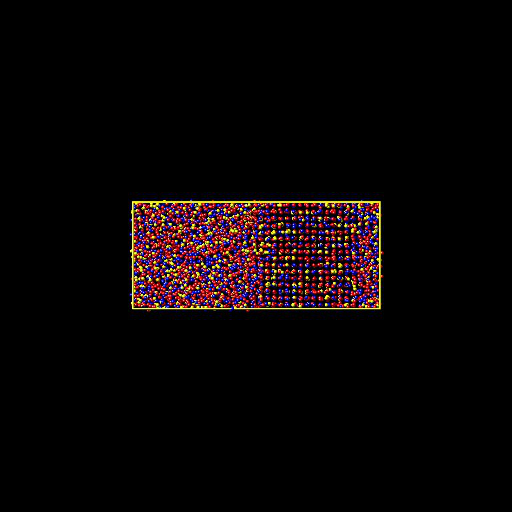

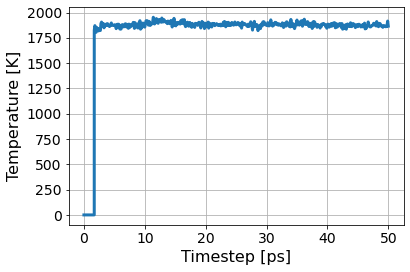

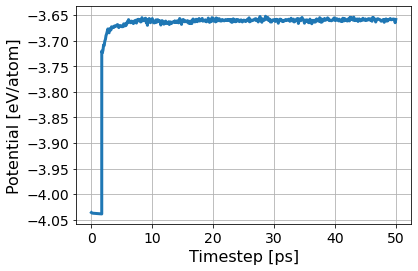

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f1852ed4b7d64ffcbfe223227cef260e/inputs.yaml
       RUNS/f1852ed4b7d64ffcbfe223227cef260e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f1852ed4b7d64ffcbfe223227cef260e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:31<00:00, 44.45s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f1852ed4b7d64ffcbfe223227cef260e/inputs.yaml
       RUNS/f1852ed4b7d64ffcbfe223227cef260e
Predicted melting temperature for this potential:  1872.5135368159201
95% confidence interval:  3.195610190786028
Fraction of system solid:  0.4813368055555556
Fraction of system liquid:  0.5028211805555556
Simulation Success Flag 1.0
Crystal Structure Info:  [2.218e+03 4.100e+01 2.200e+01 9.000e+00 1.000e+00 2.317e+03 4.608e+03]


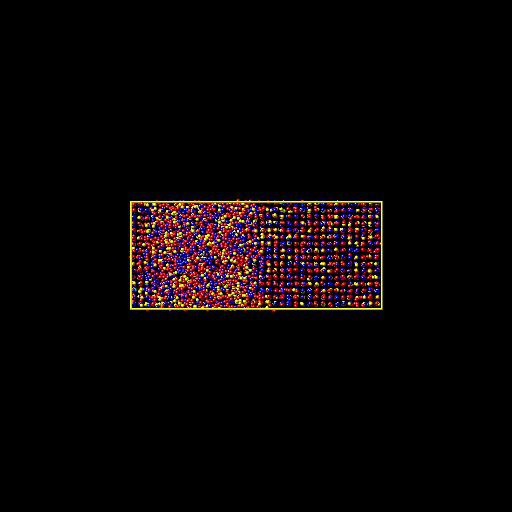

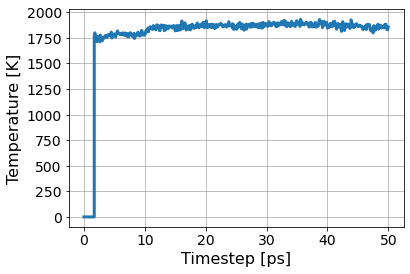

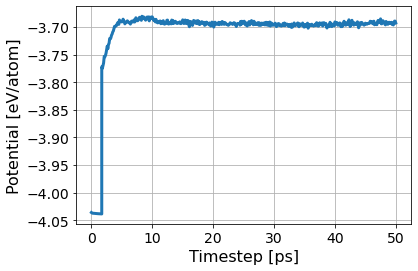

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  34
502
[0.1, 0.4, 0.1, 0.0, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/27ac7f66c8604b67abf226dd98869783/inputs.yaml
       RUNS/27ac7f66c8604b67abf226dd98869783
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/27ac7f66c8604b67abf226dd98869783/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:50<00:00, 45.21s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/27ac7f66c8604b67abf226dd98869783/inputs.yaml
       RUNS/27ac7f66c8604b67abf226dd98869783
Predicted melting temperature for this potential:  2042.616253731343
95% confidence interval:  2.6678542984379225
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 2.100e+01 2.000e+00 2.500e+01 2.000e+00 4.551e+03 4.608e+03]


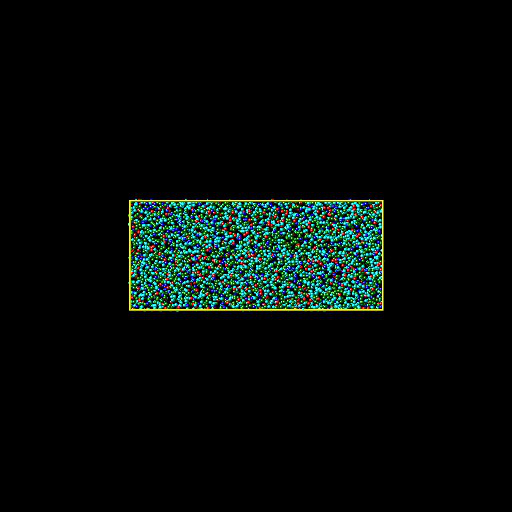

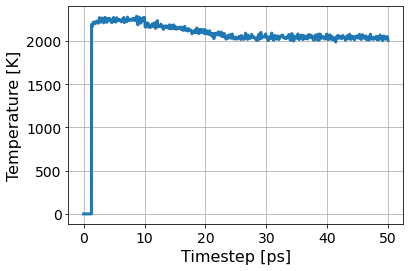

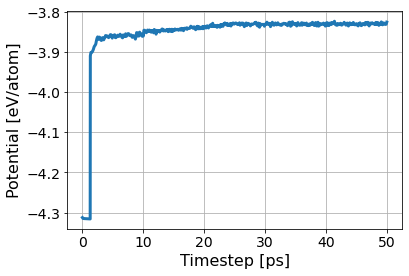

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/40c4b0b130cf49bbab41ef7fa1c80850/inputs.yaml
       RUNS/40c4b0b130cf49bbab41ef7fa1c80850
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/40c4b0b130cf49bbab41ef7fa1c80850/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing:  52%|??????    | 13/25 [00:20<00:07,  1.61cell/s]

In [ ]:
n_steps = 40 #number of expirements
all_inds = set(range(len(y))) #set indexes
actaul_exp = np.sum(in_train)-len(initial_data)
gif_images = [] #list to save gifs as 2D array

history_train = [list(set(np.where(in_train)[0].tolist()))]
current_train_inds = []
#reset_comps = all_compositions.reset_index(drop=True)

#Create dataframe to save values to make into excel
saved_data = pd.DataFrame(columns=['IAF','Composition','Experiment',"Simulated Tm","Predicted Tm","Predicted Uncertainty","T_Solid","T_Liquid","Index"])
df2 = pd.DataFrame(columns = sample)

patience_counter = 0

print(len(history_train[-1]))

for i in range(n_steps):

    print("-------------------------------------------------------------")
    print("Experiment # ", i)
    
    current_train_inds = history_train[-1].copy()

    current_search_inds = list(all_inds.difference(current_train_inds))
    
    #Random Forest fitting and predicting
    model.fit(X[current_train_inds], y[current_train_inds]) #train model, with entry_number
    current_y_pred, current_y_std = model.predict(X[current_search_inds], return_std=True) #pred

    # ACQUISITION FUNCTIONS
    
    # EARLY STOPPING / ACQUISITION
    
    iaf = "MU"
    
    if iaf == "MEI":
    
        index_of_prediction = np.argmax(current_y_pred)    # MEI   
        
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    elif iaf == "UCB":
        
        index_of_prediction = np.argmax([sum(x) for x in zip(current_y_pred, current_y_std)]) # UCB     
        
        if np.max([sum(x) for x in zip(current_y_pred, current_y_std)]) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0        
    
    elif iaf == "MLI":
    
        index_of_prediction = np.argmax(np.divide(current_y_pred - np.max(y[current_train_inds]), current_y_std)) # MLI
    
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    
    elif iaf == "MU":
        
        index_of_prediction = np.argmax(current_y_std) # MU
        
        if np.max(current_y_std) < 50:
            patience_counter +=1
        else:
            patience_counter = 0
        
        
    else:
        index_of_prediction = np.random.choice(current_search_inds)           # Random    
    
#     if patience_counter > 15:
#         print("Early Stop")
#         break
        
    chosen_index_forsimul = current_search_inds[index_of_prediction]    
    composition_forsimul = all_compositions.iloc[chosen_index_forsimul] #compositions for simulation
    
    #printing index and compistion
    print(chosen_index_forsimul)
    print(list(composition_forsimul))

    # RUNNING MELTHEAS SIM

    # setting inputs
    sim_gif = []
    flag = False
    plus = 0.50
    minus = 0.25    
    iteration = 0
    
    T_ROM = current_y_pred[index_of_prediction]    
    
    while (flag == False):
        inputs = getSimToolInputs(MeltHEA)
        
        random_seed = int(np.random.randint(1,10000,1)[0])
        velocity_seed = int(np.random.randint(1,10000,1)[0])
        
        inputs.rand_seed.value = random_seed
        inputs.velocity_seed.value = velocity_seed
                
        inputs.time.value = 50000
        inputs.box_length.value = 18
        c1, c2, c3, c4, c5 = list(composition_forsimul)
        inputs.composition1.value = c1
        inputs.composition2.value = c2
        inputs.composition3.value = c3
        inputs.composition4.value = c4
        inputs.composition5.value = c5
        
        inputs.Tsolid.value = (T_ROM-(T_ROM*minus))
        inputs.Tliquid.value = (T_ROM+(T_ROM*plus))

        # running and outputs 
        r = Run(MeltHEA, inputs)

        melting_temperature_obtained = r.read('melting_temperature')
        flag = r.read('successful')
        fraction_solid = r.read('fraction_solid')
        fraction_liquid = r.read('fraction_liquid')
        sim_gif.append(r.read('final_snapshot'))

        print ("Predicted melting temperature for this potential: ", (r.read('melting_temperature')))
        print ("95% confidence interval: ", (r.read('melting_temperature_ci')))
        print ("Fraction of system solid: ", (r.read('fraction_solid')))
        print ("Fraction of system liquid: ", (r.read('fraction_liquid')))
        print ("Simulation Success Flag", (r.read('successful')))
        print ('Crystal Structure Info: ', r.read('counts_array'))
        display(r.read('final_snapshot'))

        if (flag == False):
            if fraction_solid >= fraction_liquid:
                T_ROM += T_ROM*.05 #~80
            elif fraction_liquid >= fraction_solid:
                T_ROM -= T_ROM*.05 #~80
                
         #Graph from the melting workflow
        import matplotlib.pyplot as plt
        #Total number of atoms for 8x8 BCC unit cell cross-section and user input box-length
        if inputs.crystal_structure.value == 'bcc':
            atom_count = 8*8*2*inputs.box_length.value

        #Total number of atoms for 8x8 FCC unit cell cross-section and user input box-length
        elif inputs.crystal_structure.value == 'fcc':
            atom_count = 8*8*4*inputs.box_length.value

        ts = r.read('time_series')

        temperature = r.read('temperature_series')
        plt.plot((ts/1000),temperature,linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Temperature [K]',fontsize=16)
        plt.grid()
        plt.show()

        potential_energy = r.read('potential_energy_series')
        plt.plot((ts/1000),np.divide(potential_energy,atom_count),linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Potential [eV/atom]',fontsize=16)
        plt.grid()
        plt.show() 

    y[chosen_index_forsimul] = melting_temperature_obtained
    
    #Ending when desired temp found
    if melting_temperature_obtained > 2600:
        continue

    current_train_inds.append(chosen_index_forsimul) #from inputs choosing untrained indexes randomly
    history_train.append(current_train_inds) #storage list, of sets of values created throughout sequential learning
    
    composition_string = " ".join([i + ' ' + str(j) for i, j in zip(["Cr","Co","Cu","Fe","Ni"], composition_forsimul)])
    
    T_Solid = inputs.Tsolid.value
    T_Liquid = inputs.Tliquid.value
    
    
    #Creating dataframe for Animation
    data = pd.DataFrame([iaf,composition_string, actaul_exp, melting_temperature_obtained, current_y_pred[index_of_prediction],
                         current_y_std[index_of_prediction], T_Solid, T_Liquid,chosen_index_forsimul, random_seed, velocity_seed])
    data = data.T
    data = data.rename(columns = {0:'IAF', 1:'Composition',2:'Experiment',3: "Simulated Tm",4: "Predicted Tm",5:"Predicted Uncertainty",6:"T_Solid",7:"T_Liquid",8:"Index", 9:"RandomSeed", 10:"VelocitySeed"})
    saved_data = saved_data.append(data)
    actaul_exp = actaul_exp + 1
    
    #Saving Information into file
    files_to_saved_data = saved_data
    if list_seq_learn:
        files_to_saved_data = saved_data.append(seq_learn_data)
    files_to_saved_data = files_to_saved_data.sort_values(by='Experiment')
    
    csv_file_name2 = '{0}_melting_8labels50pico{1}.csv'.format(iaf,len(list_seq_learn))
    files_to_saved_data.to_csv(csv_file_name2, index = False)
    
    #Getting Images for Gif
    gif_images.append(sim_gif)
    

In [ ]:
display(saved_data)

# Save Runs Into CSV

In [ ]:
if list_seq_learn:
    saved_data = saved_data.append(seq_learn_data)
saved_data = saved_data.sort_values(by='Experiment')
display(saved_data)

In [ ]:
csv_file_name2 = '{0}_melting_8labels50pico{1}.csv'.format(iaf,len(list_seq_learn))
saved_data.to_csv(csv_file_name2, index = False)